In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from glob import glob # Para encontrar os arquivos CSV facilmente

# Configurações para melhores visualizações
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)
pd.set_option('display.float_format', lambda x: '%.2f' % x) # Formatar floats

In [2]:
base_path = 'data/por_subcategoria/'
csv_files = glob(os.path.join(base_path, '*.csv'))

print(f"Arquivos CSV encontrados: {len(csv_files)}")
for f_path in csv_files: # Renomeado para evitar conflito com 'f' de formatação
    print(f_path)

dataframes_raw = {} # Dicionário para armazenar os DataFrames BRUTOS
print("\n--- Carregando DataFrames Brutos ---")
for file_path in csv_files:
    subcategory_name = os.path.basename(file_path).replace('_data.csv', '')
    try:
        df_temp = pd.read_csv(file_path, sep=';')
        dataframes_raw[subcategory_name] = df_temp
        print(f"Carregado: '{subcategory_name}' com shape {df_temp.shape}")
    except Exception as e:
        print(f"Erro ao carregar {subcategory_name} de {file_path}: {e}")
print("--- Carregamento de DataFrames Brutos Concluído ---\n")

Arquivos CSV encontrados: 11
data/por_subcategoria\99comfort_data.csv
data/por_subcategoria\99pop_data.csv
data/por_subcategoria\99poupa_data.csv
data/por_subcategoria\taxiregular_data.csv
data/por_subcategoria\taxiturbo_data.csv
data/por_subcategoria\uberbag_data.csv
data/por_subcategoria\uberblackbag_data.csv
data/por_subcategoria\uberblack_data.csv
data/por_subcategoria\ubercomfort_data.csv
data/por_subcategoria\uberpromo_data.csv
data/por_subcategoria\uberx_data.csv

--- Carregando DataFrames Brutos ---
Carregado: '99comfort' com shape (7887, 17)
Carregado: '99pop' com shape (233995, 17)
Carregado: '99poupa' com shape (115617, 17)
Carregado: 'taxiregular' com shape (215790, 17)
Carregado: 'taxiturbo' com shape (199137, 17)
Carregado: 'uberbag' com shape (73275, 17)
Carregado: 'uberblackbag' com shape (36641, 17)
Carregado: 'uberblack' com shape (123636, 17)
Carregado: 'ubercomfort' com shape (192941, 17)
Carregado: 'uberpromo' com shape (104104, 17)
Carregado: 'uberx' com shape (20

In [3]:
# Bloco 3: MODIFICADO - Limpeza de Outliers
# (O código interno do Bloco 3 permanece o mesmo, apenas a entrada muda)

print("\n==========================================================")
print("--- Iniciando Etapa 3: Limpeza de Outliers Extremos ---")
print("==========================================================\n")

cols_for_outlier_check = ['price', 'distance_m', 'duration_s']
quantile_value = 0.995
dataframes_cleaned = {} # Onde os DFs limpos serão armazenados

# Iterar sobre cada subcategoria e seu respectivo DataFrame no dicionário de DFs BRUTOS
if 'dataframes_raw' not in locals() or not dataframes_raw: # Checa se existe e não está vazio
    print("ERRO: O dicionário 'dataframes_raw' não foi encontrado ou está vazio. Certifique-se de que o Bloco 2 foi executado e carregou os dados.")
else:
    for subcategory_name, df_original in dataframes_raw.items(): # <<< MUDANÇA AQUI
        print(f"--- Limpando outliers para: {subcategory_name.upper()} ---")
        df = df_original.copy() # df_original vem de dataframes_raw

        if df.empty:
            print("DataFrame vazio. Pulando limpeza.")
            dataframes_cleaned[subcategory_name] = df
            continue

        valid_cols_for_check = [col for col in cols_for_outlier_check if col in df.columns]
        if not valid_cols_for_check:
            print(f"Nenhuma das colunas {cols_for_outlier_check} encontrada. Pulando limpeza.")
            dataframes_cleaned[subcategory_name] = df
            continue

        print(f"Shape original: {df.shape}")
        original_row_count = len(df)
        thresholds = {}
        print(f"Calculando limites do quantil {quantile_value}:")
        temp_valid_cols = list(valid_cols_for_check) # Copia para iterar e modificar
        for col in temp_valid_cols:
            try:
                q_threshold = df[col].quantile(quantile_value)
                if pd.isna(q_threshold):
                     print(f"  - Aviso: Quantil para '{col}' resultou em NaN. Removendo da checagem.")
                     valid_cols_for_check.remove(col) # Remove da lista original
                else:
                    thresholds[col] = q_threshold
                    print(f"  - Limite para '{col}': {thresholds[col]:.2f}")
            except TypeError as e:
                print(f"  - Erro ao calcular quantil para '{col}': {e}. Removendo da checagem.")
                if col in valid_cols_for_check: valid_cols_for_check.remove(col)
        
        if not valid_cols_for_check: # Checa novamente após possíveis remoções
             print("Nenhum limite válido pôde ser calculado. Pulando filtragem.")
             dataframes_cleaned[subcategory_name] = df
             continue

        combined_mask = pd.Series([False] * len(df), index=df.index)
        for col in valid_cols_for_check: # Usa a lista atualizada de valid_cols_for_check
             combined_mask = combined_mask | (df[col] > thresholds[col])
        
        df_cleaned_loop = df[~combined_mask] # Use um nome diferente para o DF limpo no loop
        cleaned_row_count = len(df_cleaned_loop)
        rows_removed = original_row_count - cleaned_row_count
        percent_removed = (rows_removed / original_row_count) * 100 if original_row_count > 0 else 0

        print(f"Shape após limpeza: {df_cleaned_loop.shape}")
        print(f"Linhas removidas: {rows_removed} ({percent_removed:.2f}%)")
        dataframes_cleaned[subcategory_name] = df_cleaned_loop # Armazena o DF limpo
        print("-" * 30)

    print("\n=====================================================")
    print("--- Fim da Etapa 3: Limpeza de Outliers Concluída ---")
    print("=====================================================\n")
    # Agora dataframes_cleaned deve estar populado


--- Iniciando Etapa 3: Limpeza de Outliers Extremos ---

--- Limpando outliers para: 99COMFORT ---
Shape original: (7887, 17)
Calculando limites do quantil 0.995:
  - Limite para 'price': 242.77
  - Limite para 'distance_m': 72765.68
  - Limite para 'duration_s': 3809.64
Shape após limpeza: (7829, 17)
Linhas removidas: 58 (0.74%)
------------------------------
--- Limpando outliers para: 99POP ---
Shape original: (233995, 17)
Calculando limites do quantil 0.995:
  - Limite para 'price': 191.88
  - Limite para 'distance_m': 66675.75
  - Limite para 'duration_s': 3829.57
Shape após limpeza: (232142, 17)
Linhas removidas: 1853 (0.79%)
------------------------------
--- Limpando outliers para: 99POUPA ---
Shape original: (115617, 17)
Calculando limites do quantil 0.995:
  - Limite para 'price': 177.02
  - Limite para 'distance_m': 60632.59
  - Limite para 'duration_s': 3711.28
Shape após limpeza: (114450, 17)
Linhas removidas: 1167 (1.01%)
------------------------------
--- Limpando outli

In [4]:
# NOVO BLOCO (ou adicionar ao final do Bloco 3)
# Bloco 3.5: Engenharia de Feature - Adicionar 'is_peak_hour'

print("\n====================================================================")
print("--- Iniciando Bloco 3.5: Engenharia de Feature - Horário de Pico ---")
print("====================================================================\n")

# Certifique-se de que está usando o dicionário correto com os dataframes limpos
# Se você usou 'dataframes_cleaned' no Bloco 3, use-o aqui.
# Se você modificou 'dataframes' in-place no Bloco 3, use 'dataframes'.
# Pela nossa discussão anterior, 'dataframes_cleaned' é o correto.

if 'dataframes_cleaned' not in locals() or not dataframes_cleaned:
    print("ERRO: Dicionário 'dataframes_cleaned' não encontrado ou está vazio. Execute os blocos anteriores.")
else:
    for subcategory_name, df in dataframes_cleaned.items():
        print(f"--- Adicionando 'is_peak_hour' para: {subcategory_name.upper()} ---")

        if df.empty:
            print("DataFrame vazio. Pulando adição da feature.")
            continue

        # Verificar se a coluna 'hour' existe. Se não, tentar criar a partir de 'datetime' ou 'hour_min'
        if 'hour' not in df.columns:
            print("Coluna 'hour' não encontrada. Tentando criar...")
            if 'datetime' in df.columns:
                try:
                    # Converter para datetime se ainda não for, tratando erros
                    if not pd.api.types.is_datetime64_any_dtype(df['datetime']):
                        df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
                    
                    # Remover linhas onde a conversão de datetime falhou (resultou em NaT)
                    # Isso é importante para evitar erros na extração da hora
                    original_len = len(df)
                    df.dropna(subset=['datetime'], inplace=True)
                    if len(df) < original_len:
                        print(f"  Removidas {original_len - len(df)} linhas devido a 'datetime' inválido.")

                    if not df.empty: # Checar se o df ainda tem dados após dropar NaT
                         df['hour'] = df['datetime'].dt.hour
                         print("  Coluna 'hour' criada a partir de 'datetime'.")
                    else:
                        print("  DataFrame ficou vazio após remover 'datetime' inválidos. Não foi possível criar 'hour'.")
                        continue # Pula para o próximo dataframe no loop
                except Exception as e:
                    print(f"  Erro ao criar 'hour' de 'datetime': {e}. Pulando esta feature para {subcategory_name}.")
                    continue # Pula para o próximo dataframe no loop
            elif 'hour_min' in df.columns: # Fallback para hour_min
                try:
                    # Supondo que hour_min é algo como 14.5 ou "14:30"
                    if df['hour_min'].dtype == 'object':
                        df['hour'] = df['hour_min'].str.split(':').str[0].str.split('.').str[0].astype(int)
                    else: # Se for numérico como 14.5
                        df['hour'] = df['hour_min'].astype(int)
                    print("  Coluna 'hour' criada a partir de 'hour_min'.")
                except Exception as e:
                    print(f"  Erro ao criar 'hour' de 'hour_min': {e}. Pulando esta feature para {subcategory_name}.")
                    continue
            else:
                print("  Não foi possível criar a coluna 'hour' (nem 'datetime' nem 'hour_min' disponíveis/utilizáveis).")
                print("  Pulando a criação de 'is_peak_hour' para este DataFrame.")
                continue # Pula para o próximo dataframe no loop
        
        # Se, após as tentativas, a coluna 'hour' ainda não existir ou for toda NaN (pouco provável se criada com sucesso)
        if 'hour' not in df.columns or df['hour'].isnull().all():
            print(f"  Coluna 'hour' não está disponível ou é inválida. Não é possível criar 'is_peak_hour'.")
            continue

        # Definir os horários de pico
        # Manhã: 5h (inclusive) até 8h (inclusive) -> 5, 6, 7, 8
        # Tarde/Noite: 16h (inclusive) até 19h (inclusive) -> 16, 17, 18, 19
        
        # Criar a condição para pico da manhã
        peak_morning = (df['hour'] >= 5) & (df['hour'] <= 8)
        
        # Criar a condição para pico da tarde/noite
        peak_afternoon_evening = (df['hour'] >= 16) & (df['hour'] <= 19)
        
        # Combinar as condições (OU lógico) e converter para inteiro (1 para True, 0 para False)
        df['is_peak_hour'] = (peak_morning | peak_afternoon_evening).astype(int)
        
        print(f"  Coluna 'is_peak_hour' adicionada. Contagem de valores:")
        print(df['is_peak_hour'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%')
        print("-" * 30)

    print("\n====================================================================")
    print("--- Fim do Bloco 3.5: Engenharia de Feature - Horário de Pico Concluída ---")
    print("====================================================================\n")

    # Agora, 'dataframes_cleaned' contém os DataFrames com a nova coluna 'is_peak_hour'
    # O Bloco 5 (Análise Exploratória) poderá usá-la.


--- Iniciando Bloco 3.5: Engenharia de Feature - Horário de Pico ---

--- Adicionando 'is_peak_hour' para: 99COMFORT ---
Coluna 'hour' não encontrada. Tentando criar...
  Coluna 'hour' criada a partir de 'datetime'.
  Coluna 'is_peak_hour' adicionada. Contagem de valores:
is_peak_hour
0    73.93%
1    26.07%
Name: proportion, dtype: object
------------------------------
--- Adicionando 'is_peak_hour' para: 99POP ---
Coluna 'hour' não encontrada. Tentando criar...
  Coluna 'hour' criada a partir de 'datetime'.
  Coluna 'is_peak_hour' adicionada. Contagem de valores:
is_peak_hour
0    65.77%
1    34.23%
Name: proportion, dtype: object
------------------------------
--- Adicionando 'is_peak_hour' para: 99POUPA ---
Coluna 'hour' não encontrada. Tentando criar...
  Coluna 'hour' criada a partir de 'datetime'.
  Coluna 'is_peak_hour' adicionada. Contagem de valores:
is_peak_hour
0    63.22%
1    36.78%
Name: proportion, dtype: object
------------------------------
--- Adicionando 'is_peak_h

In [5]:
# Bloco 4: REVISADO - Verificação Pós-Limpeza (Opcional)
print("\n--- Verificação Rápida Pós-Limpeza (do Bloco 3) ---")
if 'dataframes_cleaned' in locals() and dataframes_cleaned:
    for subcategory_name, df_clean in dataframes_cleaned.items():
        print(f"\nVerificando: {subcategory_name.upper()} (Dados de 'dataframes_cleaned')")
        print(f"Shape: {df_clean.shape}")
        if not df_clean.empty:
            print(f"Primeiras linhas:\n{df_clean.head(2)}")
        else:
            print("DataFrame vazio.")
else:
    print("Dicionário 'dataframes_cleaned' não encontrado ou está vazio. Pule esta verificação ou revise Blocos 2 e 3.")
print("--- Fim da Verificação Rápida ---\n")


--- Verificação Rápida Pós-Limpeza (do Bloco 3) ---

Verificando: 99COMFORT (Dados de 'dataframes_cleaned')
Shape: (7829, 19)
Primeiras linhas:
   ride_id product_id subcategory  price                   datetime  \
0  1183283  comfort99   99Comfort  82.49 2021-08-17 10:22:18.554716   
1  1183372  comfort99   99Comfort  10.11 2021-08-17 10:35:29.392536   

   distance_m  duration_s  year  month  day  weekday  hour_min  is_holiday  \
0    32602.33     2619.60  2021      8   17        2     10.37           0   
1     2930.77      231.83  2021      8   17        2     10.58           0   

   hour_sin  hour_cos  weekday_sin  weekday_cos  hour  is_peak_hour  
0      0.41     -0.91         0.97        -0.22    10             0  
1      0.36     -0.93         0.97        -0.22    10             0  

Verificando: 99POP (Dados de 'dataframes_cleaned')
Shape: (232142, 19)
Primeiras linhas:
   ride_id product_id subcategory  price                   datetime  \
0  1183200      pop99       99Pop 1


--- Iniciando Etapa 4: Análise Exploratória (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: 99COMFORT (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 7829 entries, 0 to 7886
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   ride_id       7829 non-null   int64         
 1   product_id    7829 non-null   object        
 2   subcategory   7829 non-null   object        
 3   price         7829 non-null   float64       
 4   datetime      7829 non-null   datetime64[ns]
 5   distance_m    7829 non-null   float64       
 6   duration_s    7829 non-null   float64       
 7   year          7829 non-null   int64         
 8   month         7829 non-null   int64         
 9   day           7829 non-null   int64         
 10  we

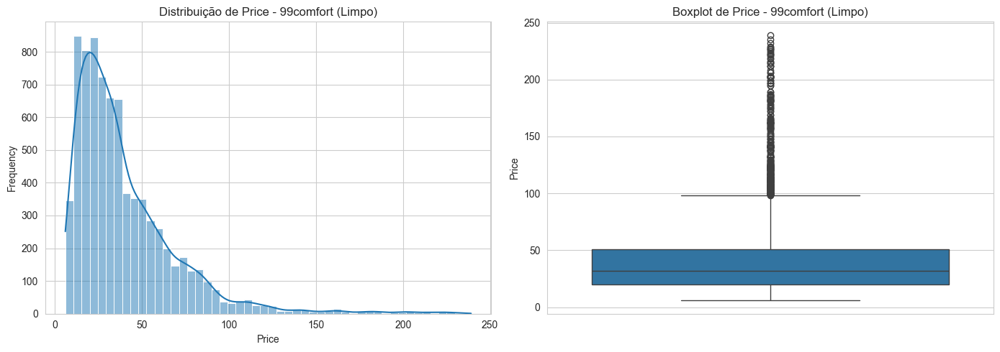


--- 3.1 Distribuição de Distance e Duration ---


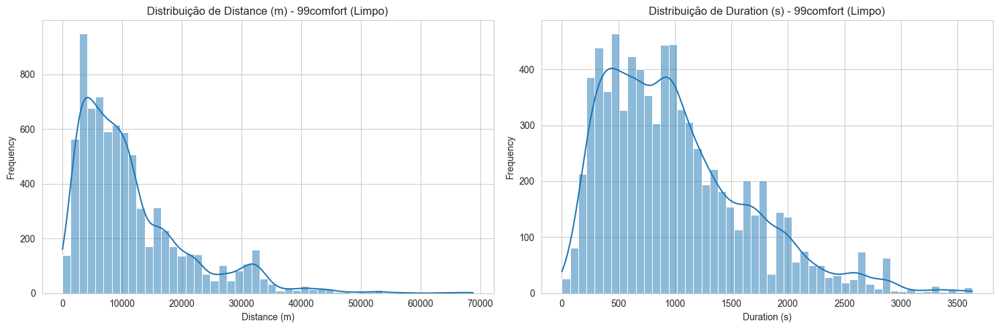

Skewness de Price (após limpeza): 2.25

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
duration_s      0.79
distance_m      0.77
ride_id         0.17
hour_sin        0.11
hour_cos        0.10
year            0.09
weekday_cos     0.06
weekday_sin     0.03
is_holiday      0.01
month          -0.01
weekday        -0.01
hour_min       -0.02
hour           -0.02
day            -0.06
is_peak_hour   -0.07
Name: price, dtype: float64


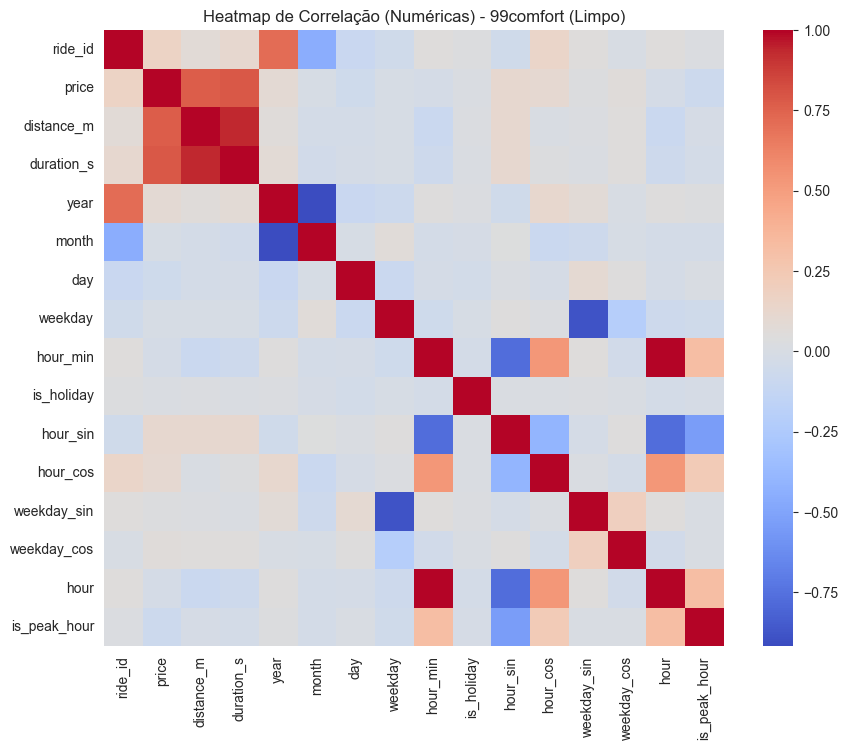


Scatter plots (distance_m, duration_s vs price):


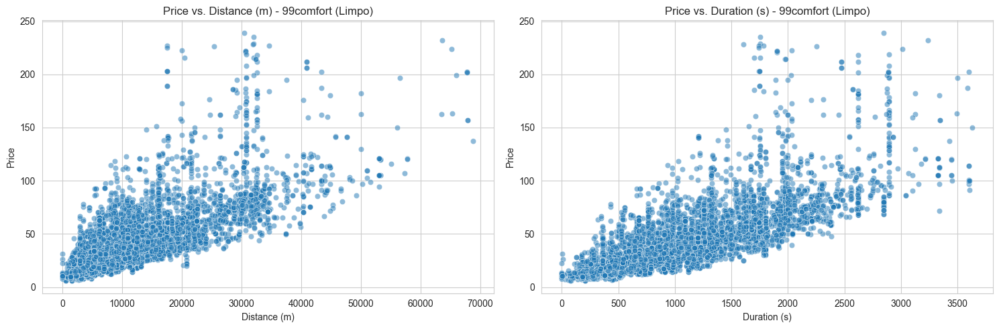


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. year


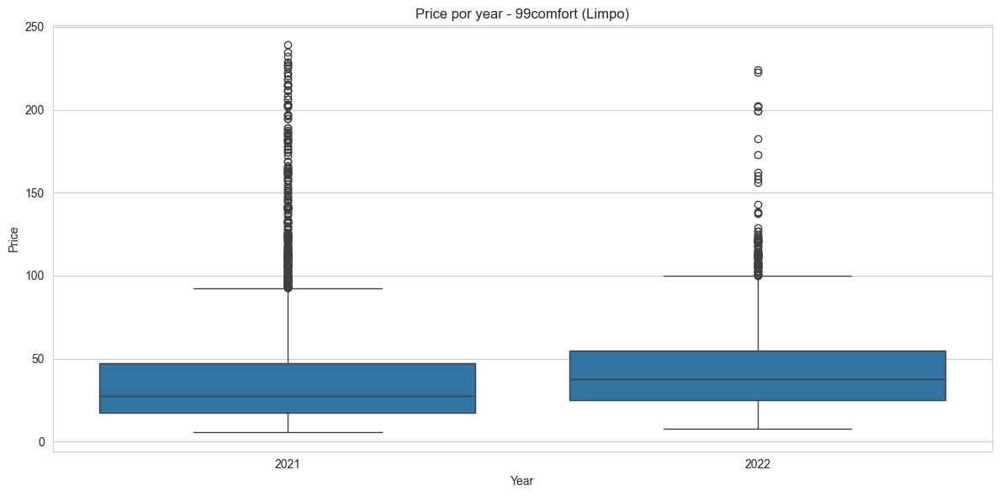


Analisando Relação: Price vs. month


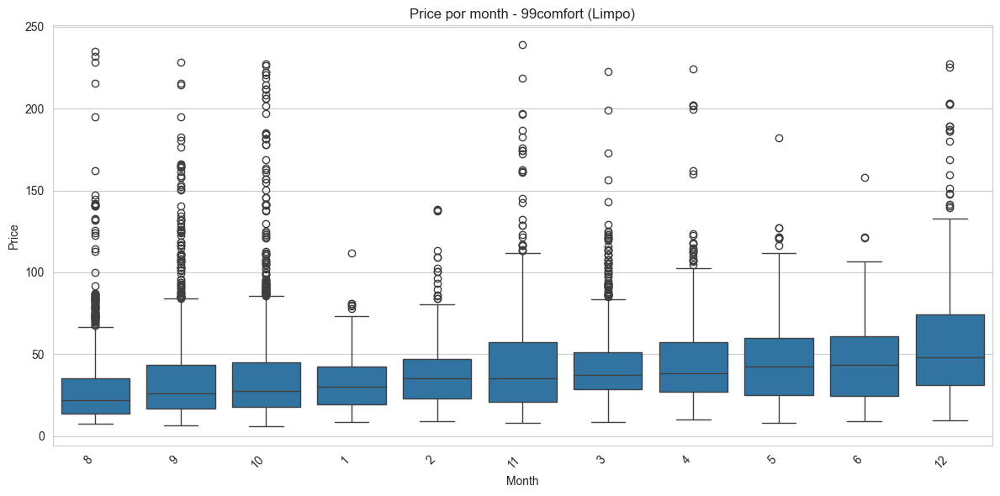


Analisando Relação: Price vs. weekday


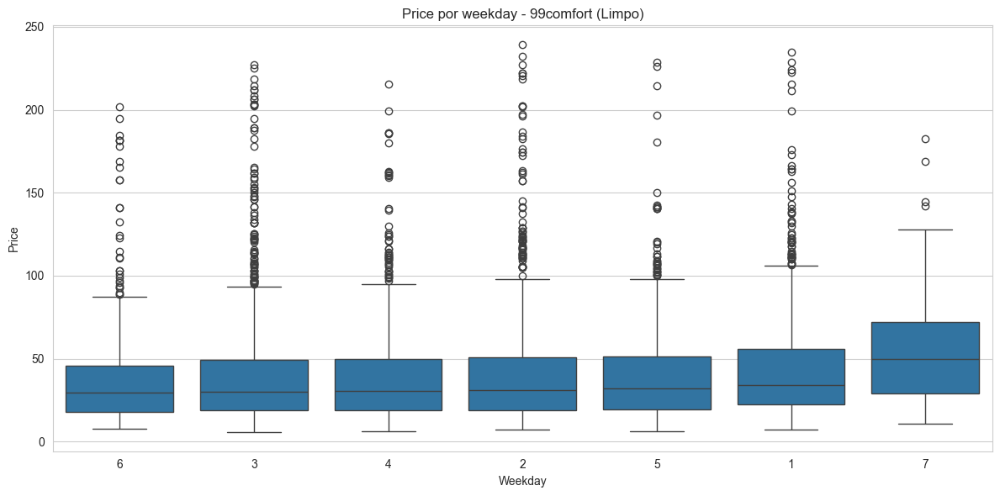


Analisando Relação: Price vs. hour


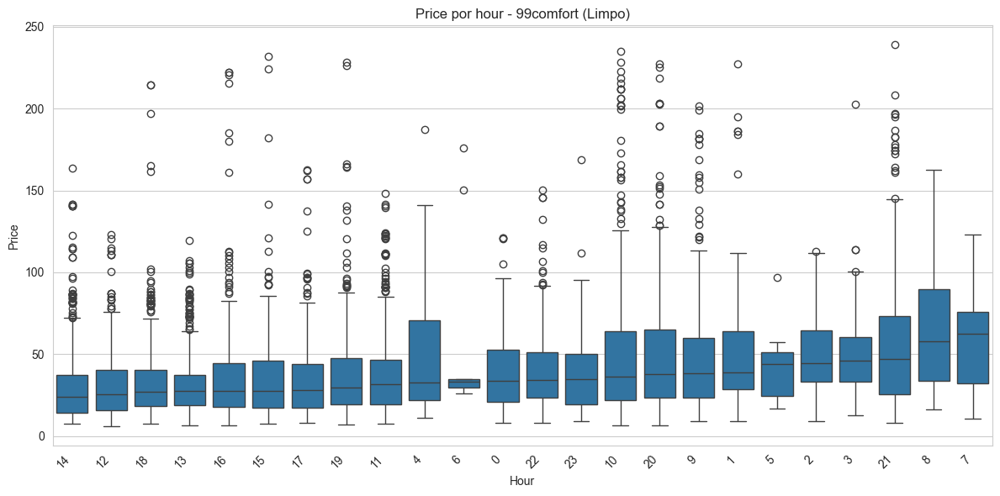


Analisando Relação: Price vs. is_holiday


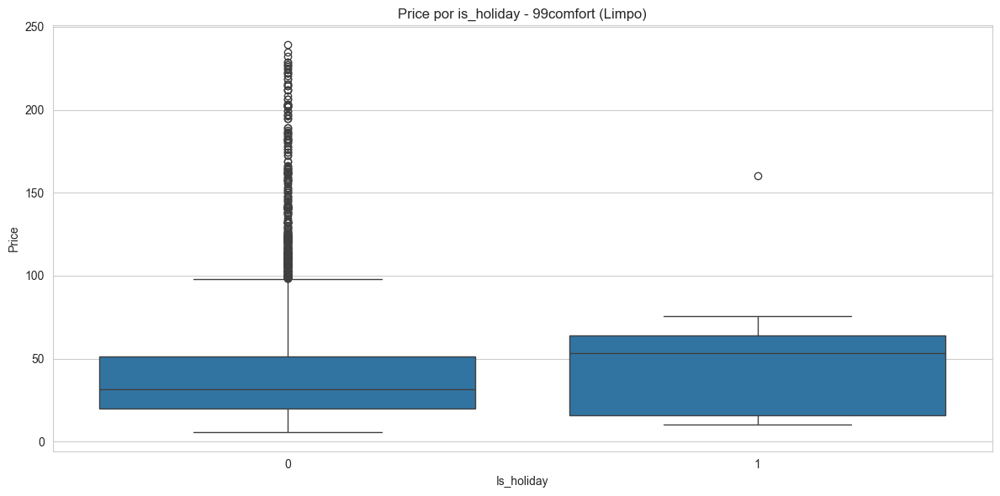


--- 4.1 Tendências Temporais (Mediana do Preço) ---


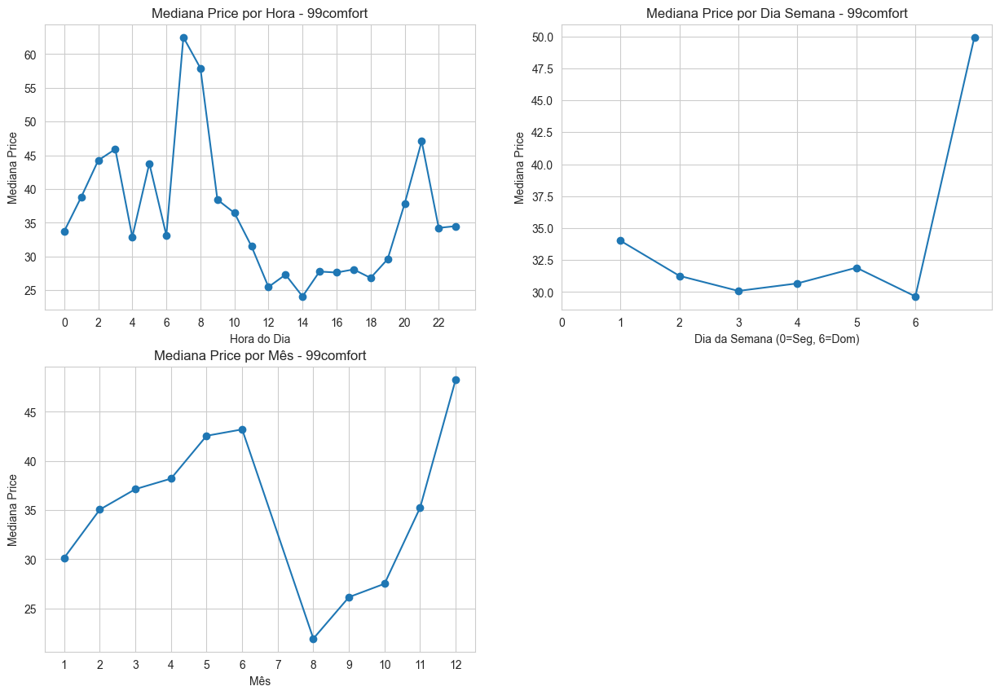

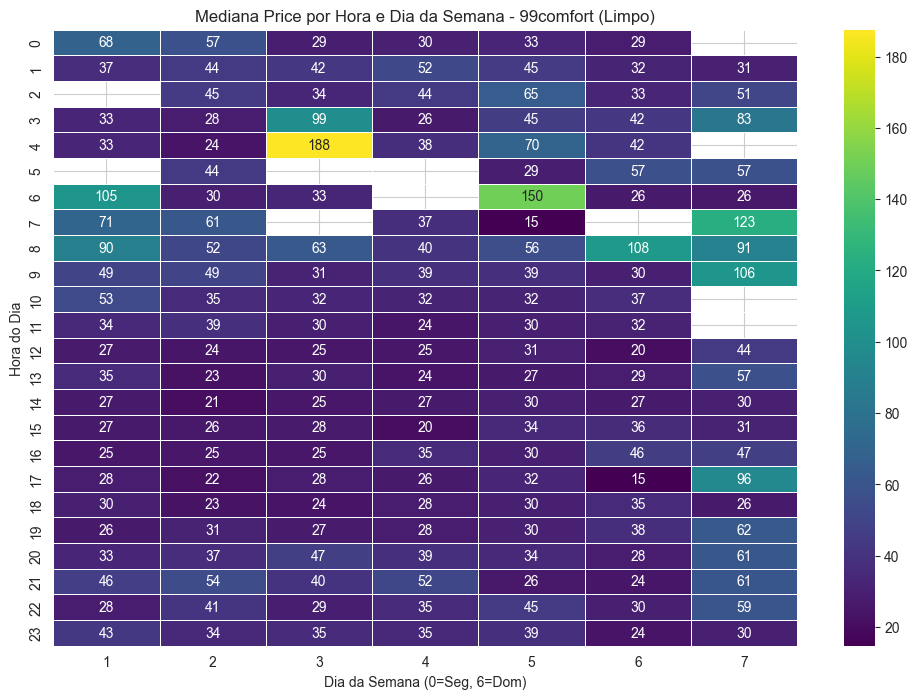

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para 99COMFORT (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: 99POP (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 232142 entries, 0 to 233994
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   ride_id       232142 non-null  int64         
 1   product_id    232142 non-null  object        
 2   subcategory   232142 non-null  object        
 3   price         232142 non-null  float64       
 4   datetime      232142 non-null  datetime64[ns]
 5   distance_m    232142 non-null  float64       
 6   duration_s    232142 non-null  float64       
 7   year          232142 non-null  int64         
 8   month         232142 non-null  int64         
 9   day           232142 non-null  int64         
 10  

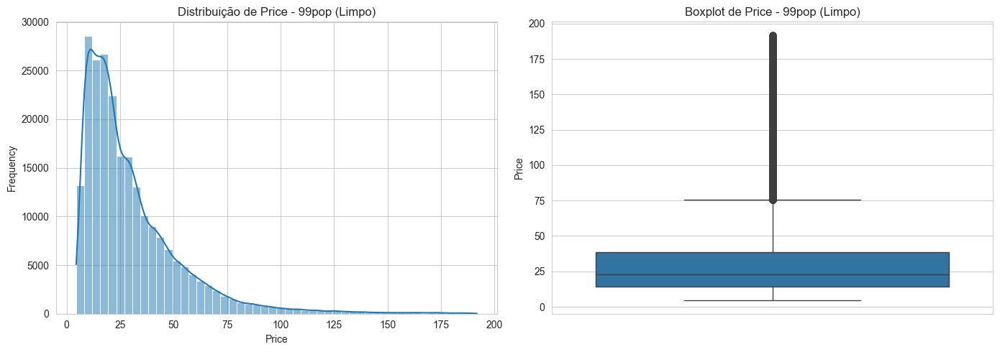


--- 3.1 Distribuição de Distance e Duration ---


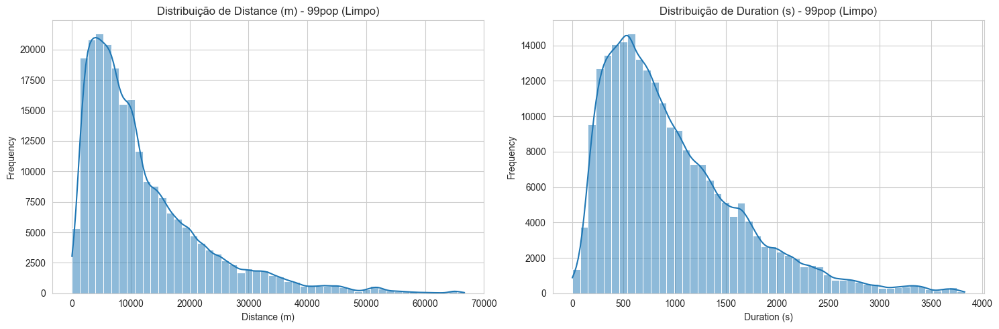

Skewness de Price (após limpeza): 2.22

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
duration_s      0.79
distance_m      0.79
hour_sin        0.15
year            0.07
ride_id         0.05
hour_cos        0.04
weekday_cos     0.04
weekday         0.01
is_holiday      0.01
is_peak_hour    0.00
weekday_sin    -0.01
day            -0.04
month          -0.05
hour           -0.08
hour_min       -0.08
Name: price, dtype: float64


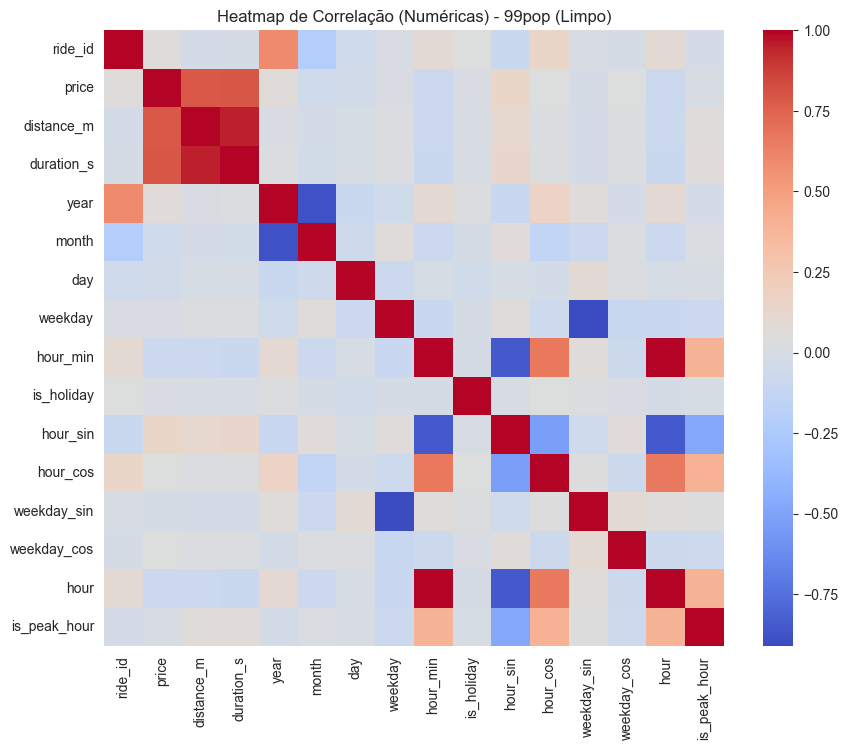


Scatter plots (distance_m, duration_s vs price):


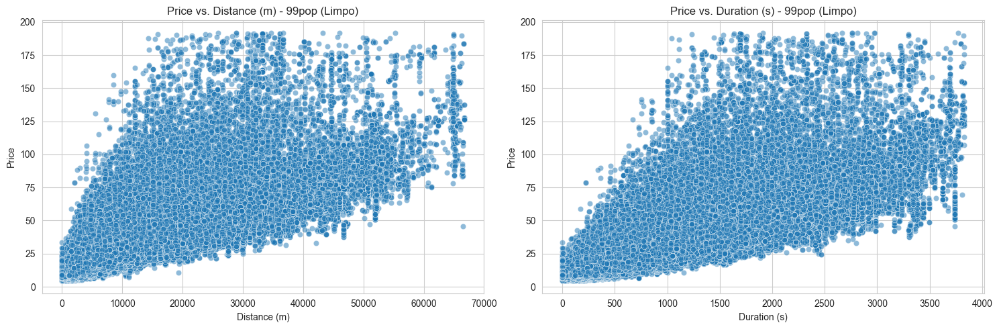


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. year


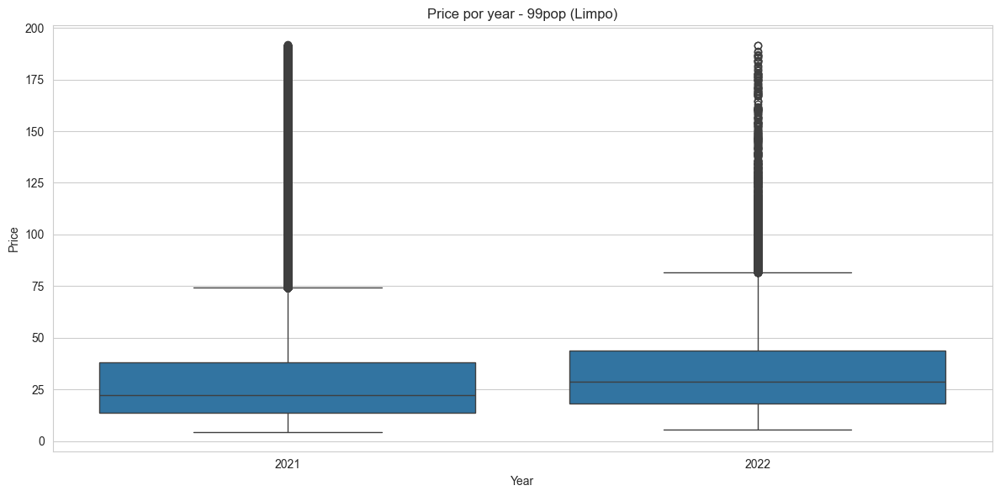


Analisando Relação: Price vs. month


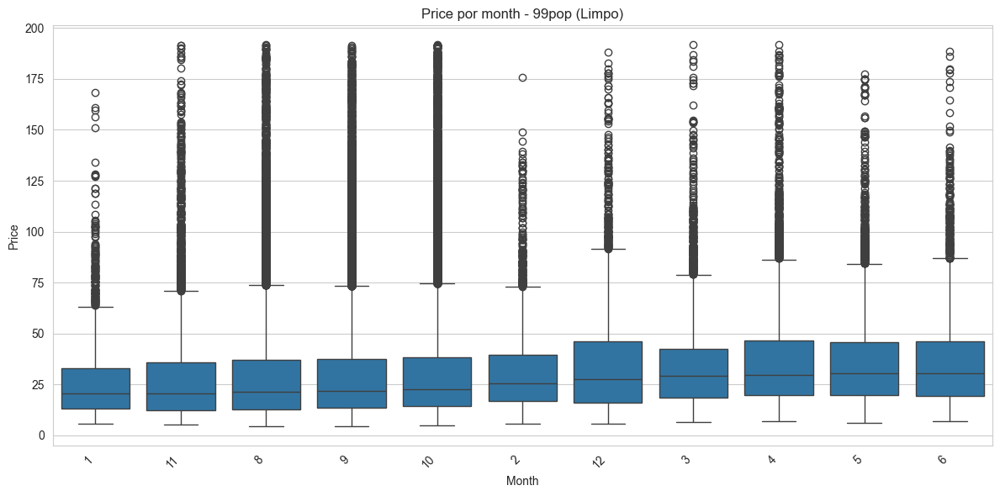


Analisando Relação: Price vs. weekday


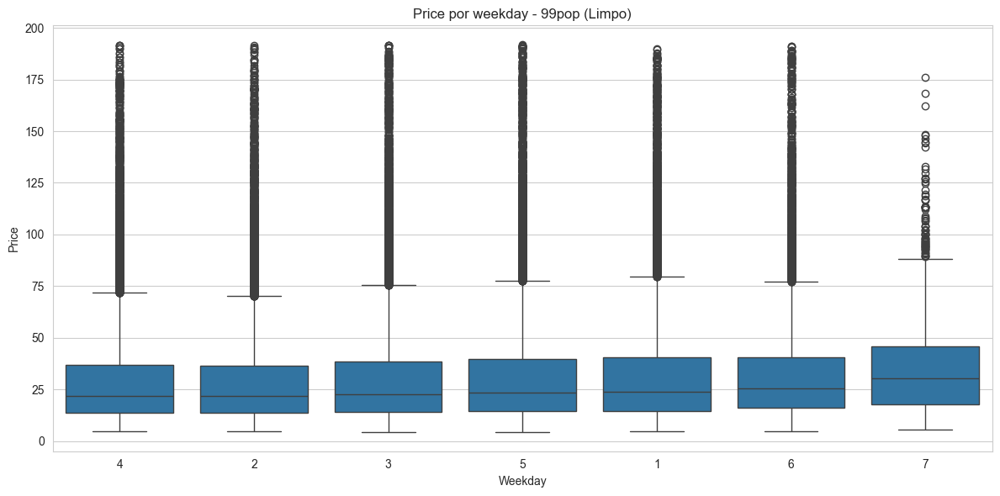


Analisando Relação: Price vs. hour


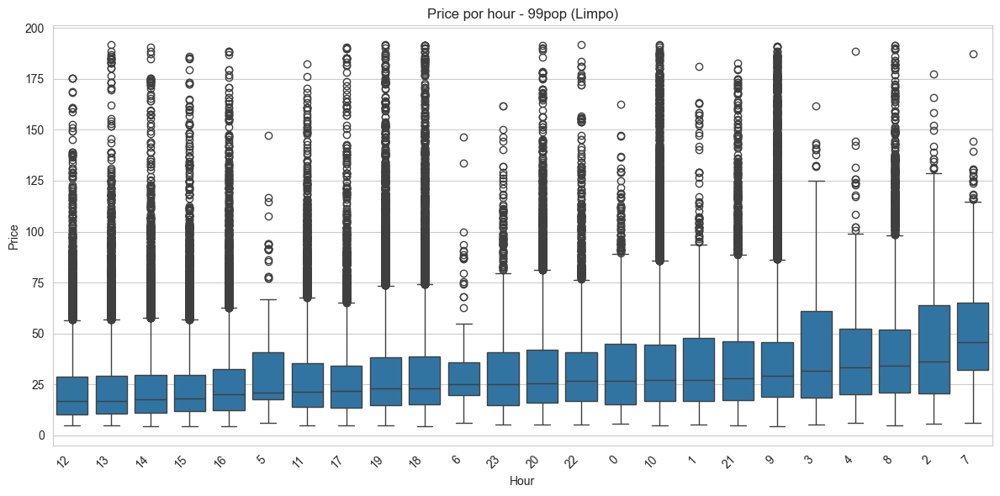


Analisando Relação: Price vs. is_holiday


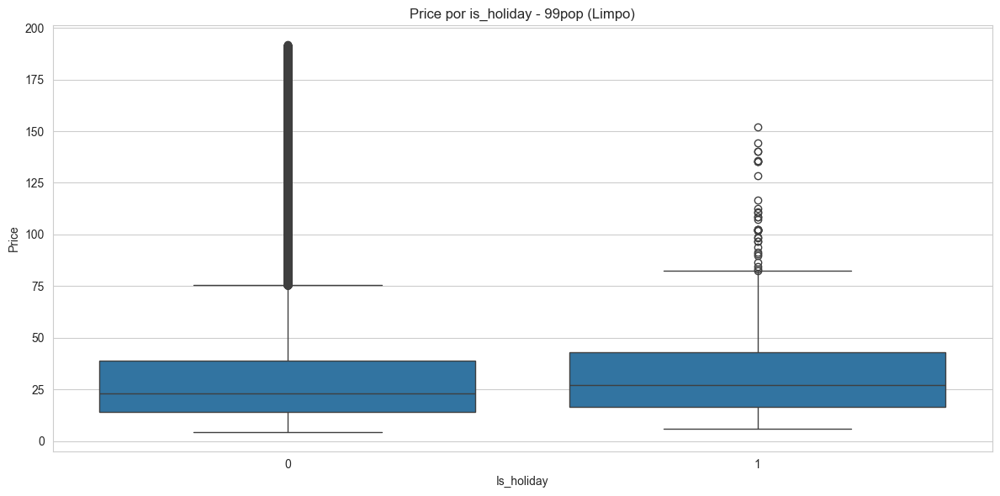


--- 4.1 Tendências Temporais (Mediana do Preço) ---


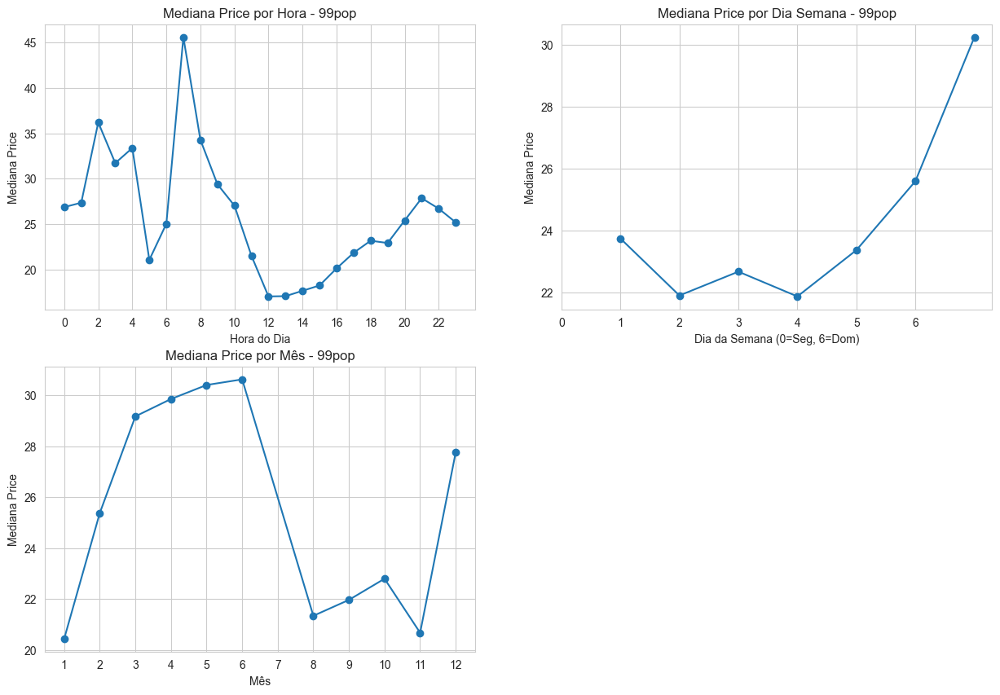

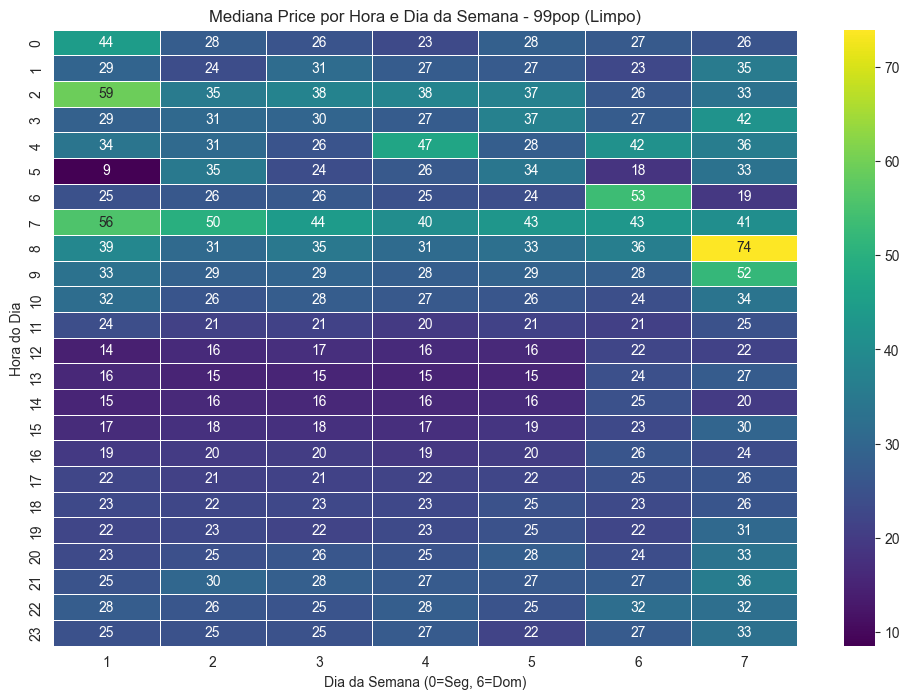

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para 99POP (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: 99POUPA (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 114450 entries, 0 to 115616
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   ride_id       114450 non-null  int64         
 1   product_id    114450 non-null  object        
 2   subcategory   114450 non-null  object        
 3   price         114450 non-null  float64       
 4   datetime      114450 non-null  datetime64[ns]
 5   distance_m    114450 non-null  float64       
 6   duration_s    114450 non-null  float64       
 7   year          114450 non-null  int64         
 8   month         114450 non-null  int64         
 9   day           114450 non-null  int64         
 10  we

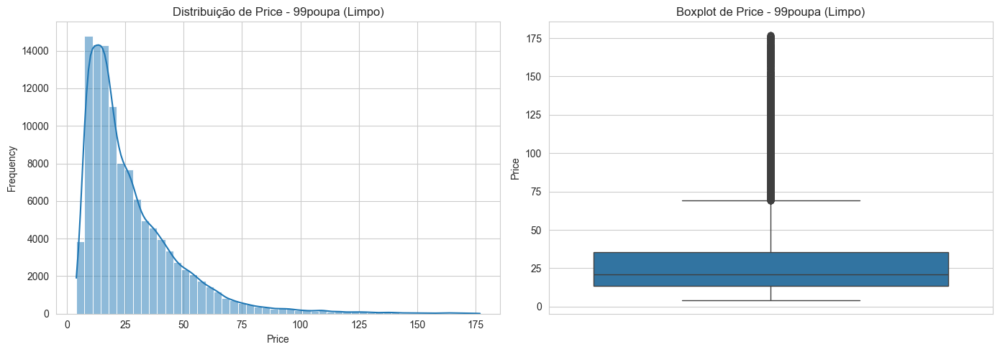


--- 3.1 Distribuição de Distance e Duration ---


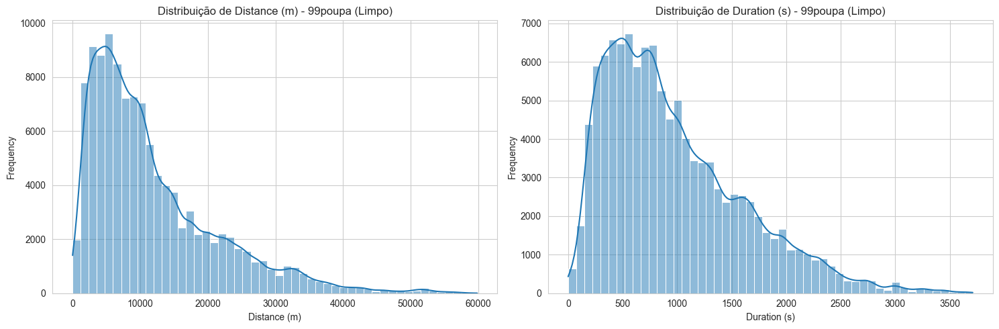

Skewness de Price (após limpeza): 2.24

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
duration_s      0.75
distance_m      0.74
hour_sin        0.17
weekday_cos     0.05
month           0.04
hour_cos        0.03
ride_id         0.02
is_peak_hour    0.02
weekday         0.02
is_holiday      0.02
weekday_sin    -0.02
day            -0.04
hour_min       -0.10
hour           -0.10
year             NaN
Name: price, dtype: float64


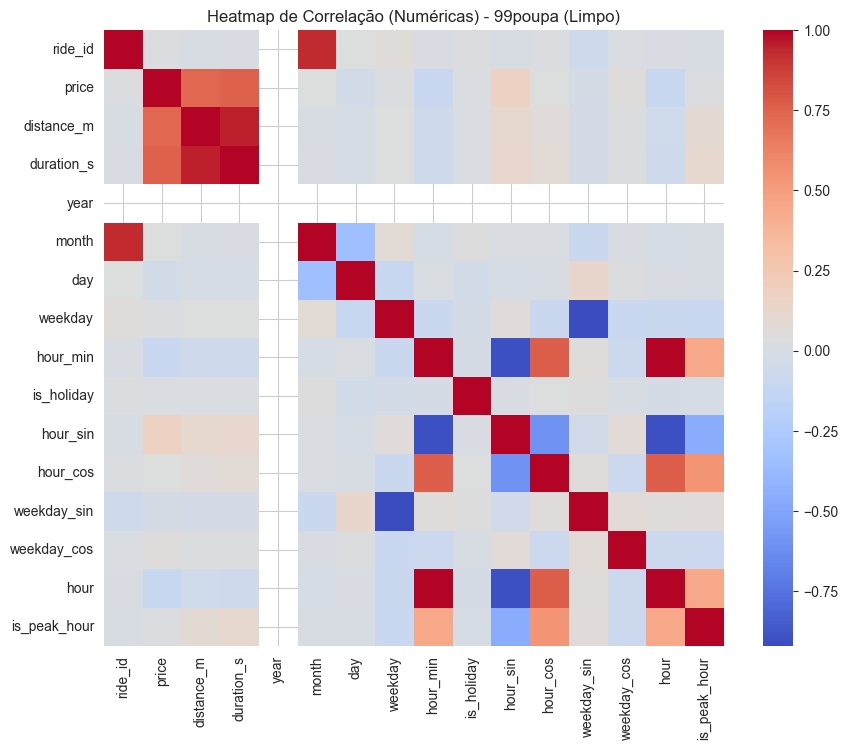


Scatter plots (distance_m, duration_s vs price):


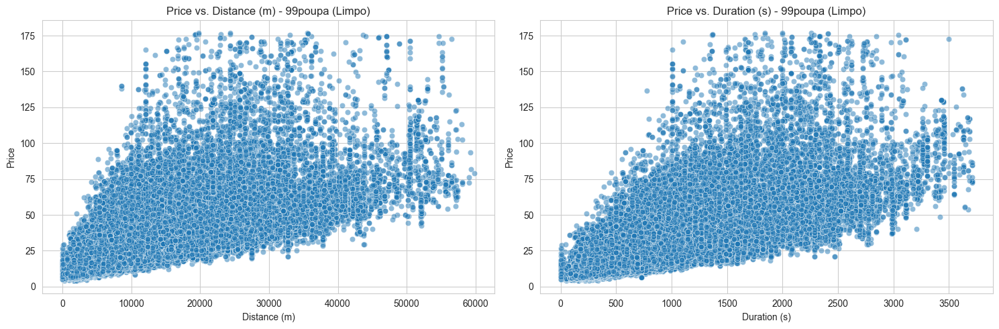


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.
  Coluna 'year' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. month


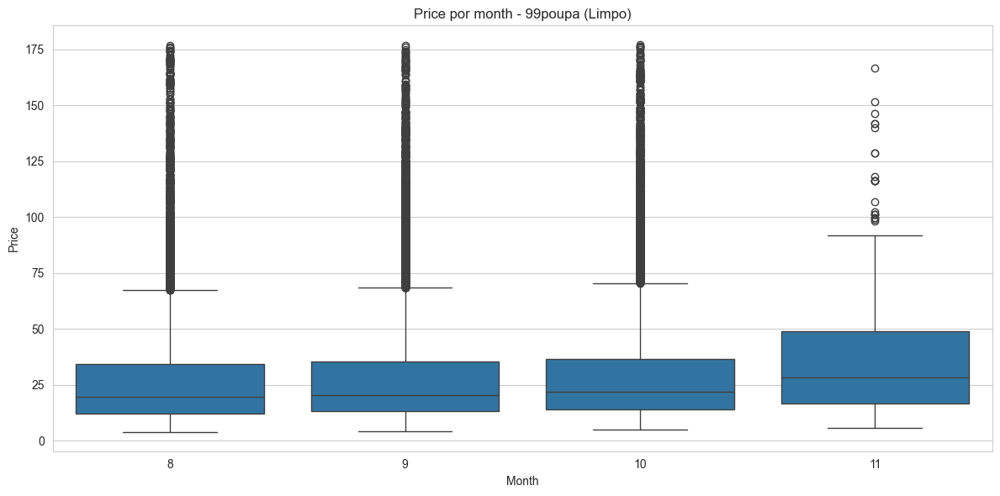


Analisando Relação: Price vs. weekday


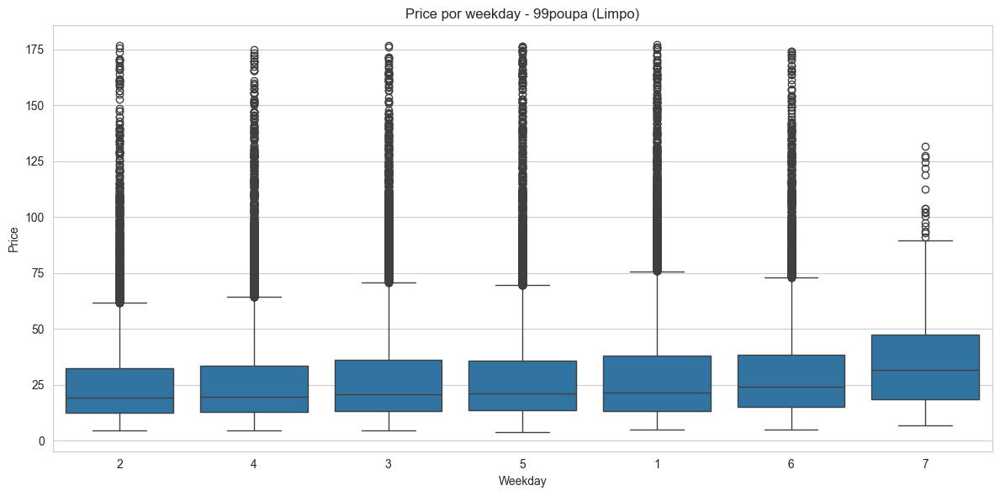


Analisando Relação: Price vs. hour


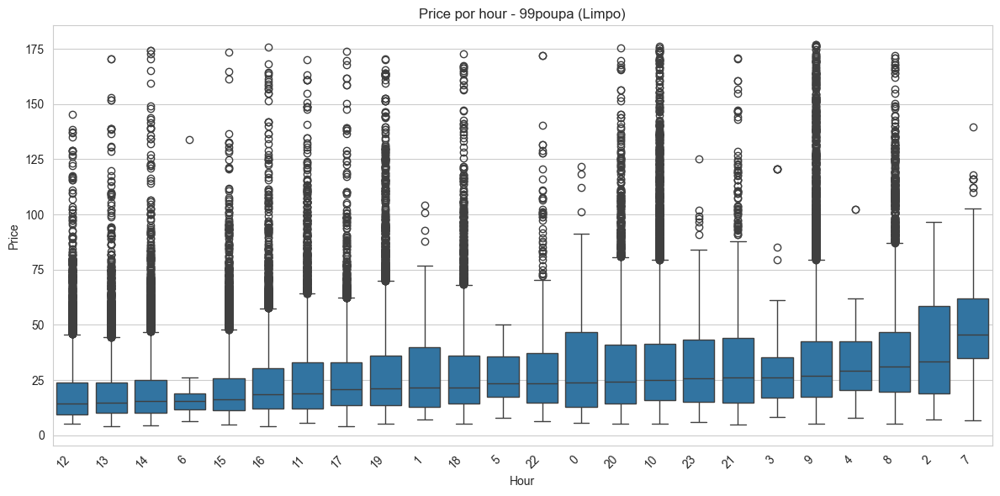


Analisando Relação: Price vs. is_holiday


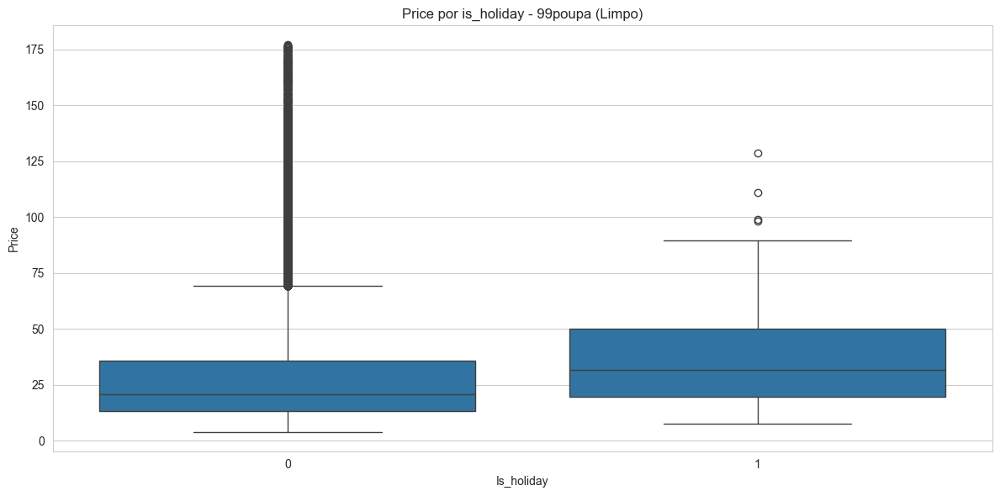


--- 4.1 Tendências Temporais (Mediana do Preço) ---


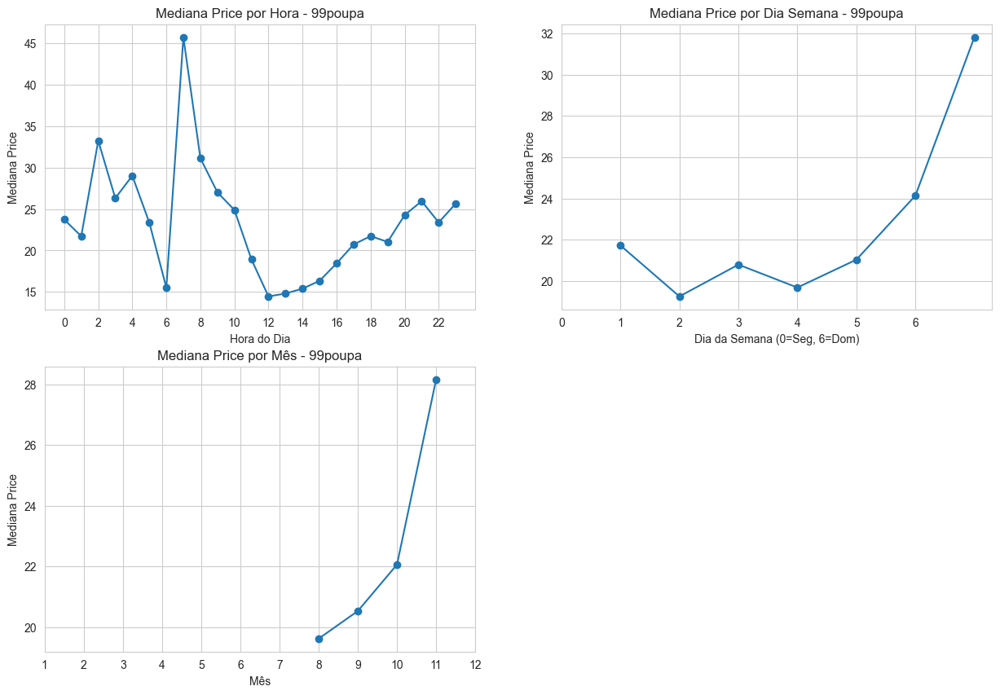

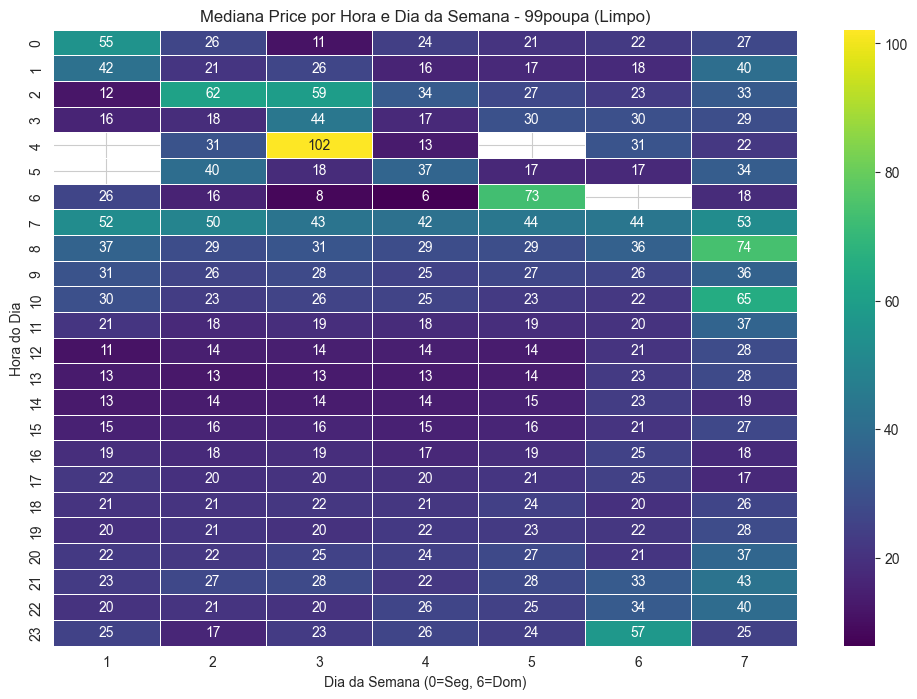

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para 99POUPA (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: TAXIREGULAR (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 214352 entries, 0 to 215789
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   ride_id       214352 non-null  int64         
 1   product_id    214352 non-null  object        
 2   subcategory   214352 non-null  object        
 3   price         214352 non-null  float64       
 4   datetime      214352 non-null  datetime64[ns]
 5   distance_m    214352 non-null  float64       
 6   duration_s    214352 non-null  float64       
 7   year          214352 non-null  int64         
 8   month         214352 non-null  int64         
 9   day           214352 non-null  int64         
 

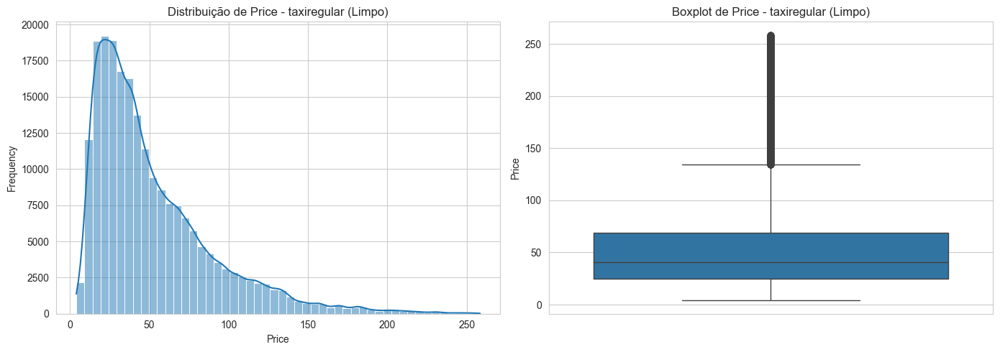


--- 3.1 Distribuição de Distance e Duration ---


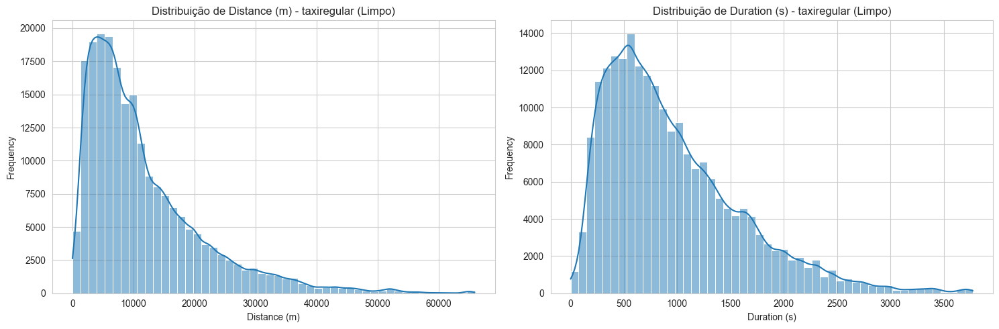

Skewness de Price (após limpeza): 1.60

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
distance_m      0.95
duration_s      0.93
hour_sin        0.11
year            0.09
is_peak_hour    0.07
hour_cos        0.06
weekday         0.02
ride_id         0.02
weekday_cos     0.02
is_holiday      0.01
day            -0.01
weekday_sin    -0.02
hour           -0.07
hour_min       -0.07
month          -0.07
Name: price, dtype: float64


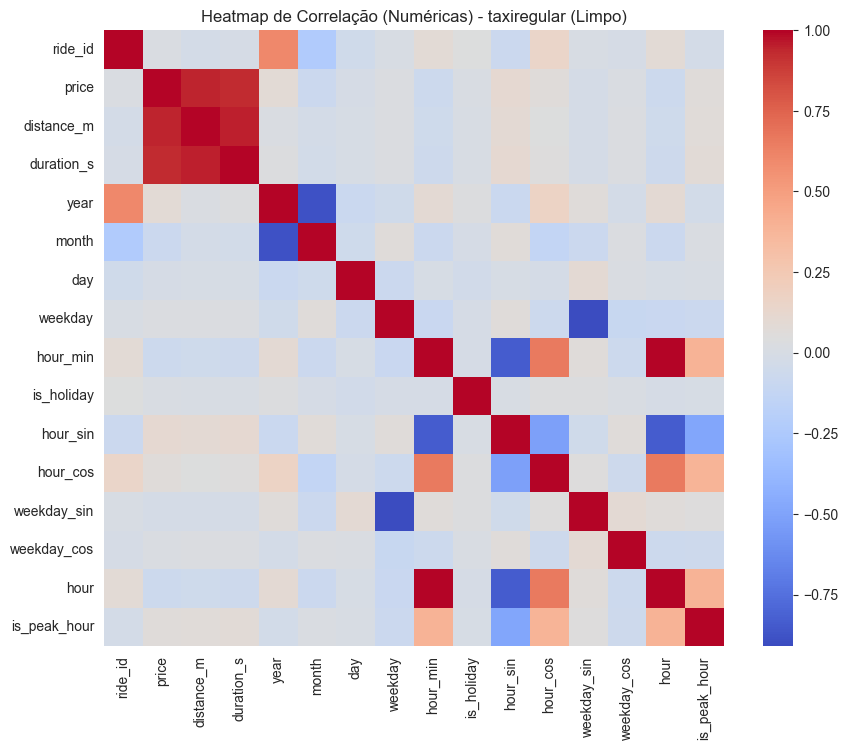


Scatter plots (distance_m, duration_s vs price):


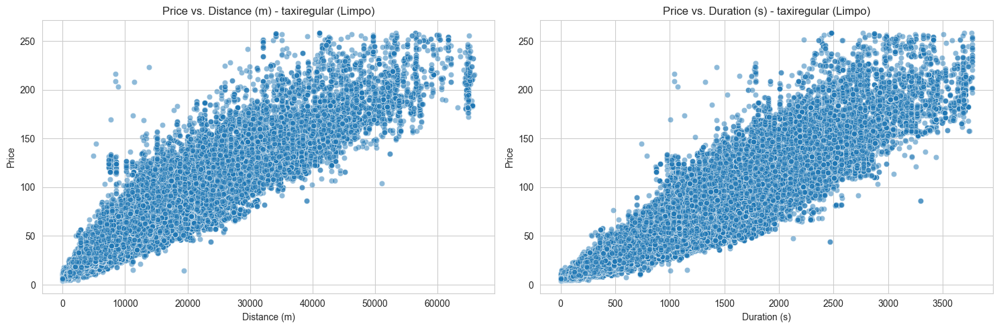


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. year


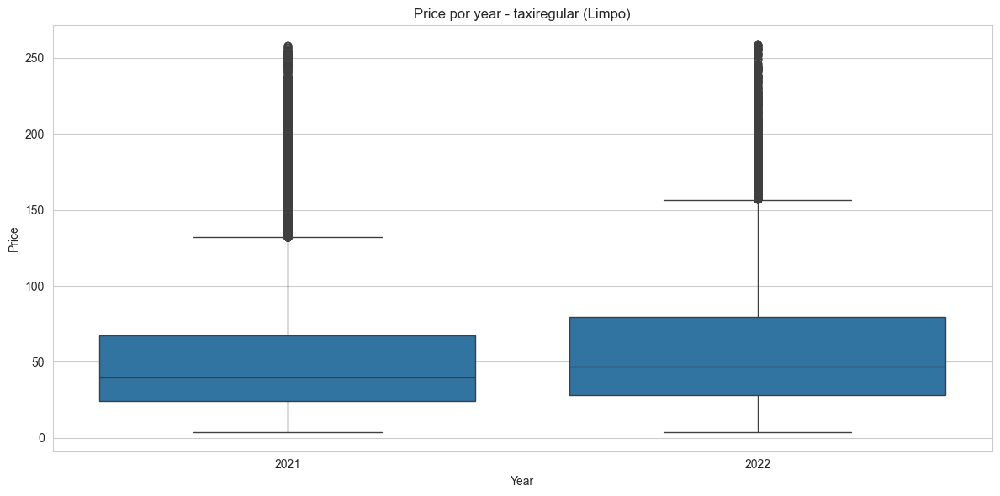


Analisando Relação: Price vs. month


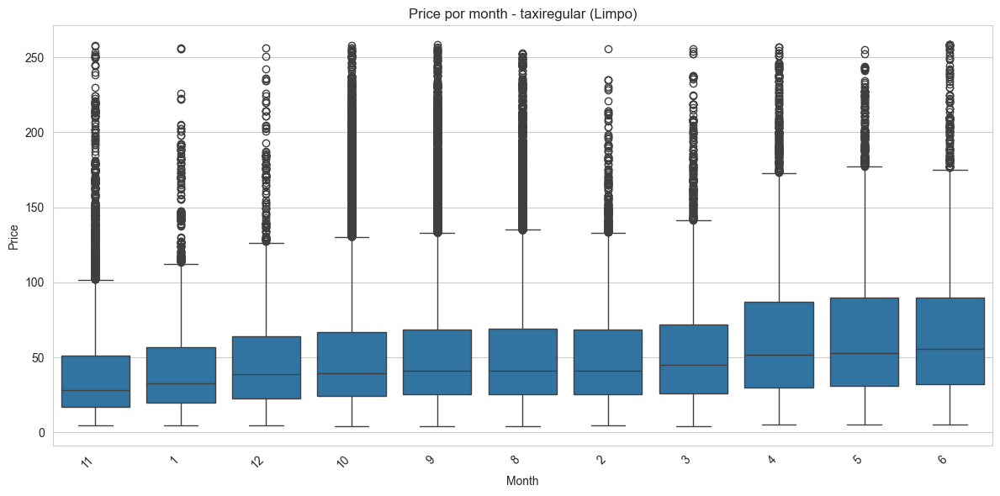


Analisando Relação: Price vs. weekday


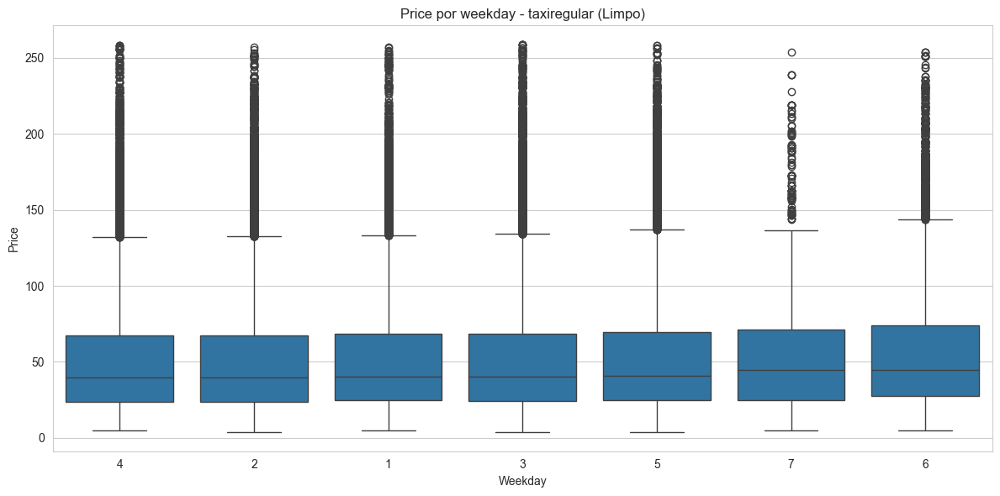


Analisando Relação: Price vs. hour


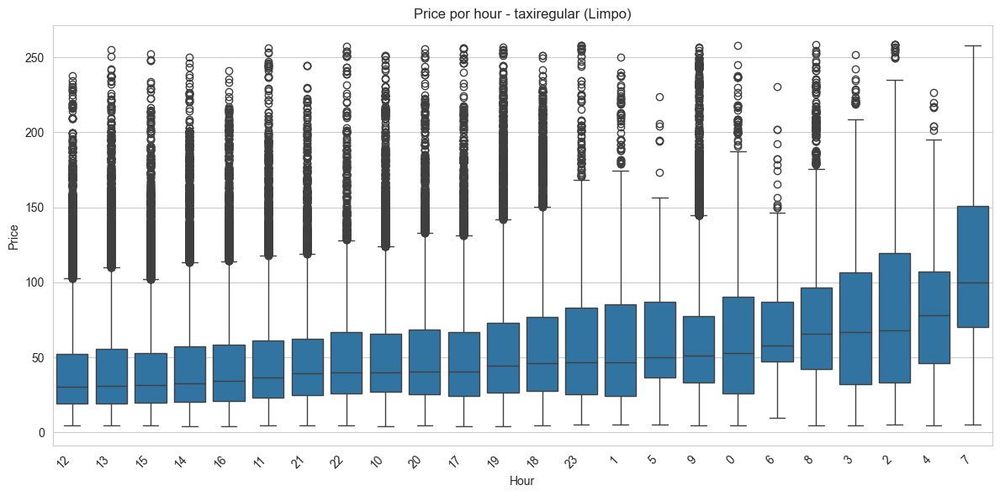


Analisando Relação: Price vs. is_holiday


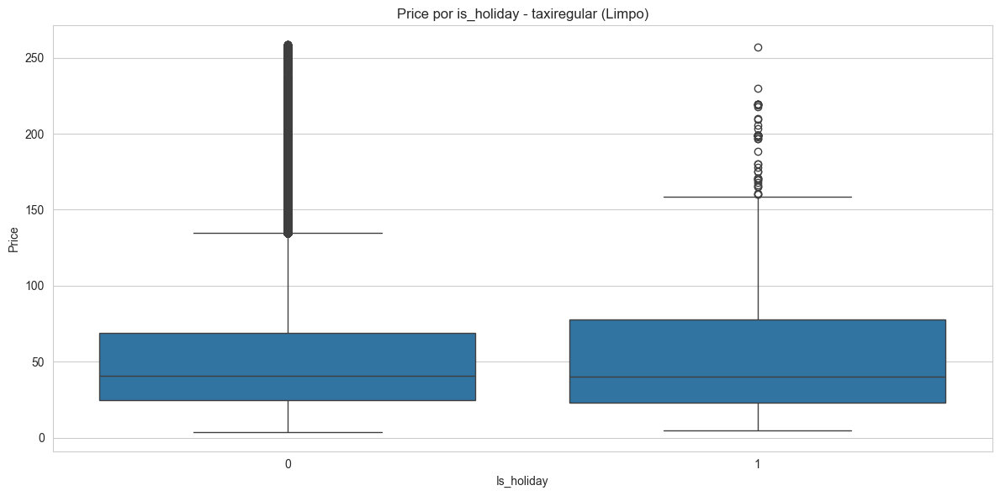


--- 4.1 Tendências Temporais (Mediana do Preço) ---


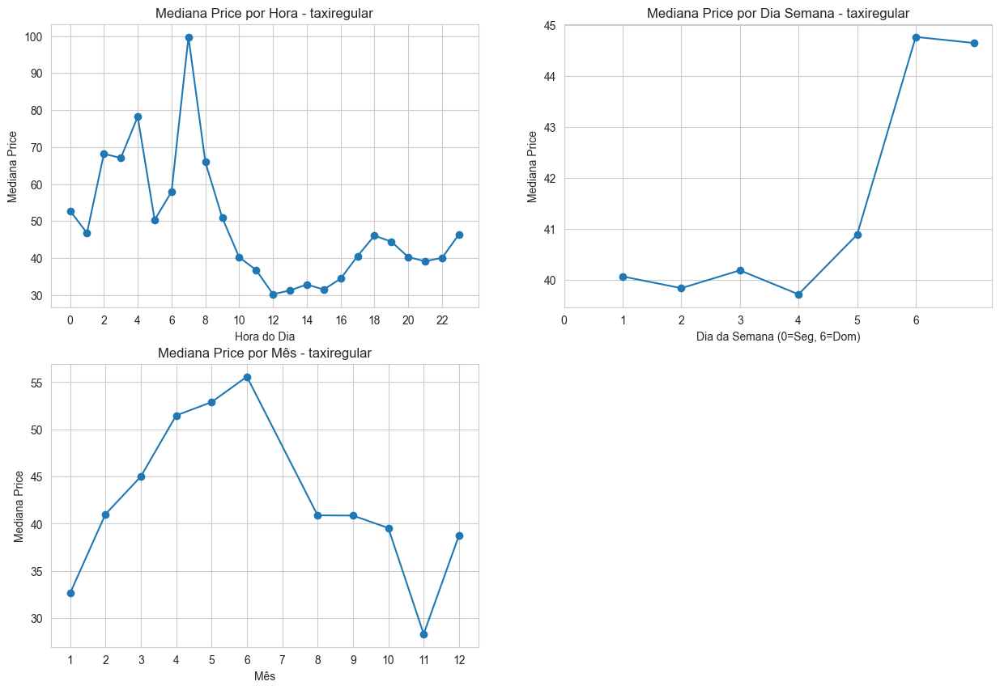

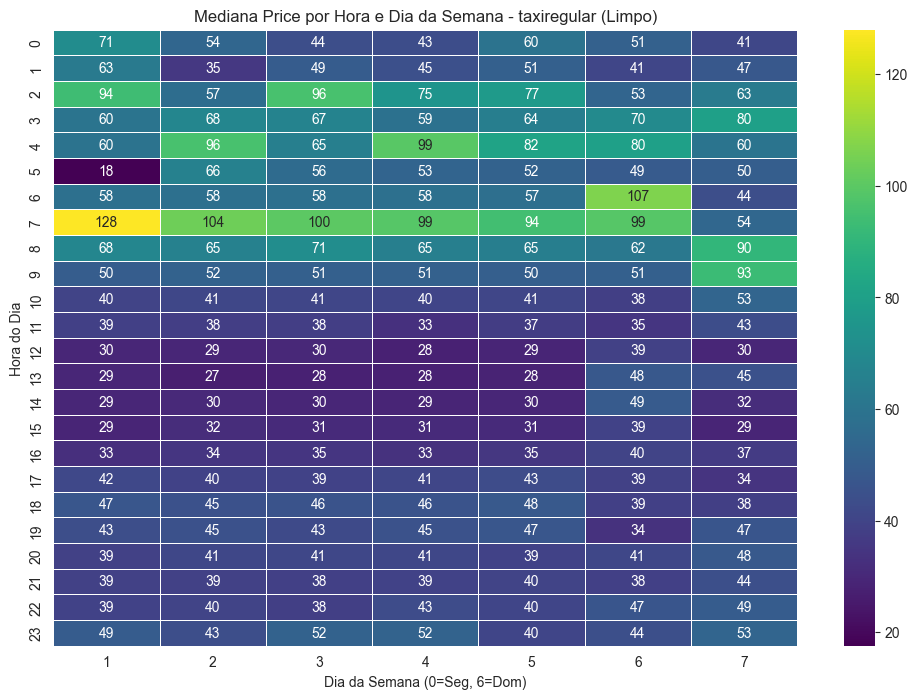

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para TAXIREGULAR (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: TAXITURBO (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 197820 entries, 0 to 199136
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   ride_id       197820 non-null  int64         
 1   product_id    197820 non-null  object        
 2   subcategory   197820 non-null  object        
 3   price         197820 non-null  float64       
 4   datetime      197820 non-null  datetime64[ns]
 5   distance_m    197820 non-null  float64       
 6   duration_s    197820 non-null  float64       
 7   year          197820 non-null  int64         
 8   month         197820 non-null  int64         
 9   day           197820 non-null  int64         

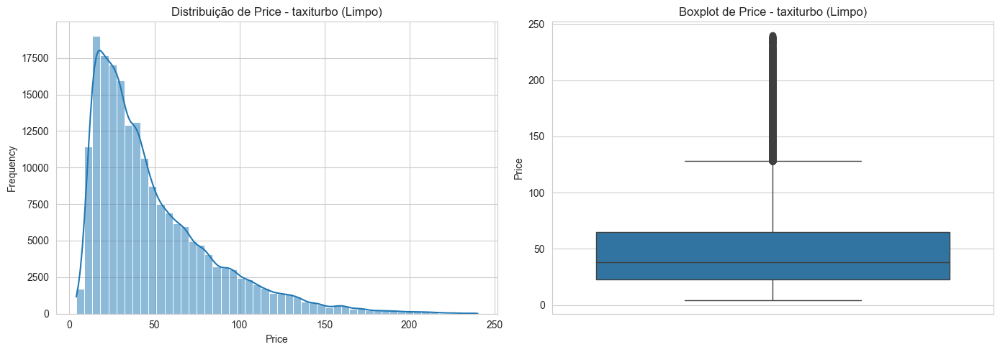


--- 3.1 Distribuição de Distance e Duration ---


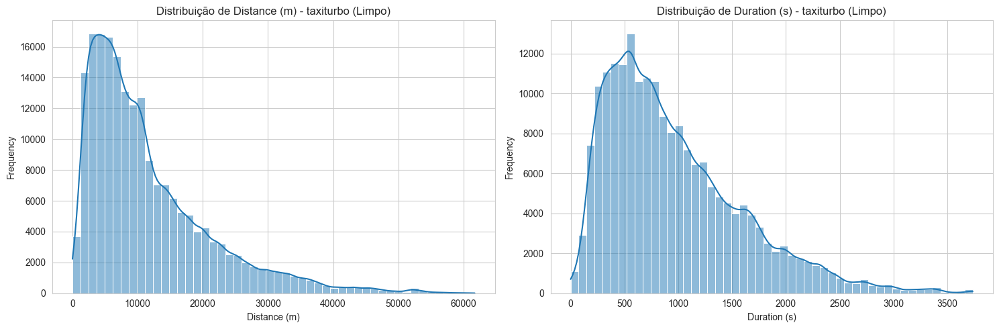

Skewness de Price (após limpeza): 1.54

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
distance_m      0.93
duration_s      0.92
hour_sin        0.10
year            0.09
is_peak_hour    0.06
hour_cos        0.06
ride_id         0.03
weekday         0.02
weekday_cos     0.02
is_holiday      0.00
day            -0.01
weekday_sin    -0.02
hour           -0.06
hour_min       -0.07
month          -0.08
Name: price, dtype: float64


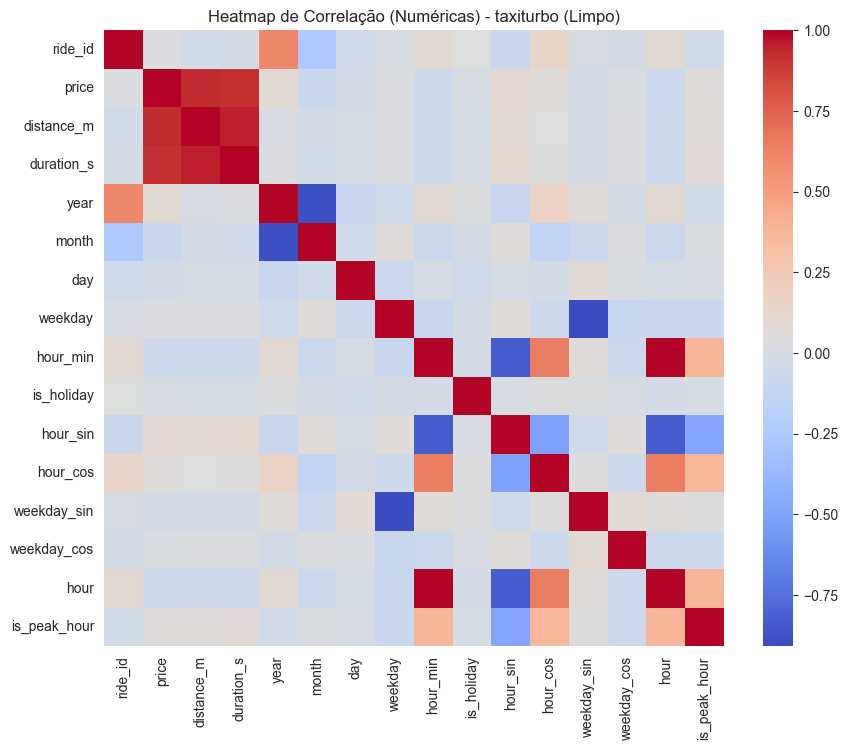


Scatter plots (distance_m, duration_s vs price):


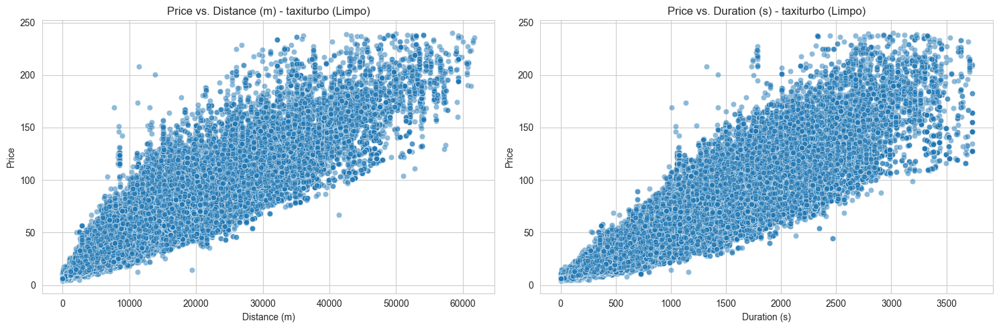


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. year


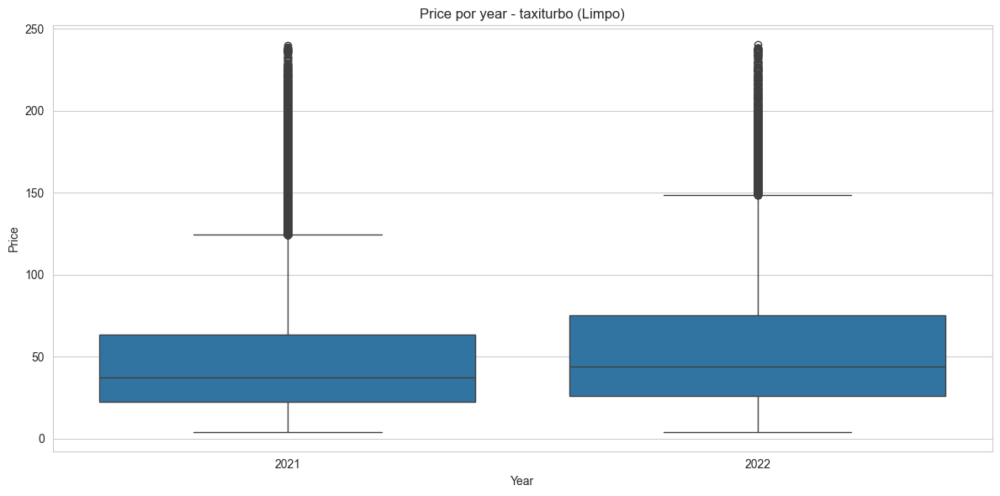


Analisando Relação: Price vs. month


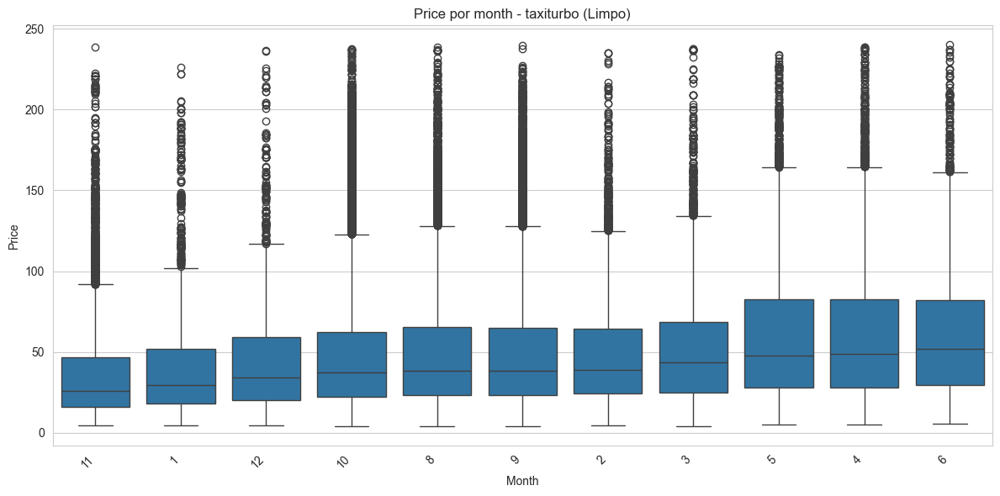


Analisando Relação: Price vs. weekday


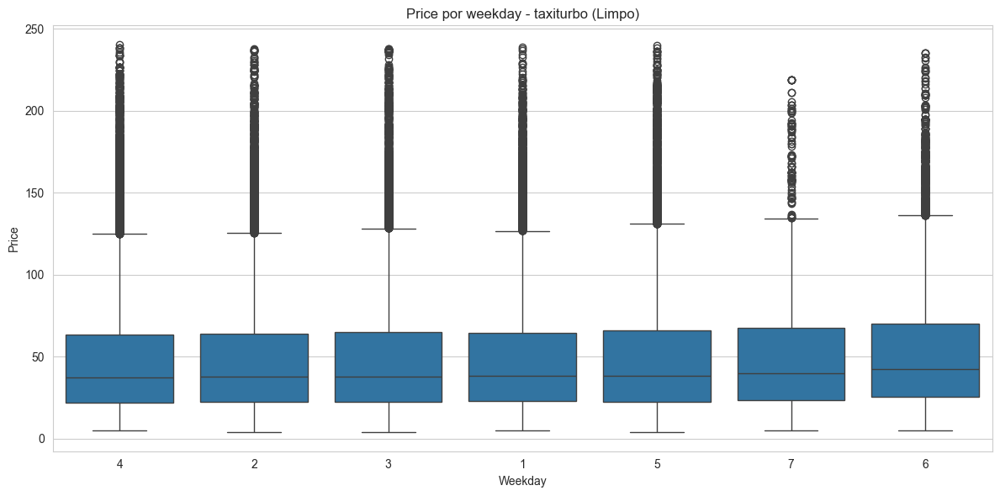


Analisando Relação: Price vs. hour


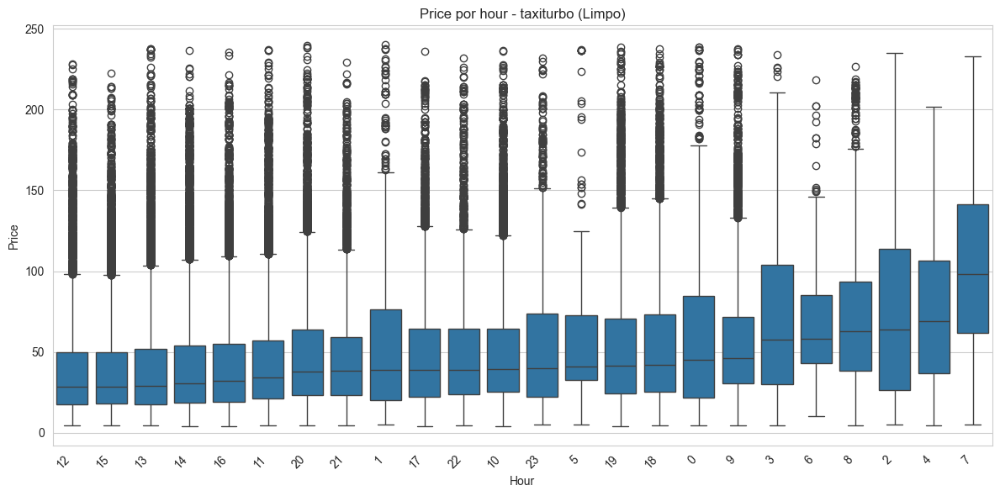


Analisando Relação: Price vs. is_holiday


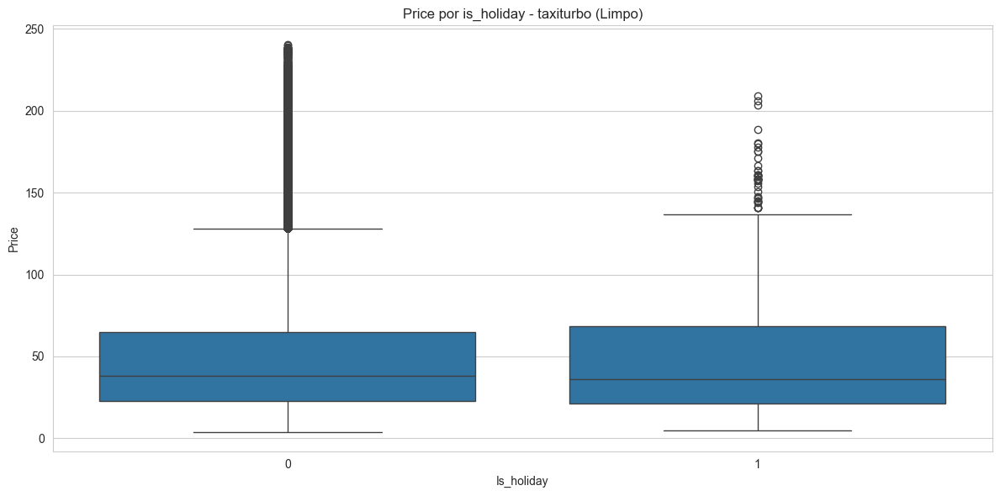


--- 4.1 Tendências Temporais (Mediana do Preço) ---


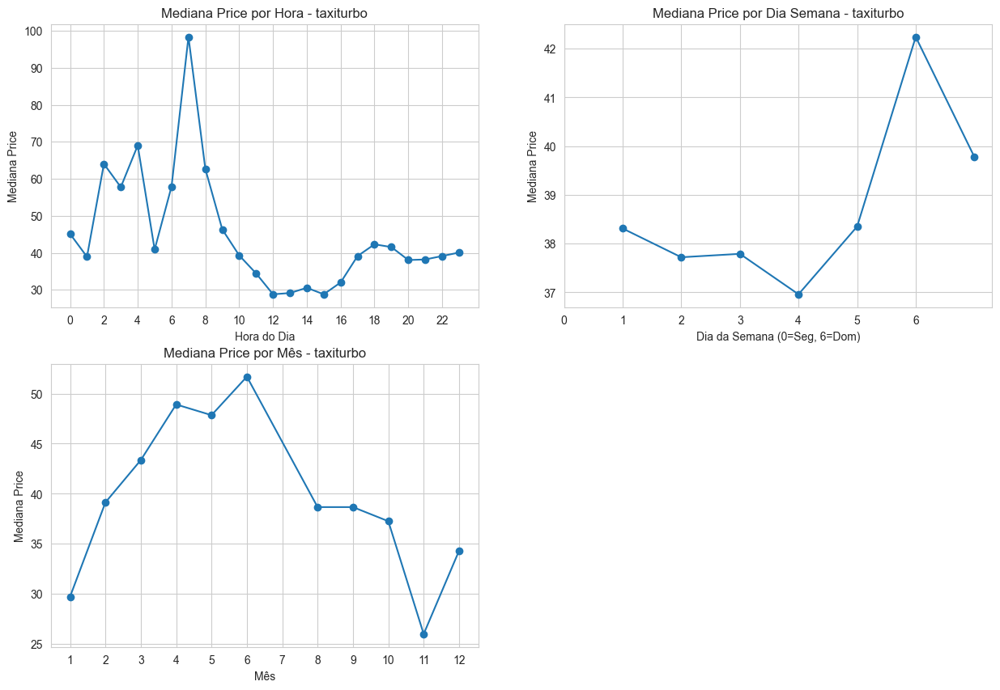

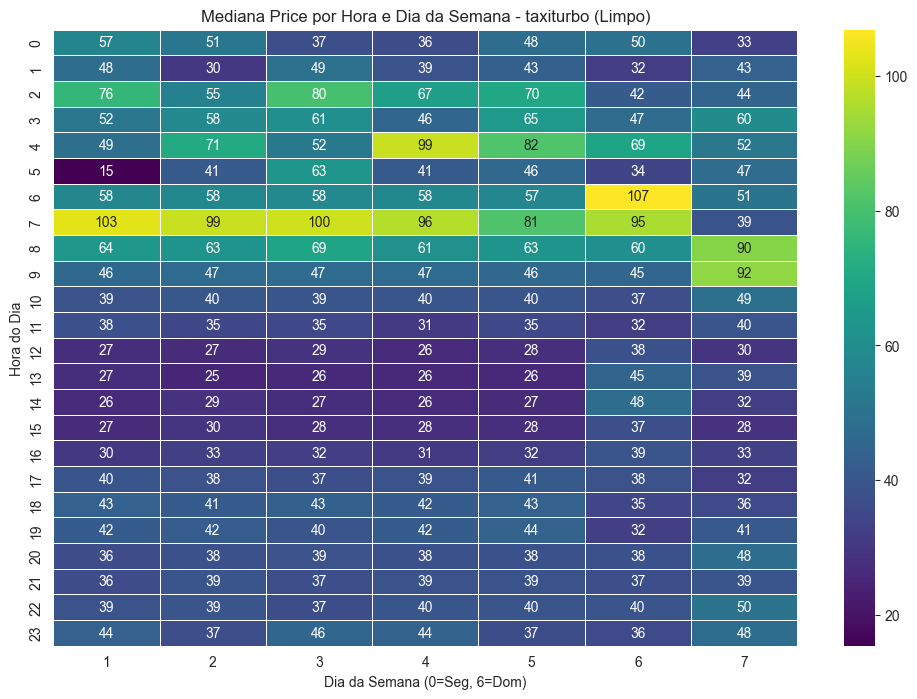

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para TAXITURBO (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: UBERBAG (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 72681 entries, 0 to 73274
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   ride_id       72681 non-null  int64         
 1   product_id    72681 non-null  object        
 2   subcategory   72681 non-null  object        
 3   price         72681 non-null  float64       
 4   datetime      72681 non-null  datetime64[ns]
 5   distance_m    72681 non-null  float64       
 6   duration_s    72681 non-null  float64       
 7   year          72681 non-null  int64         
 8   month         72681 non-null  int64         
 9   day           72681 non-null  int64         
 10  weekday     

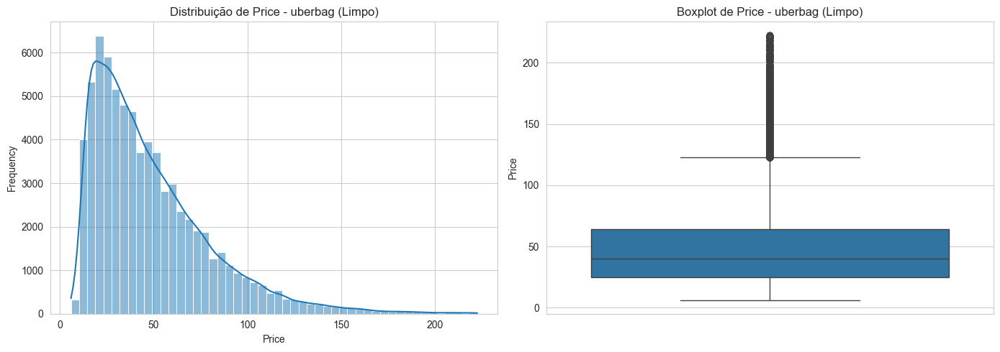


--- 3.1 Distribuição de Distance e Duration ---


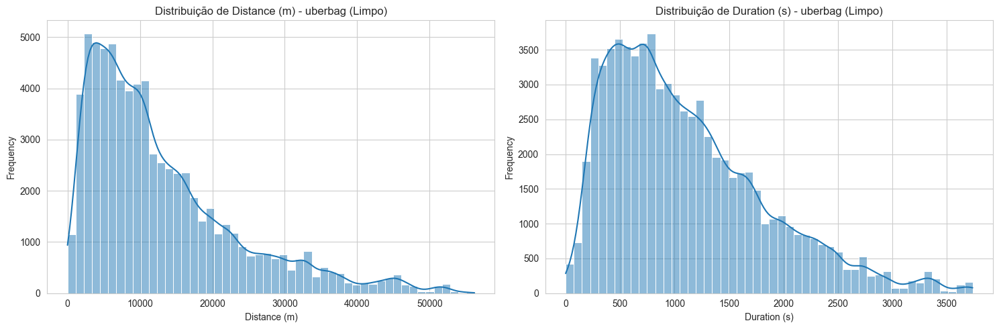

Skewness de Price (após limpeza): 1.48

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
duration_s      0.84
distance_m      0.82
hour_sin        0.18
ride_id         0.12
hour_cos        0.07
year            0.05
weekday         0.02
weekday_cos     0.02
is_holiday      0.01
month           0.00
is_peak_hour   -0.02
weekday_sin    -0.02
day            -0.06
hour           -0.09
hour_min       -0.09
Name: price, dtype: float64


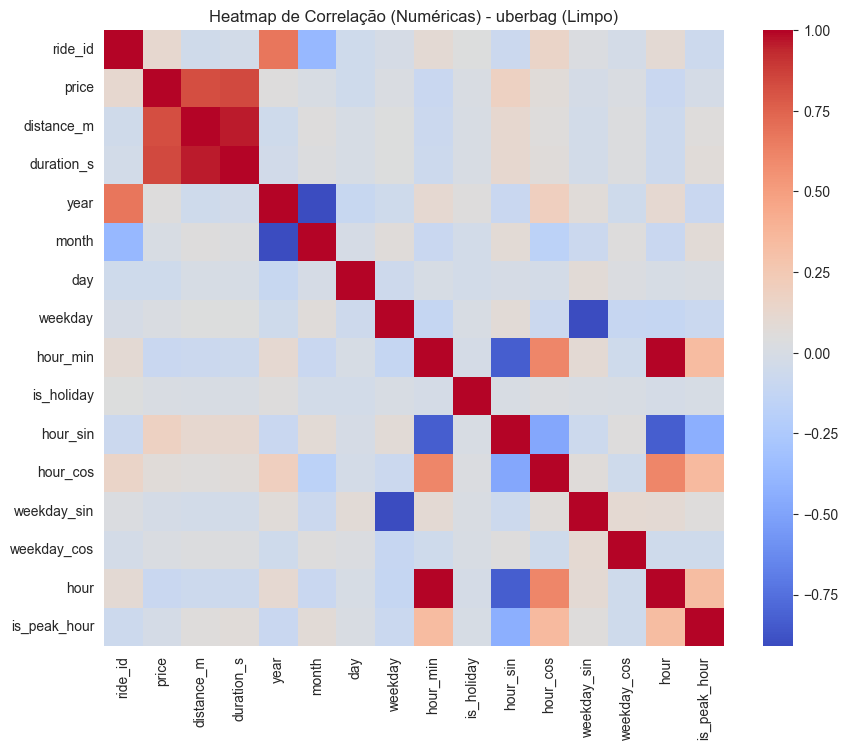


Scatter plots (distance_m, duration_s vs price):


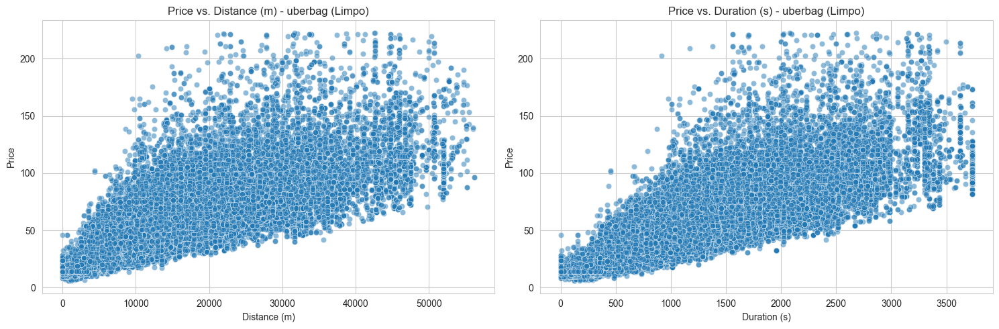


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. year


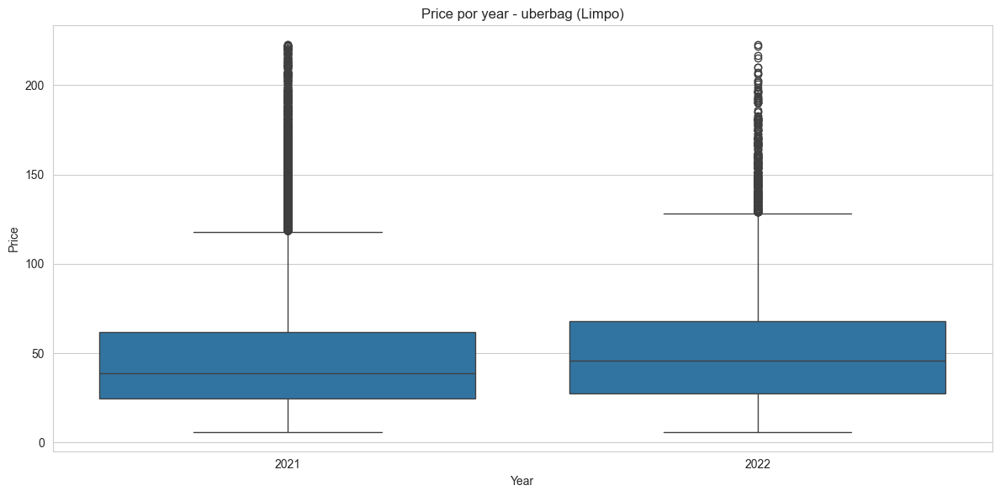


Analisando Relação: Price vs. month


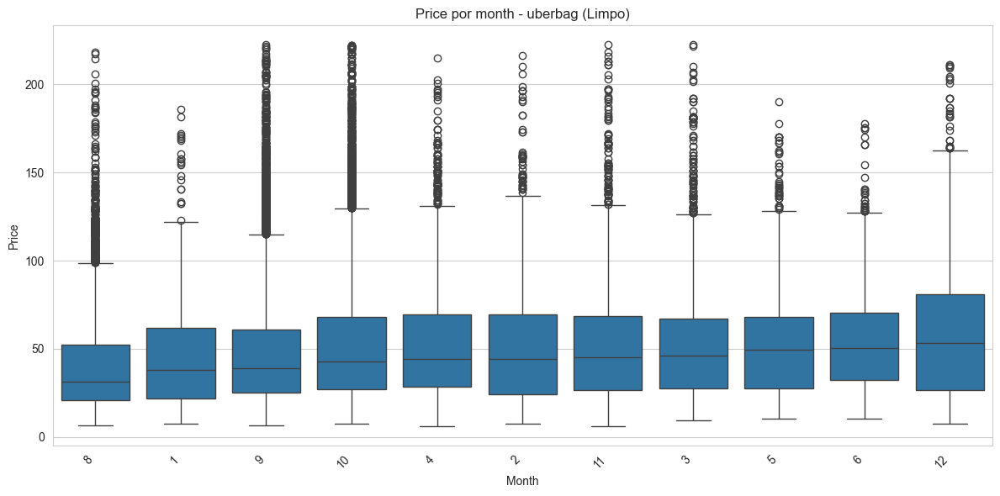


Analisando Relação: Price vs. weekday


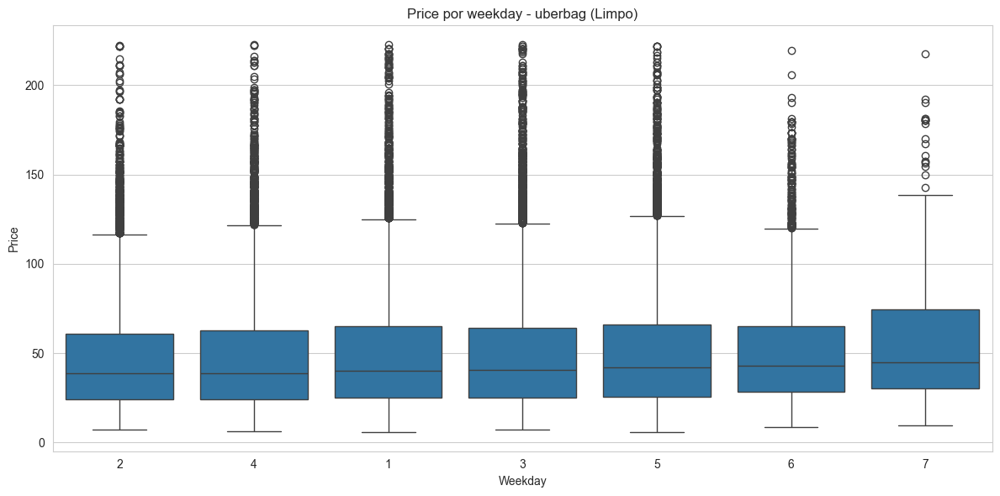


Analisando Relação: Price vs. hour


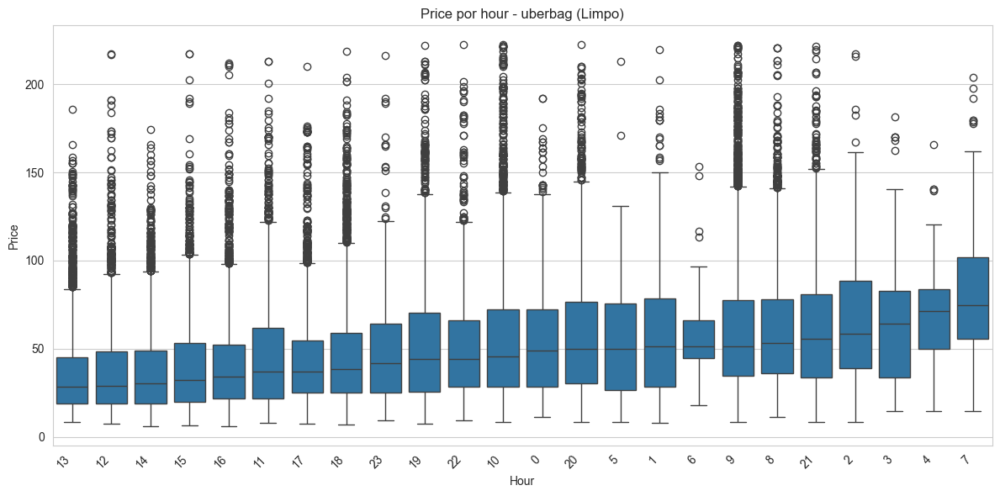


Analisando Relação: Price vs. is_holiday


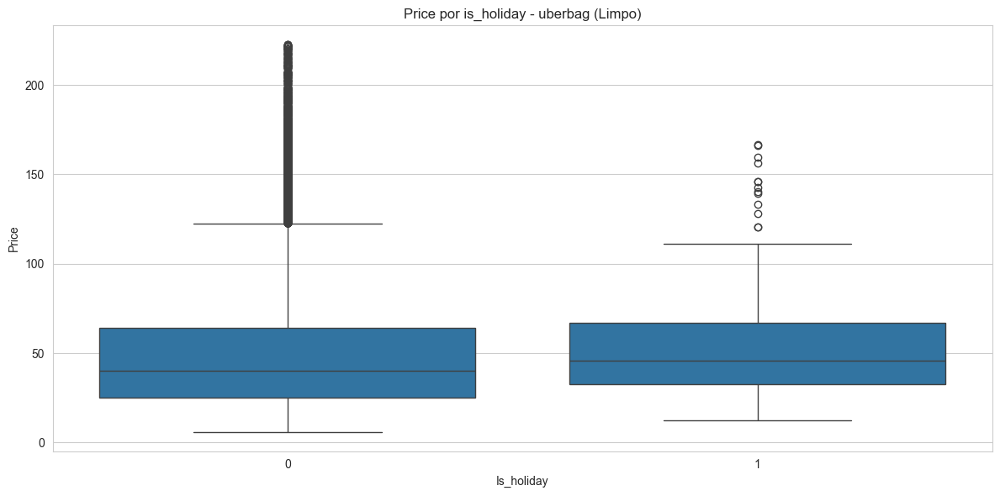


--- 4.1 Tendências Temporais (Mediana do Preço) ---


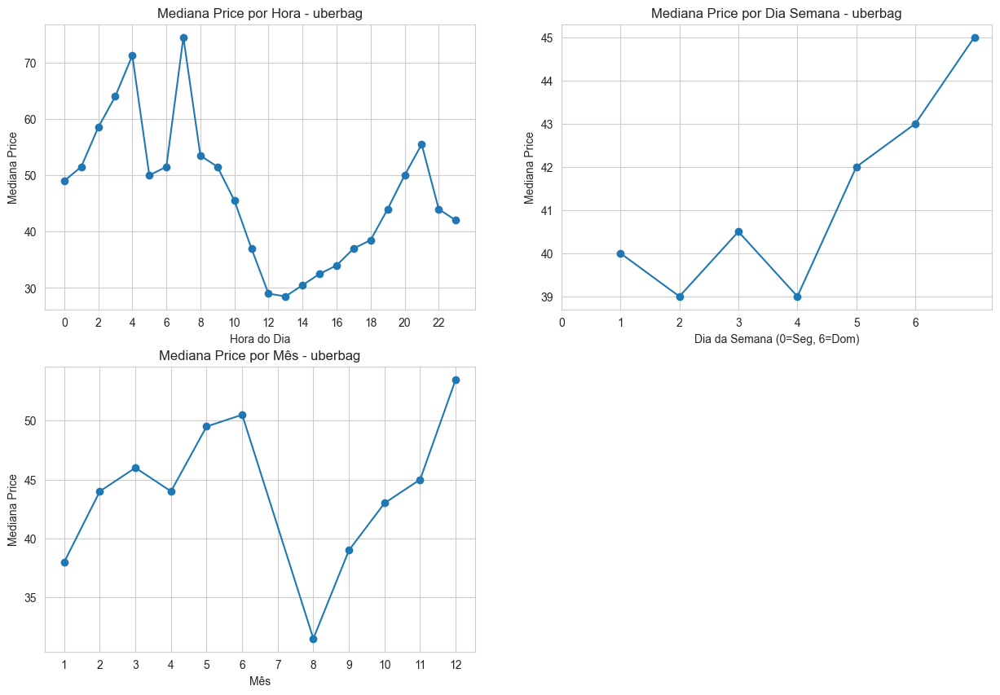

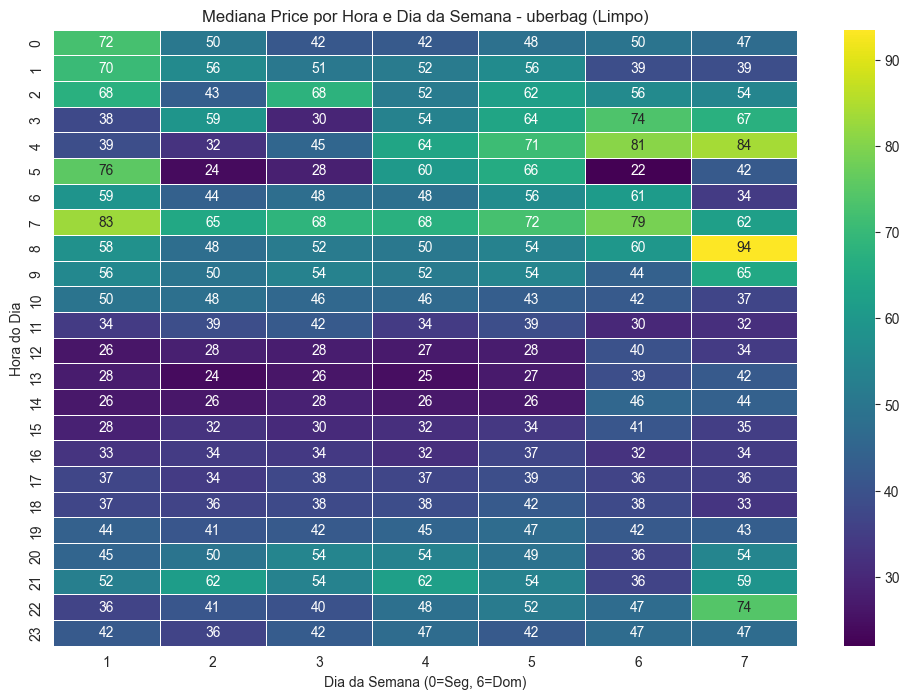

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para UBERBAG (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: UBERBLACKBAG (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 36340 entries, 0 to 36640
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   ride_id       36340 non-null  int64         
 1   product_id    36340 non-null  object        
 2   subcategory   36340 non-null  object        
 3   price         36340 non-null  float64       
 4   datetime      36340 non-null  datetime64[ns]
 5   distance_m    36340 non-null  float64       
 6   duration_s    36340 non-null  float64       
 7   year          36340 non-null  int64         
 8   month         36340 non-null  int64         
 9   day           36340 non-null  int64         
 10  weekday  

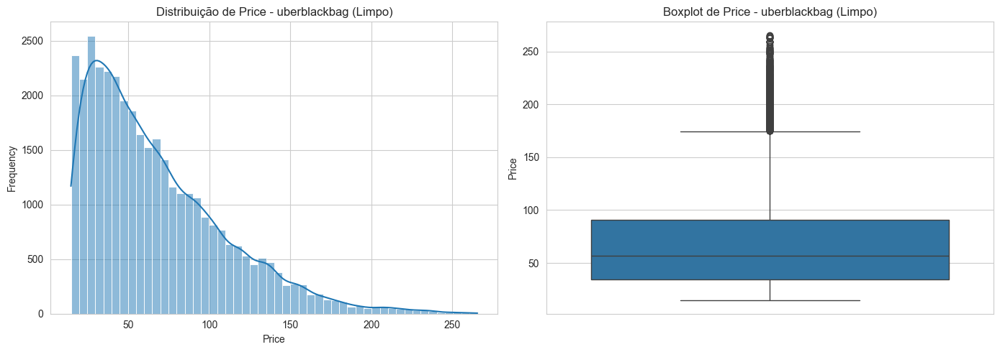


--- 3.1 Distribuição de Distance e Duration ---


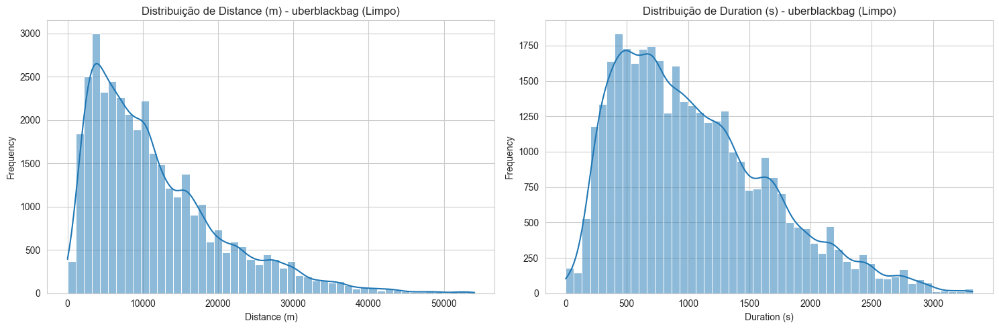

Skewness de Price (após limpeza): 1.17

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
distance_m      0.94
duration_s      0.93
ride_id         0.14
hour_cos        0.13
year            0.12
hour_sin        0.03
is_peak_hour    0.02
hour            0.02
hour_min        0.02
weekday         0.01
is_holiday      0.01
weekday_sin    -0.01
weekday_cos    -0.02
day            -0.03
month          -0.07
Name: price, dtype: float64


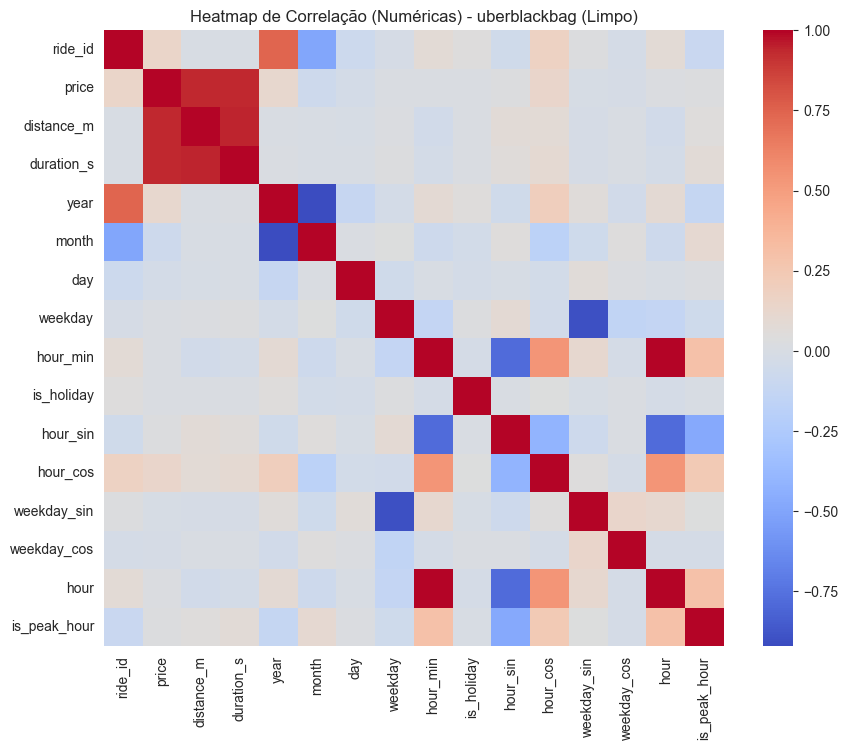


Scatter plots (distance_m, duration_s vs price):


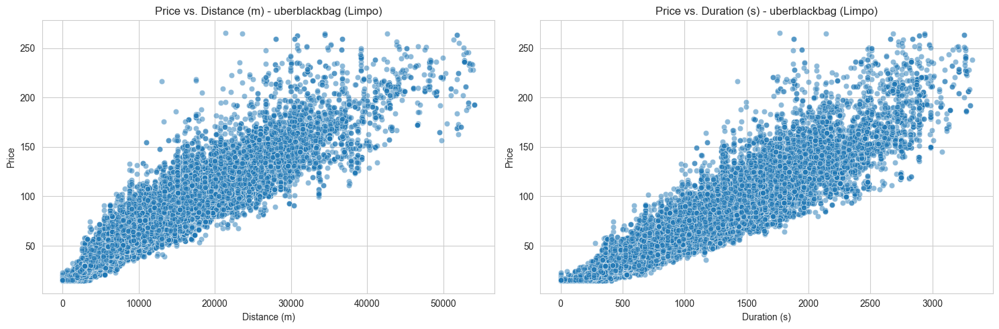


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. year


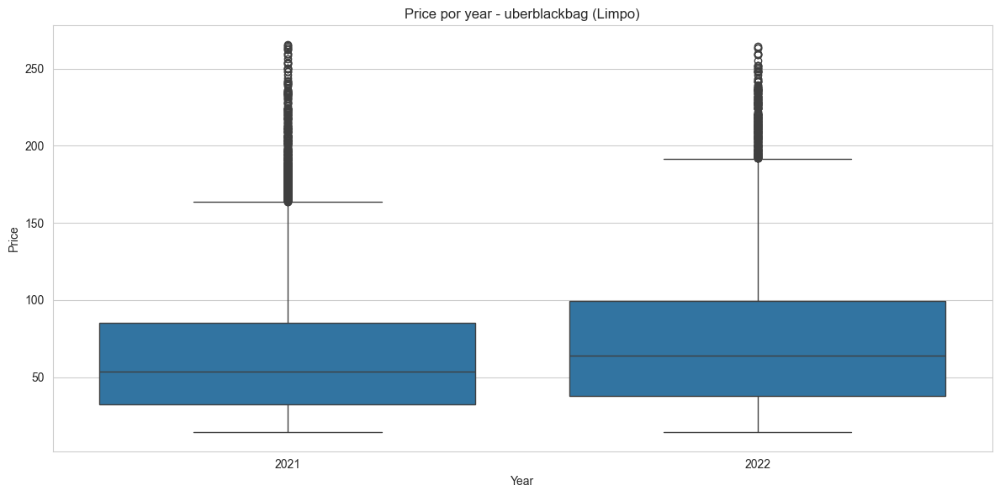


Analisando Relação: Price vs. month


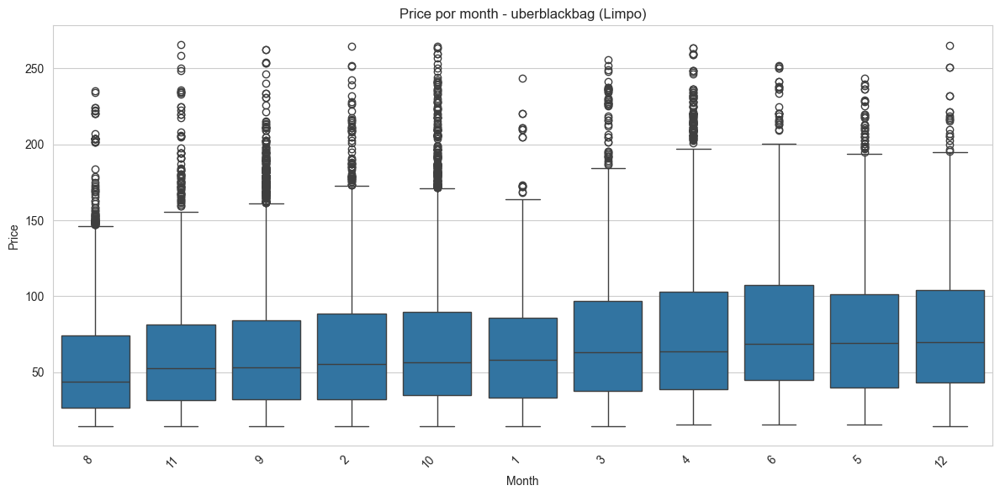


Analisando Relação: Price vs. weekday


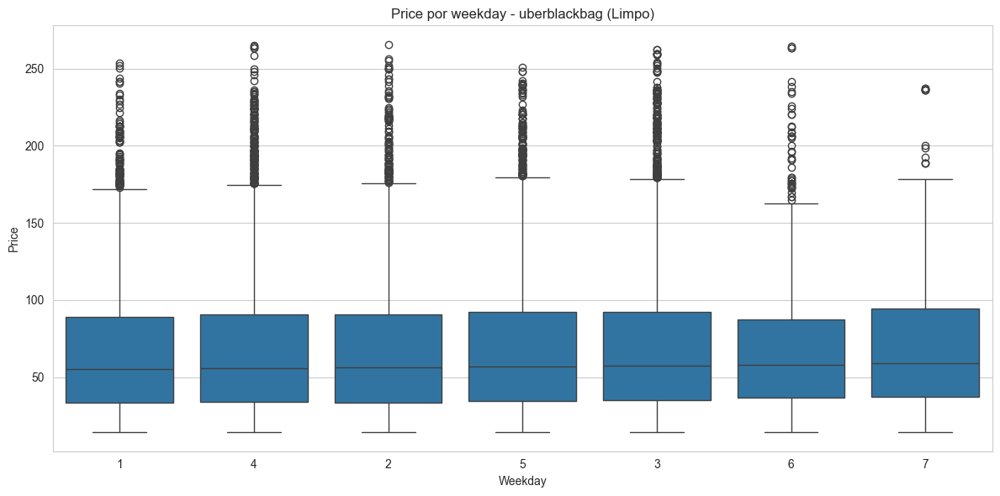


Analisando Relação: Price vs. hour


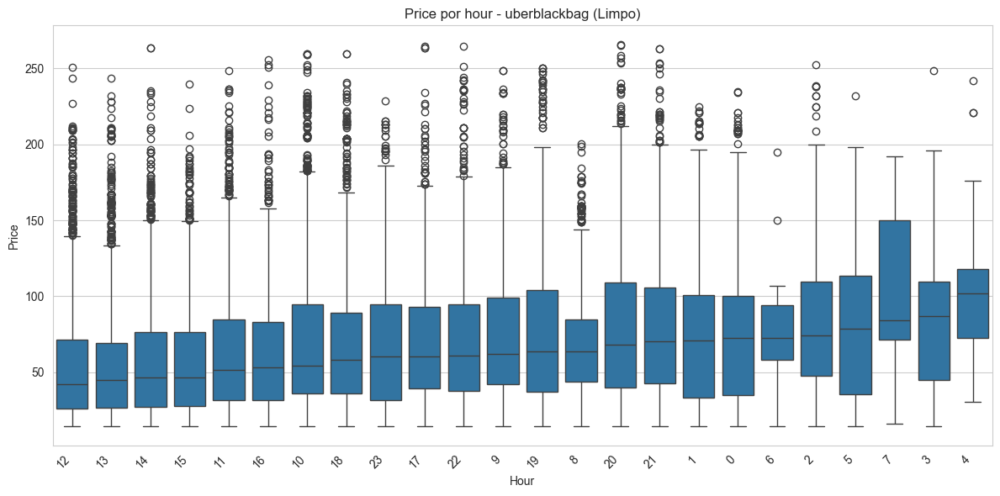


Analisando Relação: Price vs. is_holiday


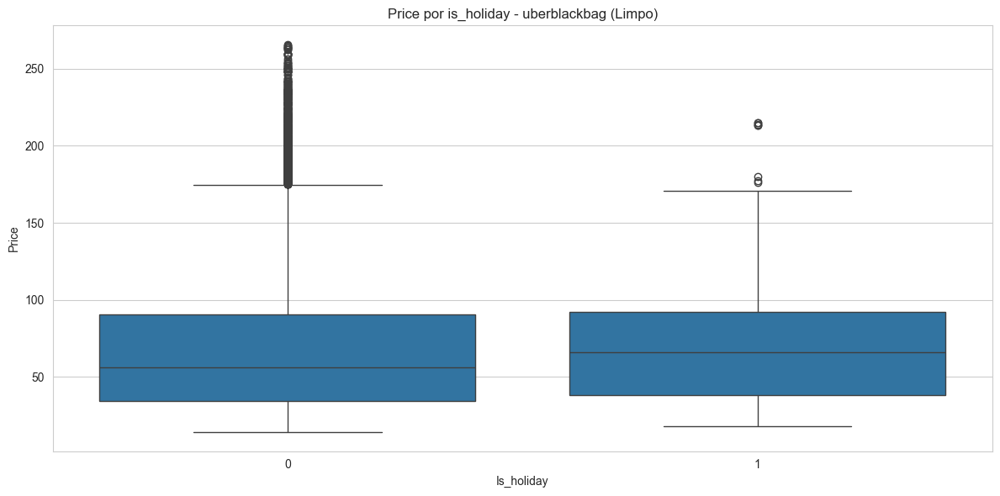


--- 4.1 Tendências Temporais (Mediana do Preço) ---


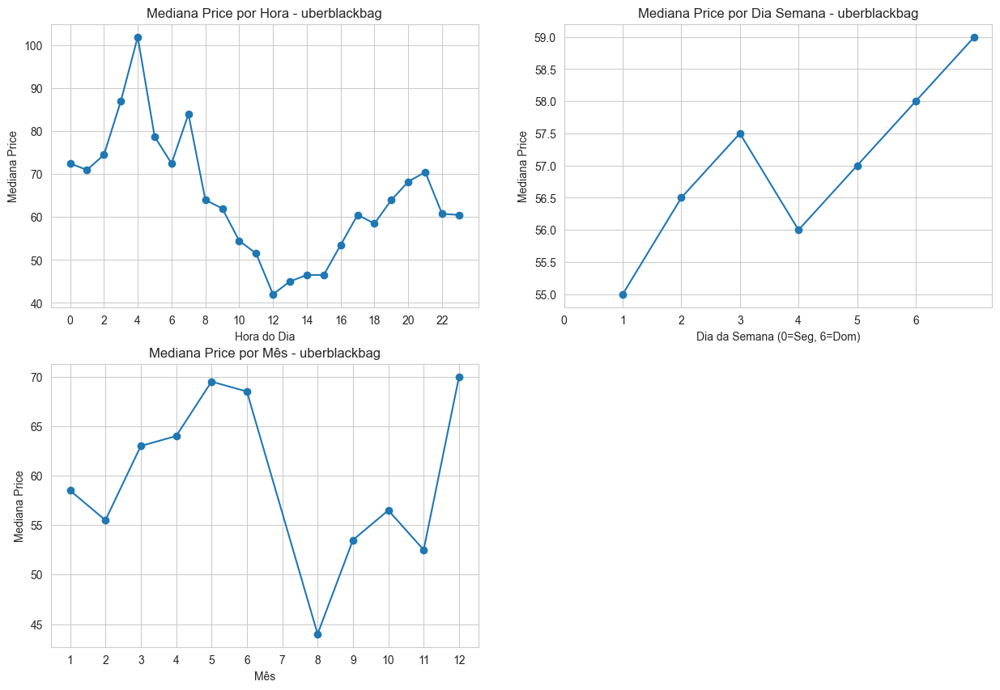

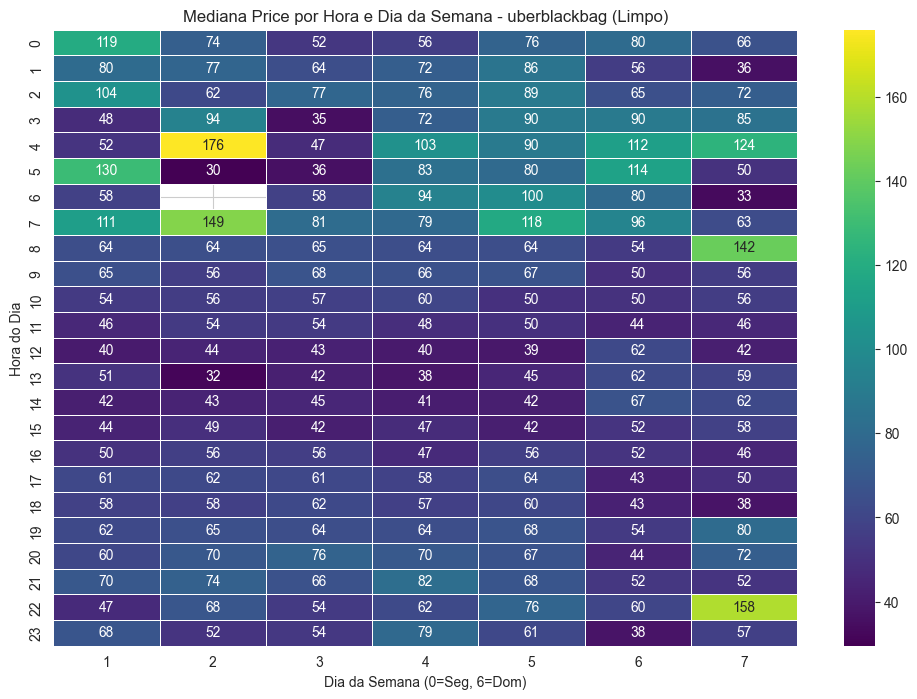

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para UBERBLACKBAG (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: UBERBLACK (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 122506 entries, 0 to 123635
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   ride_id       122506 non-null  int64         
 1   product_id    122506 non-null  object        
 2   subcategory   122506 non-null  object        
 3   price         122506 non-null  float64       
 4   datetime      122506 non-null  datetime64[ns]
 5   distance_m    122506 non-null  float64       
 6   duration_s    122506 non-null  float64       
 7   year          122506 non-null  int64         
 8   month         122506 non-null  int64         
 9   day           122506 non-null  int64        

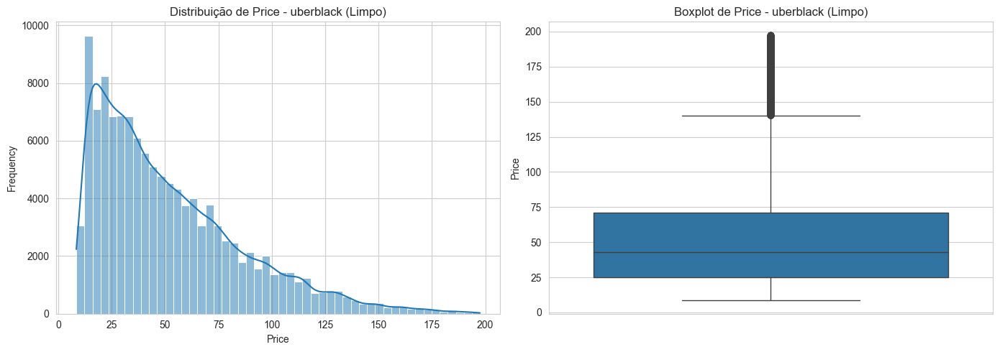


--- 3.1 Distribuição de Distance e Duration ---


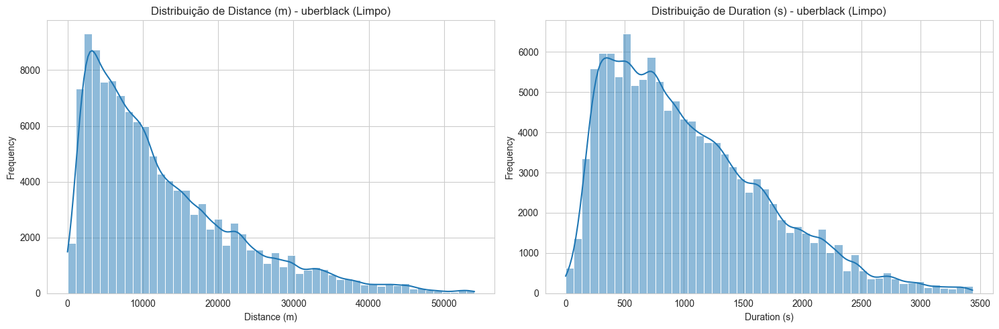

Skewness de Price (após limpeza): 1.14

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
duration_s      0.95
distance_m      0.94
hour_sin        0.09
hour_cos        0.09
year            0.06
is_peak_hour    0.05
ride_id         0.05
weekday         0.02
weekday_cos     0.01
is_holiday     -0.01
weekday_sin    -0.02
day            -0.02
hour           -0.04
hour_min       -0.04
month          -0.04
Name: price, dtype: float64


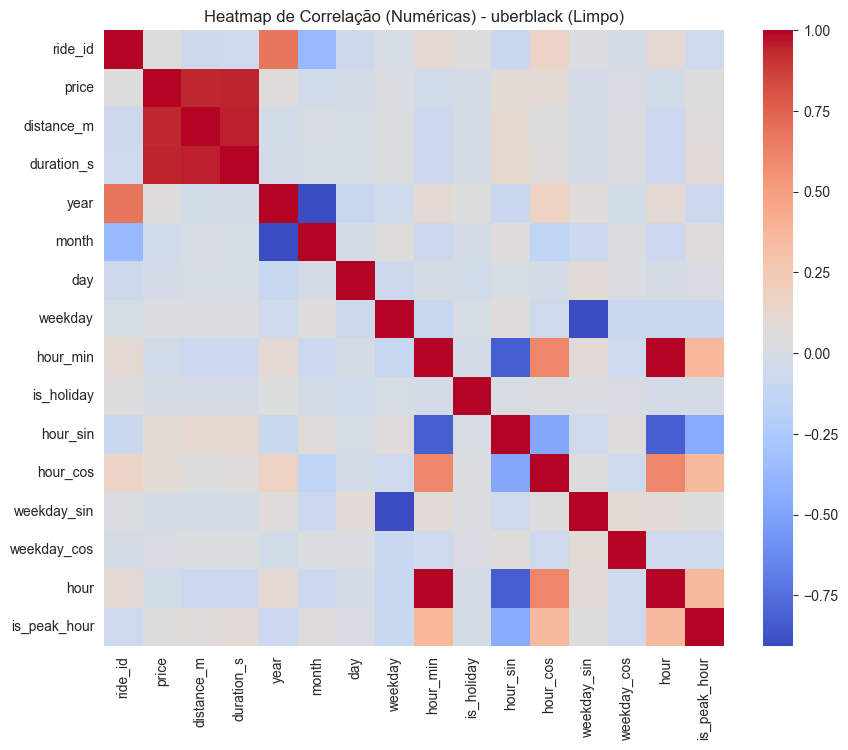


Scatter plots (distance_m, duration_s vs price):


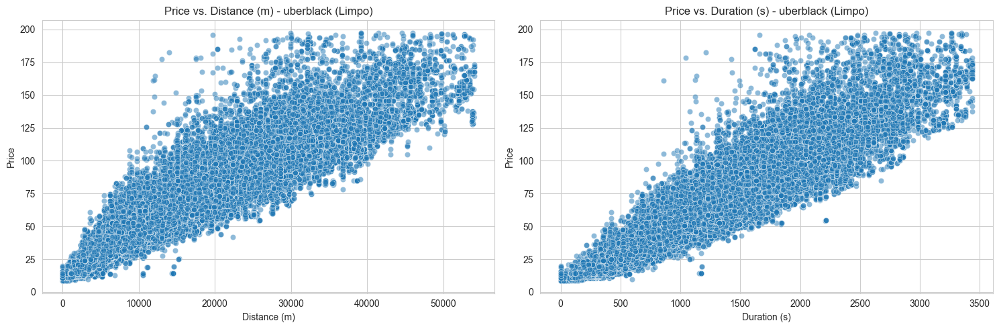


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. year


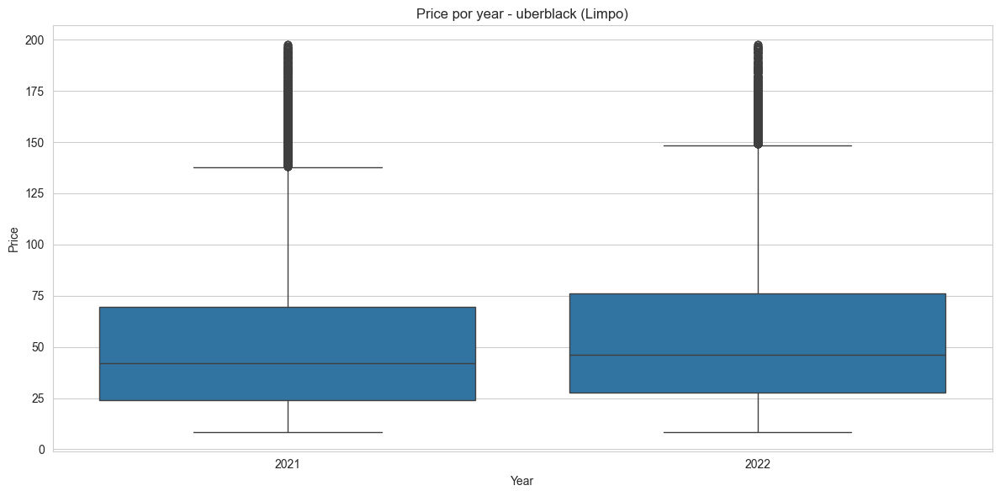


Analisando Relação: Price vs. month


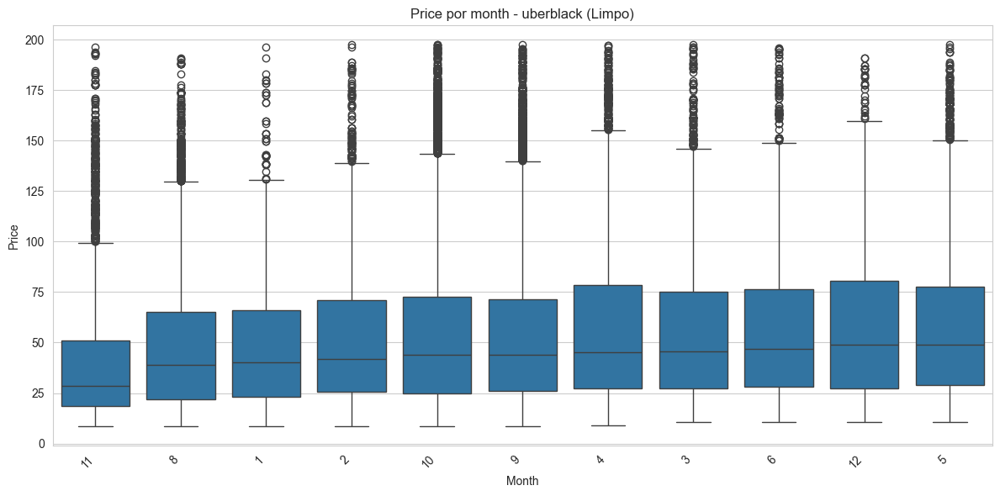


Analisando Relação: Price vs. weekday


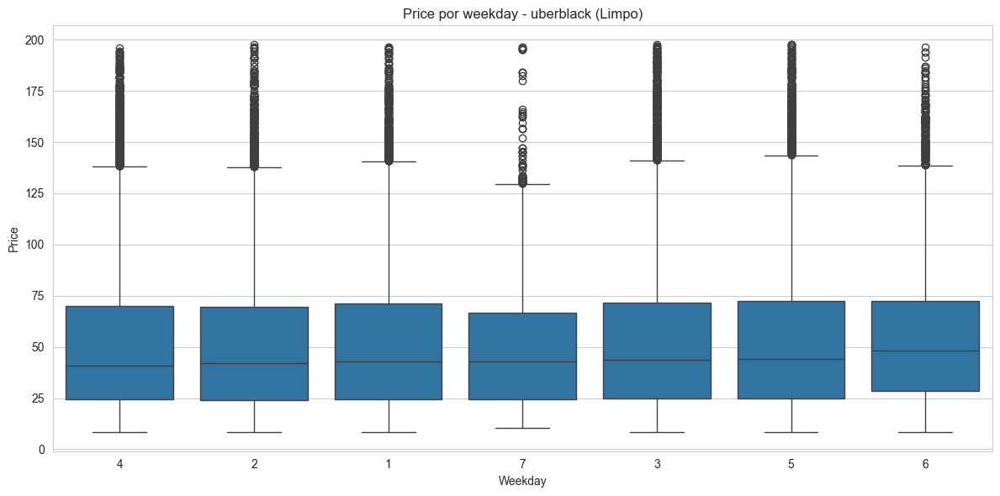


Analisando Relação: Price vs. hour


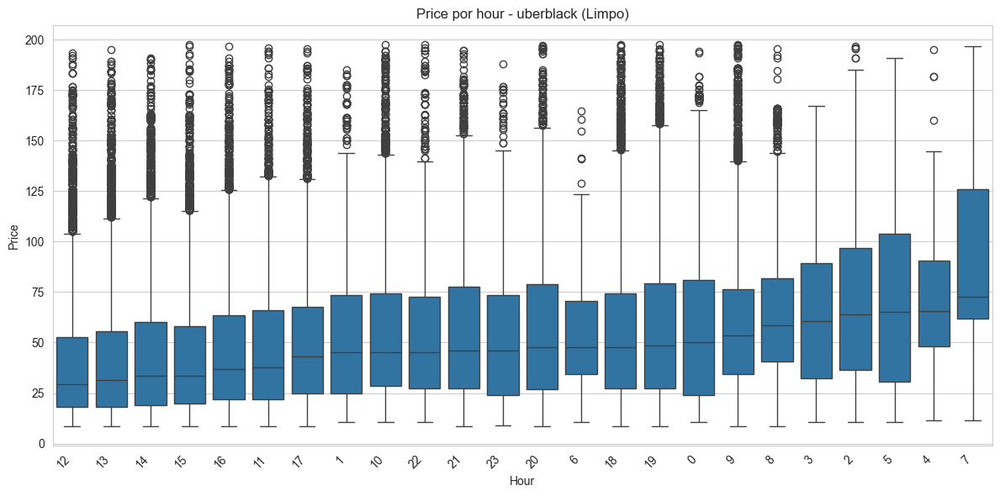


Analisando Relação: Price vs. is_holiday


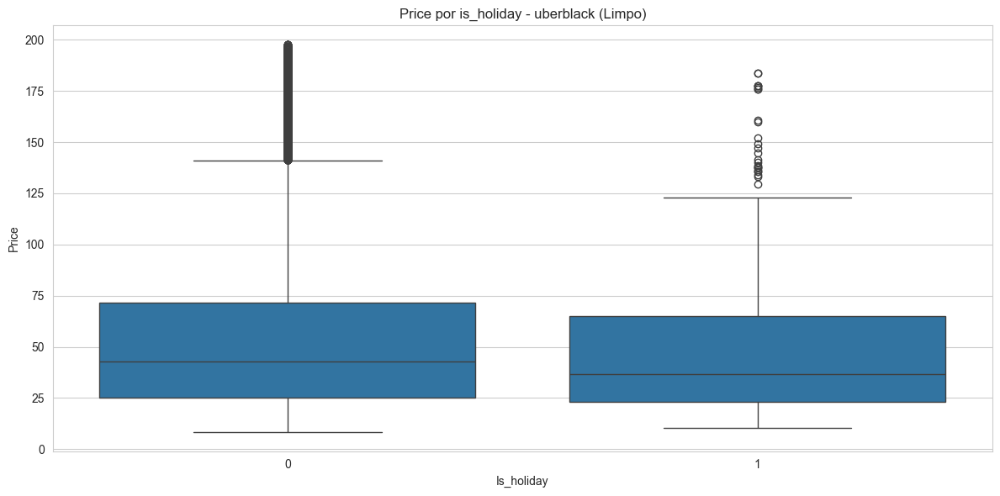


--- 4.1 Tendências Temporais (Mediana do Preço) ---


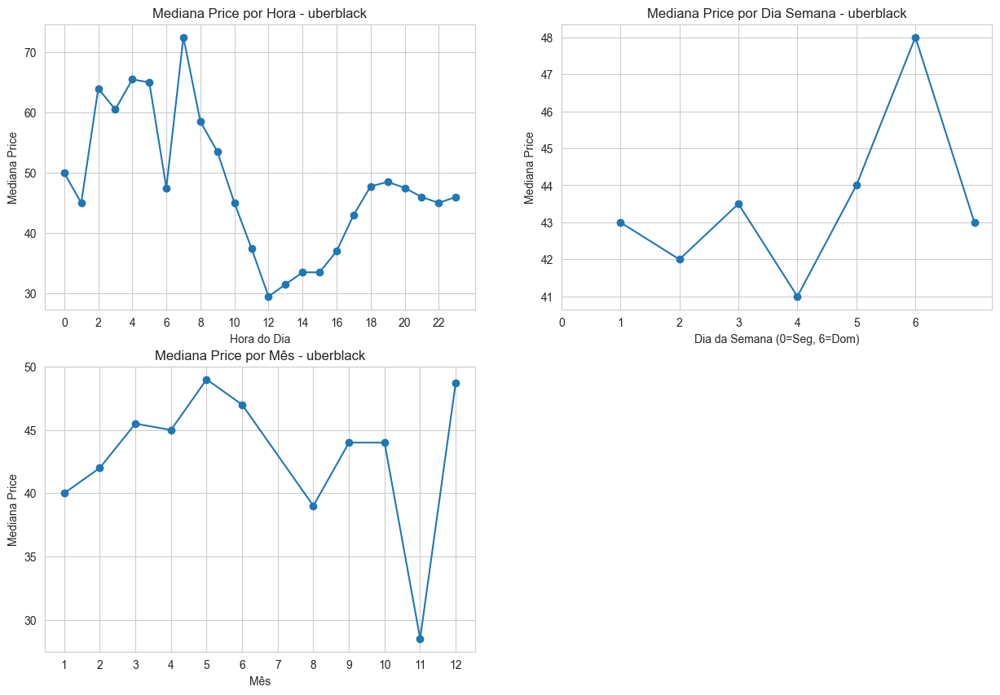

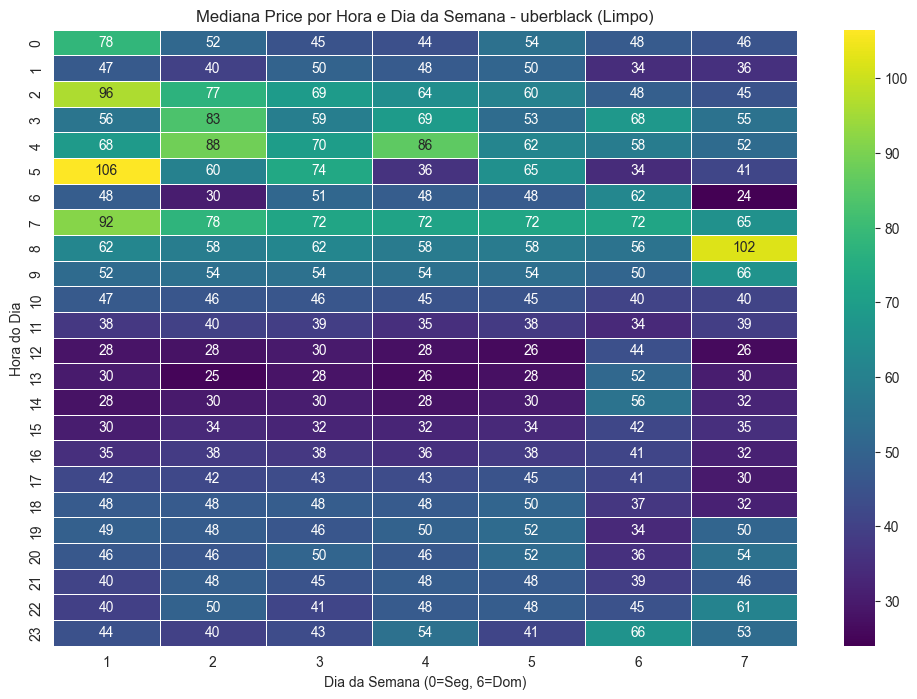

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para UBERBLACK (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: UBERCOMFORT (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 191130 entries, 0 to 192940
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   ride_id       191130 non-null  int64         
 1   product_id    191130 non-null  object        
 2   subcategory   191130 non-null  object        
 3   price         191130 non-null  float64       
 4   datetime      191130 non-null  datetime64[ns]
 5   distance_m    191130 non-null  float64       
 6   duration_s    191130 non-null  float64       
 7   year          191130 non-null  int64         
 8   month         191130 non-null  int64         
 9   day           191130 non-null  int64         

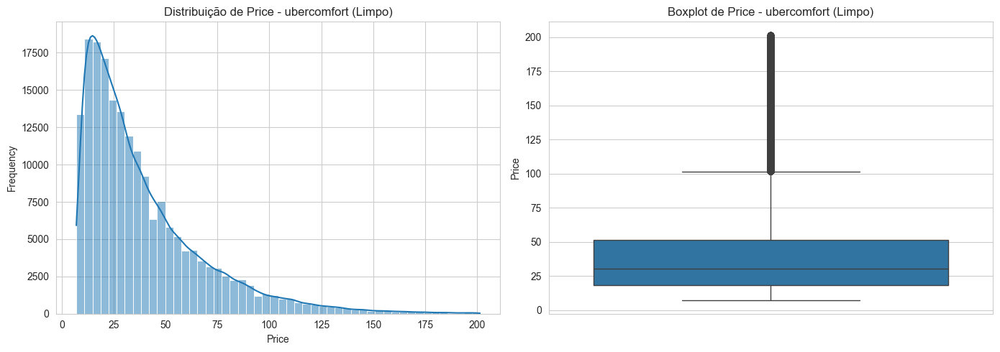


--- 3.1 Distribuição de Distance e Duration ---


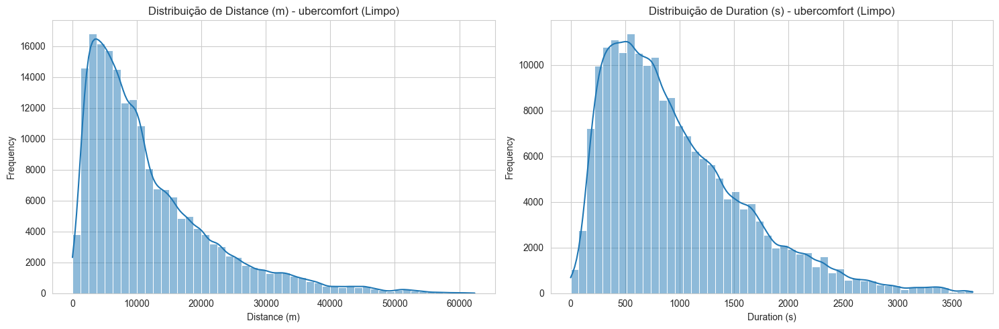

Skewness de Price (após limpeza): 1.69

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
duration_s      0.86
distance_m      0.85
hour_sin        0.13
hour_cos        0.07
year            0.07
ride_id         0.06
weekday_cos     0.03
is_peak_hour    0.01
weekday         0.01
is_holiday      0.00
weekday_sin    -0.01
day            -0.04
month          -0.04
hour           -0.06
hour_min       -0.06
Name: price, dtype: float64


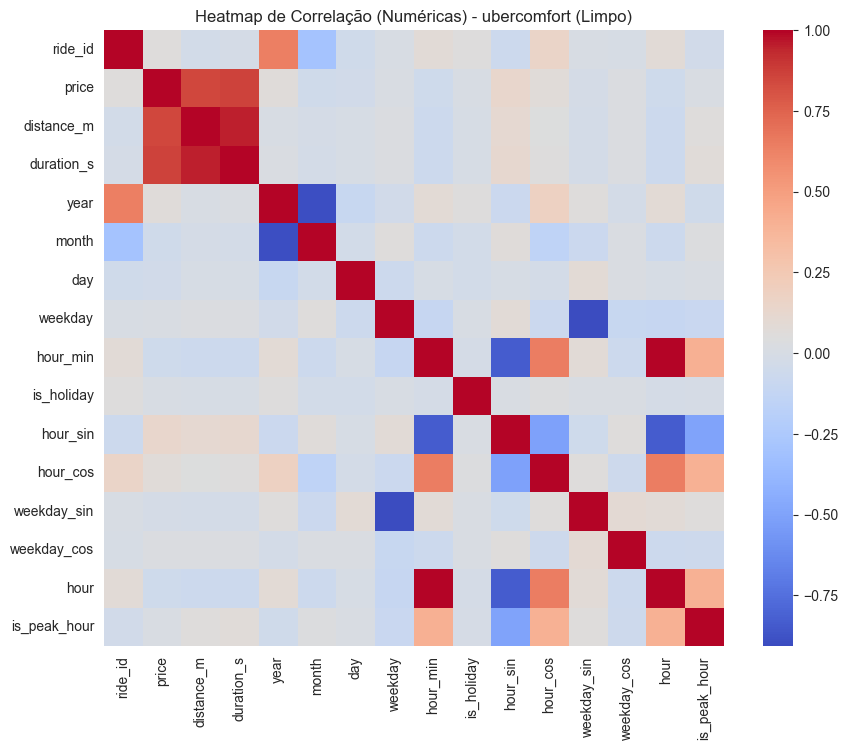


Scatter plots (distance_m, duration_s vs price):


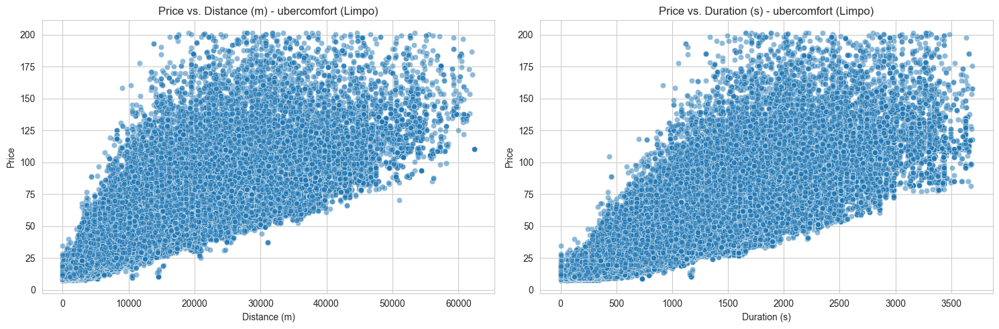


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. year


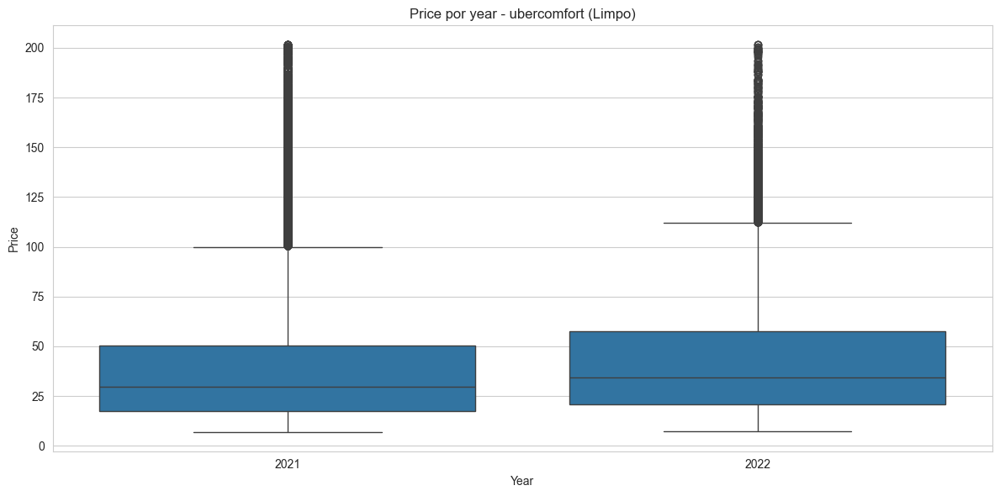


Analisando Relação: Price vs. month


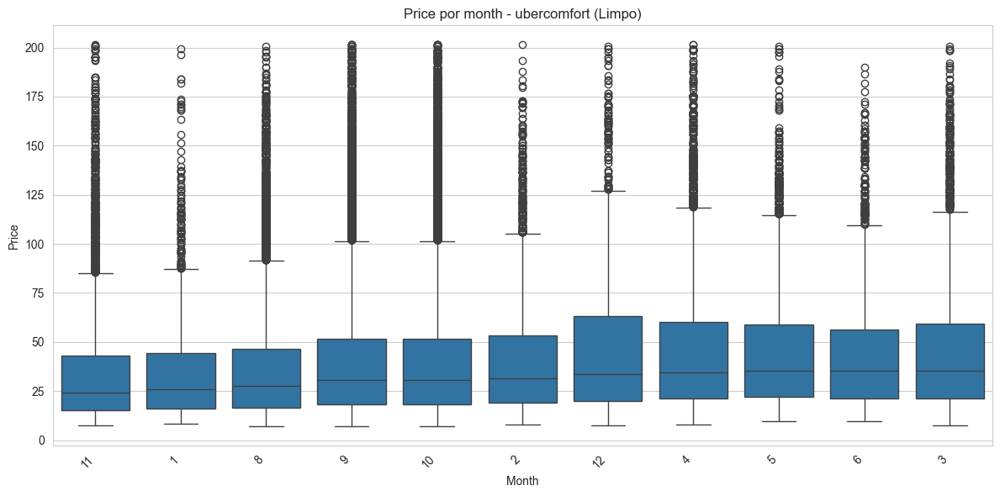


Analisando Relação: Price vs. weekday


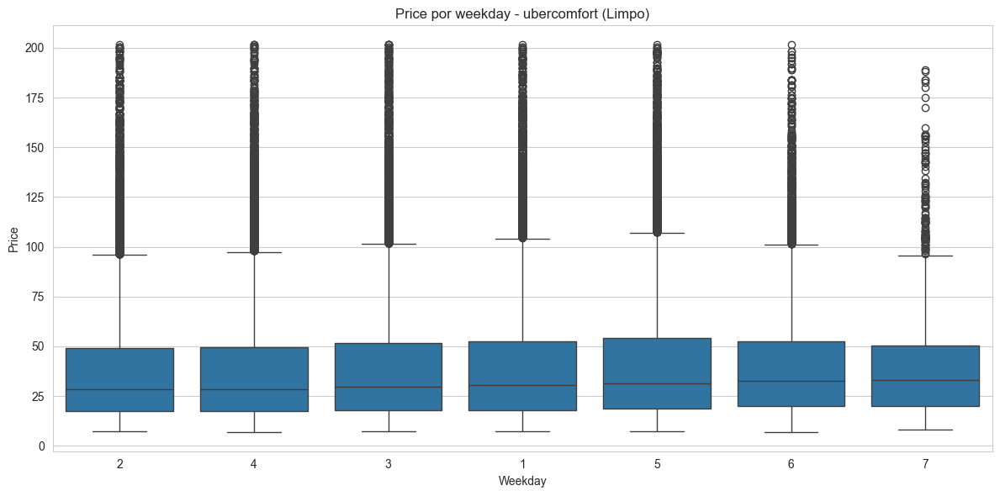


Analisando Relação: Price vs. hour


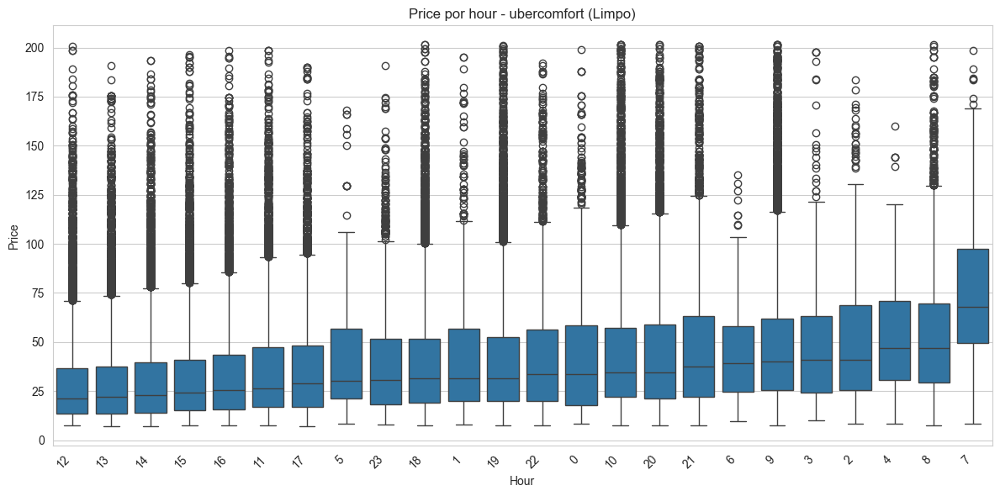


Analisando Relação: Price vs. is_holiday


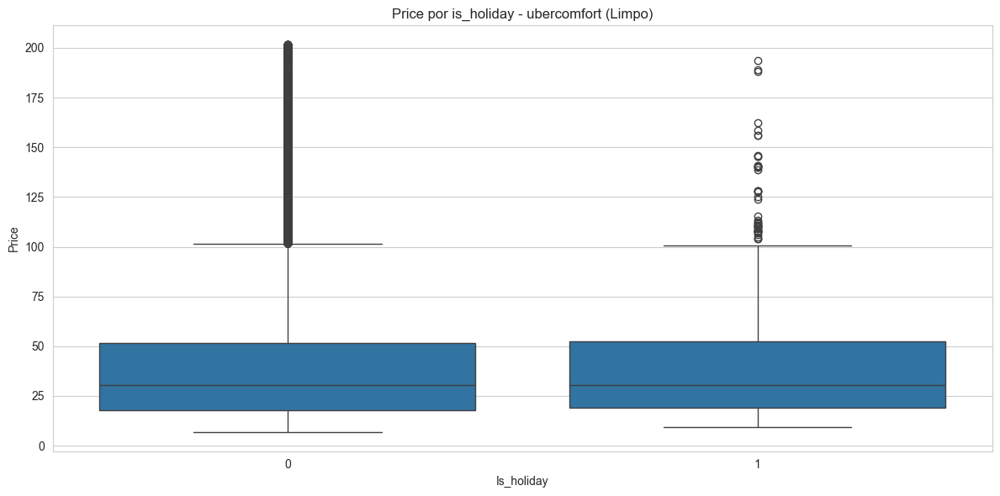


--- 4.1 Tendências Temporais (Mediana do Preço) ---


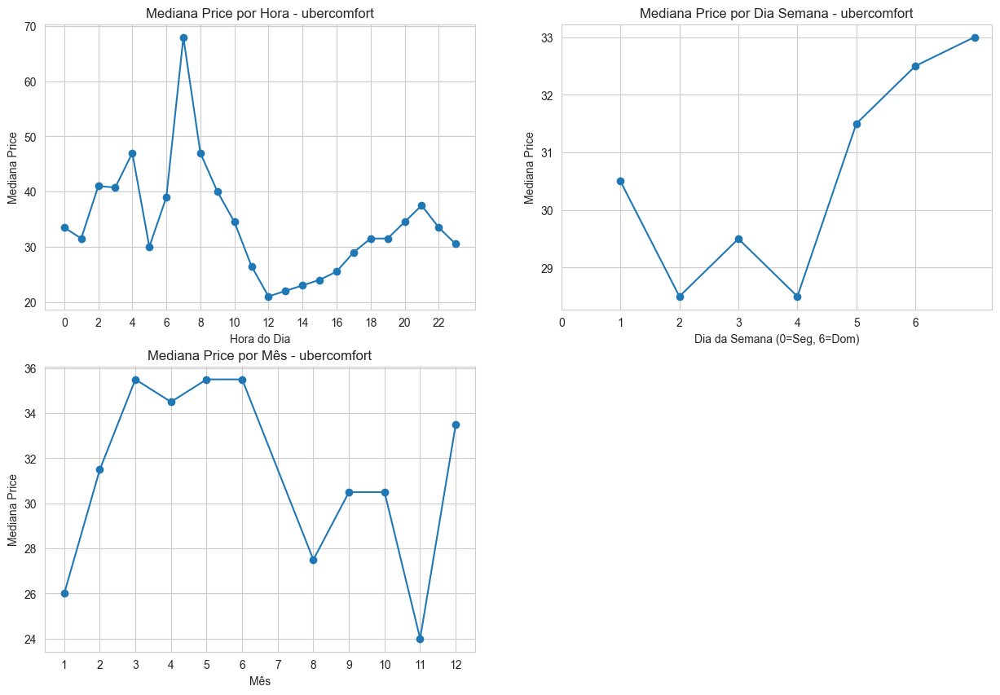

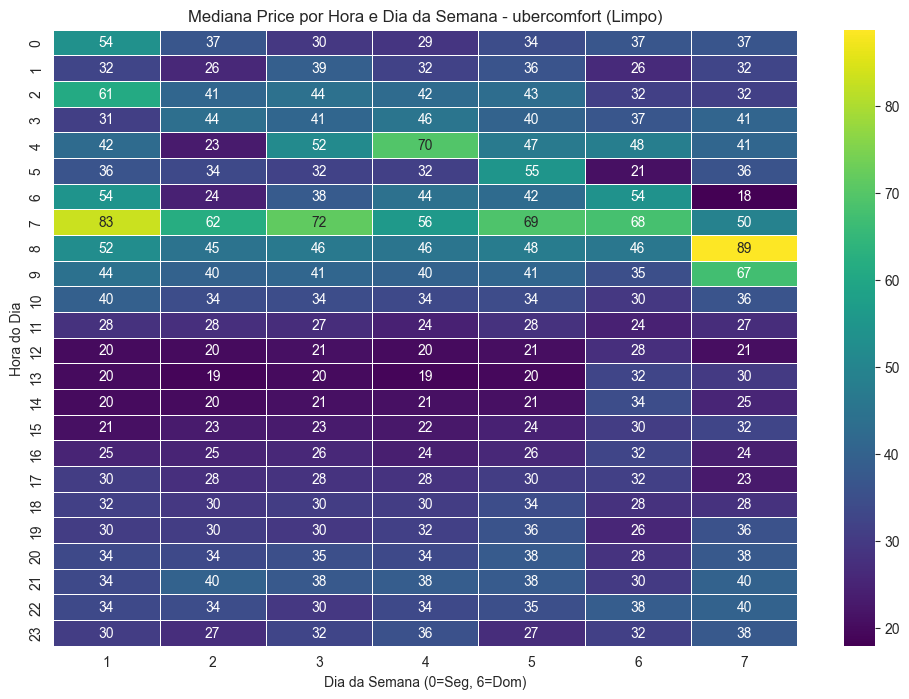

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para UBERCOMFORT (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: UBERPROMO (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 103180 entries, 0 to 104103
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   ride_id       103180 non-null  int64         
 1   product_id    103180 non-null  object        
 2   subcategory   103180 non-null  object        
 3   price         103180 non-null  float64       
 4   datetime      103180 non-null  datetime64[ns]
 5   distance_m    103180 non-null  float64       
 6   duration_s    103180 non-null  float64       
 7   year          103180 non-null  int64         
 8   month         103180 non-null  int64         
 9   day           103180 non-null  int64         

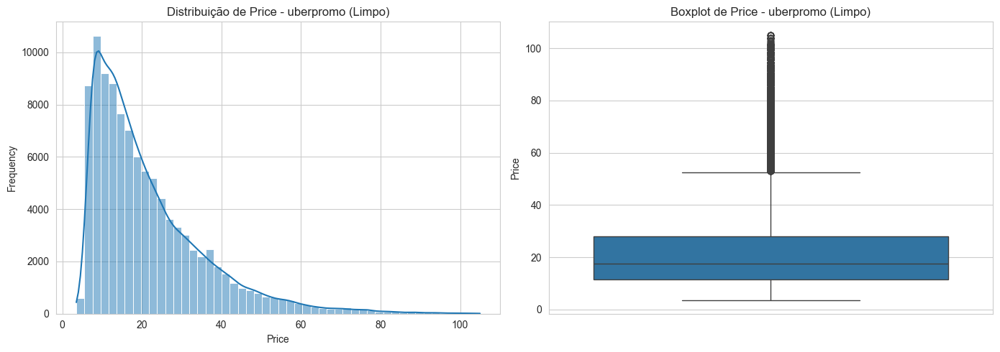


--- 3.1 Distribuição de Distance e Duration ---


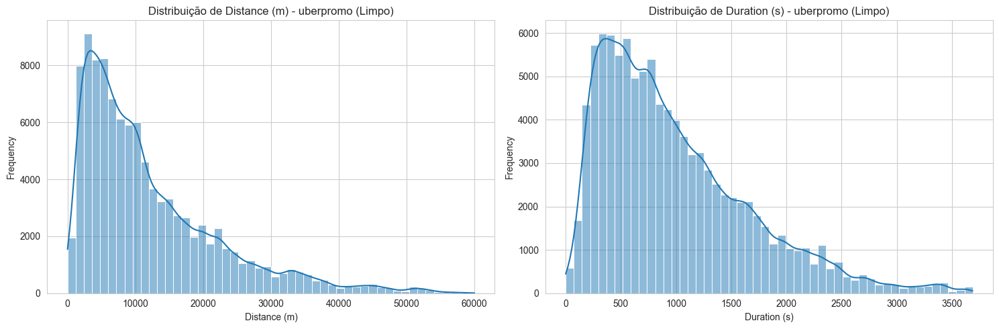

Skewness de Price (após limpeza): 1.66

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
duration_s      0.87
distance_m      0.85
hour_sin        0.15
hour_cos        0.08
is_peak_hour    0.07
weekday         0.04
weekday_cos     0.03
month           0.02
ride_id         0.01
is_holiday      0.00
day            -0.03
weekday_sin    -0.04
hour           -0.08
hour_min       -0.08
year             NaN
Name: price, dtype: float64


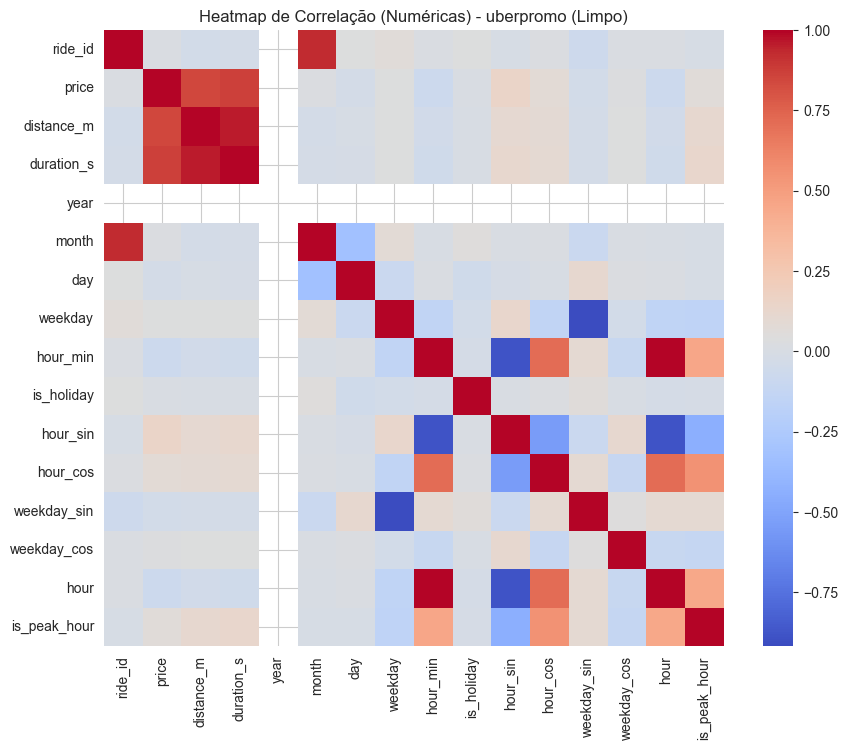


Scatter plots (distance_m, duration_s vs price):


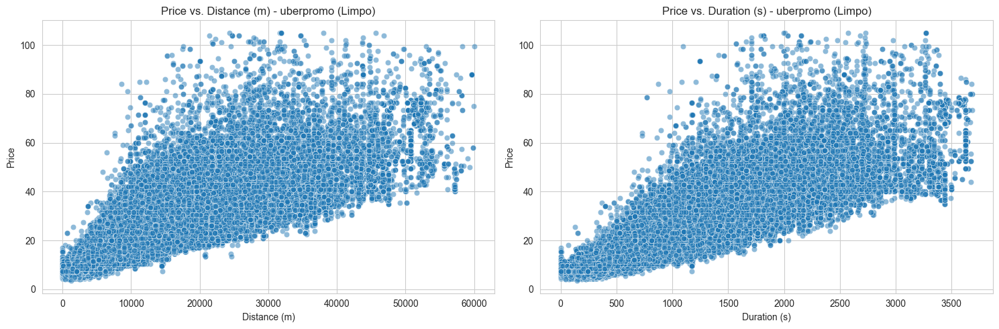


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.
  Coluna 'year' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. month


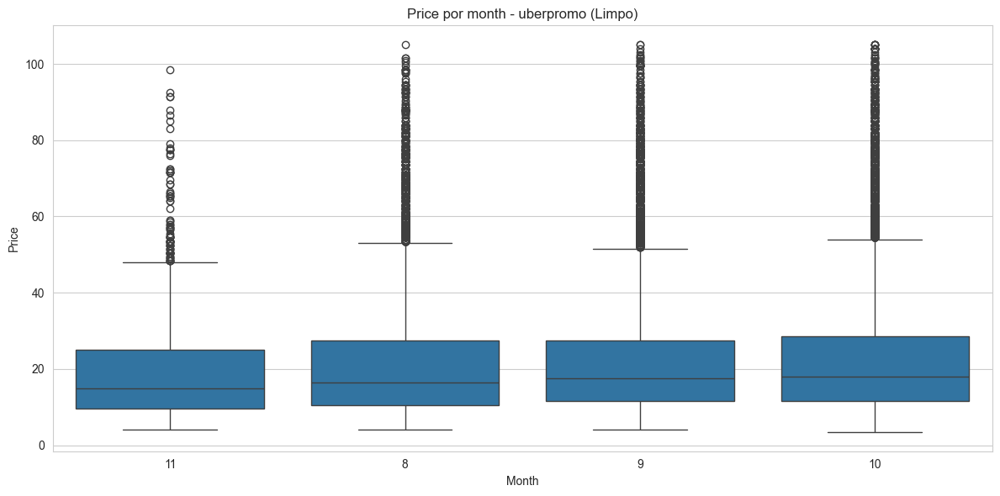


Analisando Relação: Price vs. weekday


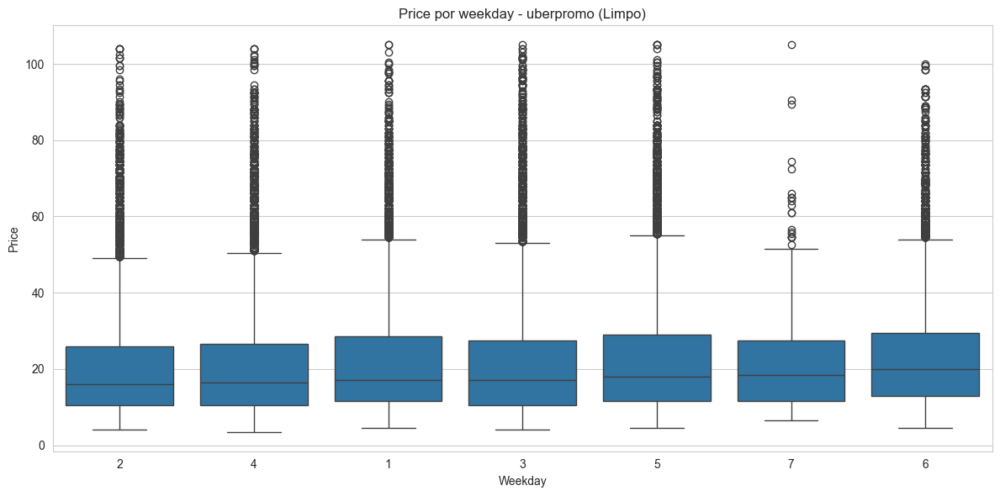


Analisando Relação: Price vs. hour


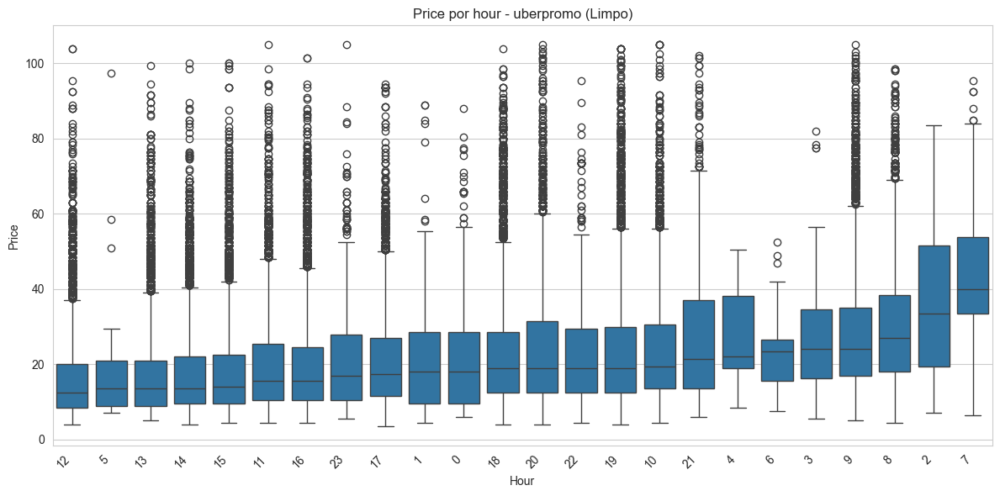


Analisando Relação: Price vs. is_holiday


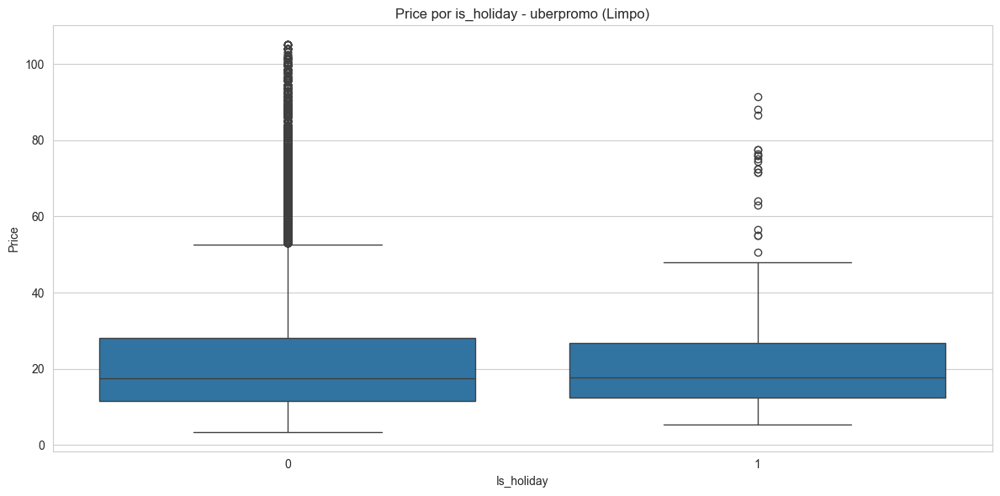


--- 4.1 Tendências Temporais (Mediana do Preço) ---


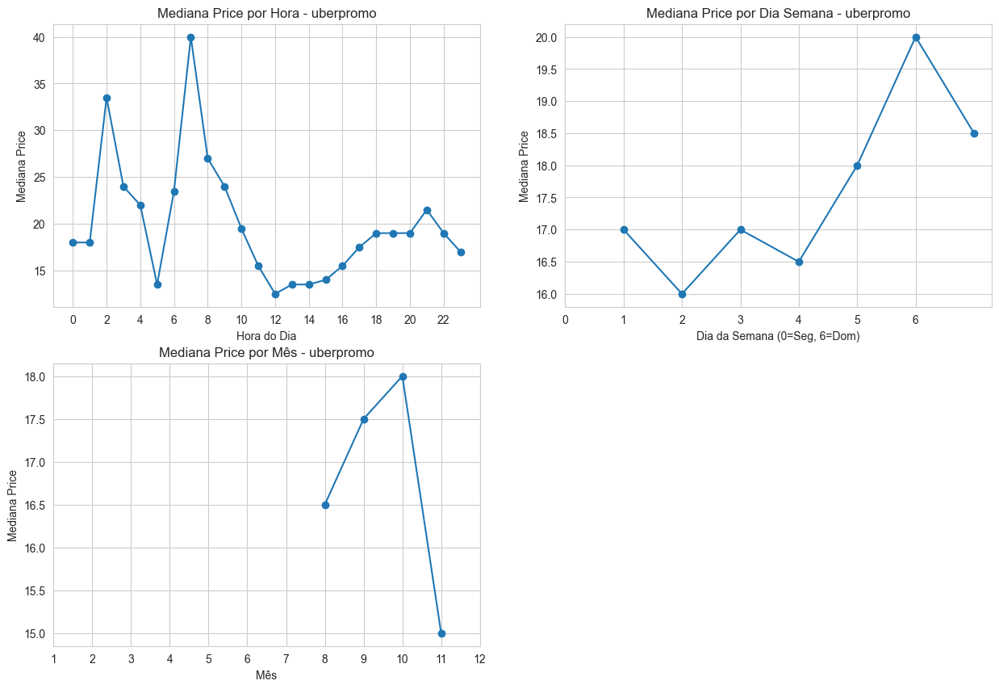

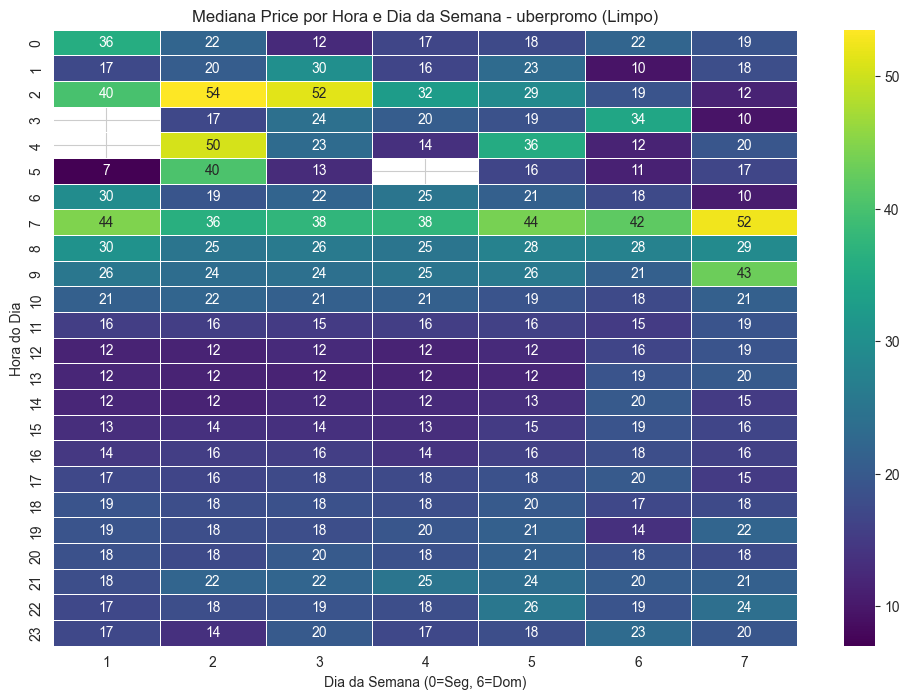

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para UBERPROMO (Dados Limpos) ---



##########################################################
### Analisando Subcategoria: UBERX (Dados Limpos) ###
##########################################################


--- 1.1 Informações Gerais (Tipos, Nulos) ---
<class 'pandas.core.frame.DataFrame'>
Index: 206932 entries, 0 to 208798
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   ride_id       206932 non-null  int64         
 1   product_id    206932 non-null  object        
 2   subcategory   206932 non-null  object        
 3   price         206932 non-null  float64       
 4   datetime      206932 non-null  datetime64[ns]
 5   distance_m    206932 non-null  float64       
 6   duration_s    206932 non-null  float64       
 7   year          206932 non-null  int64         
 8   month         206932 non-null  int64         
 9   day           206932 non-null  int64         
 10  

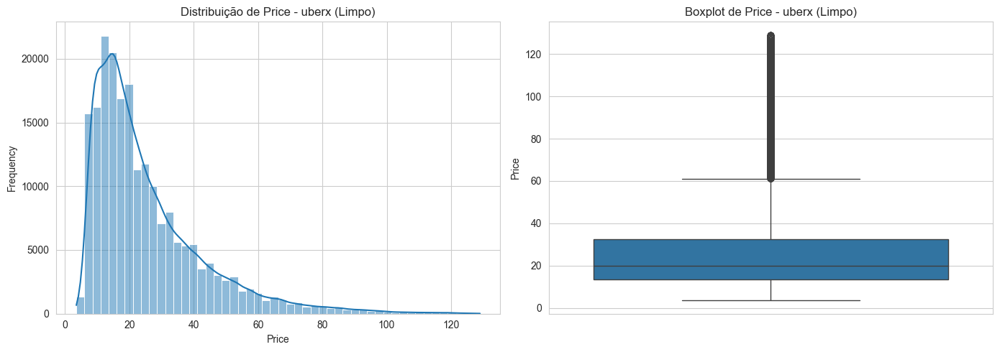


--- 3.1 Distribuição de Distance e Duration ---


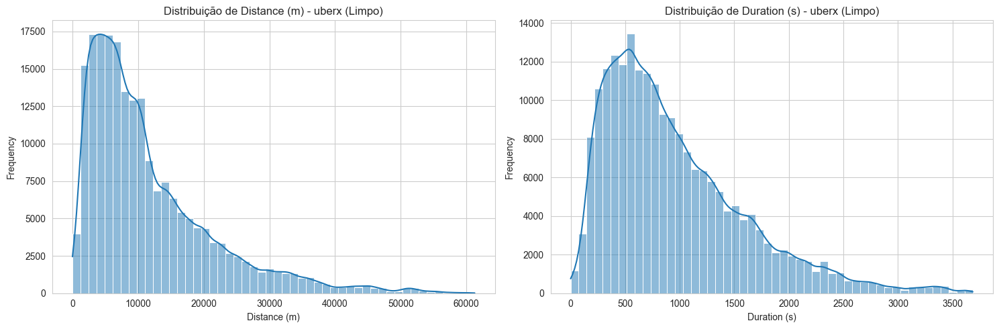

Skewness de Price (após limpeza): 1.78

--- 3. Relação das Features Numéricas com 'price' ---

Correlação de Pearson com 'price':
price           1.00
duration_s      0.85
distance_m      0.85
hour_sin        0.17
weekday_cos     0.03
ride_id         0.03
hour_cos        0.02
year            0.02
is_peak_hour    0.02
weekday         0.02
is_holiday      0.01
month           0.00
weekday_sin    -0.02
day            -0.04
hour           -0.11
hour_min       -0.11
Name: price, dtype: float64


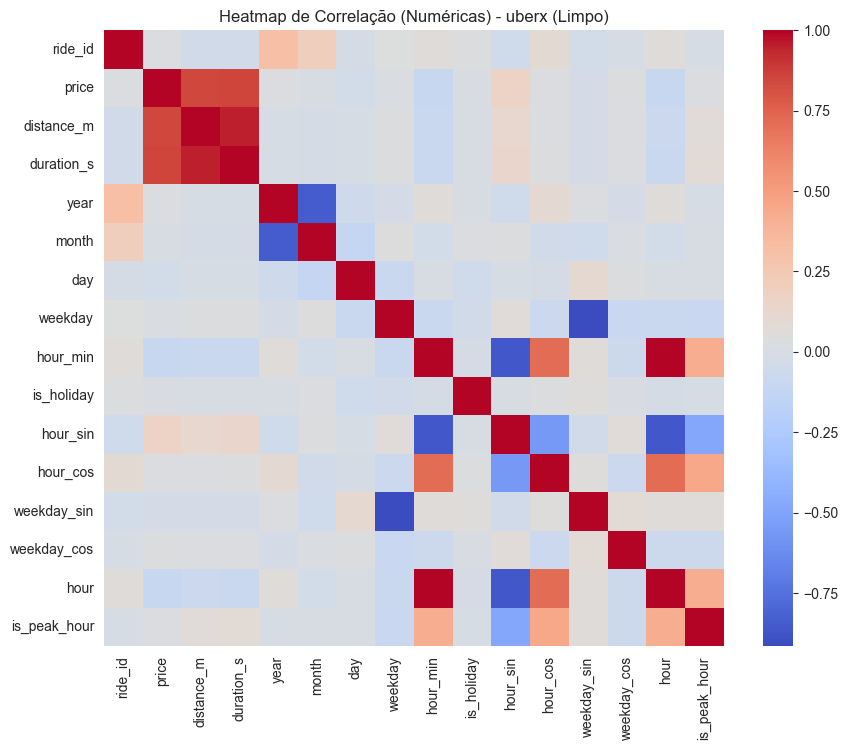


Scatter plots (distance_m, duration_s vs price):


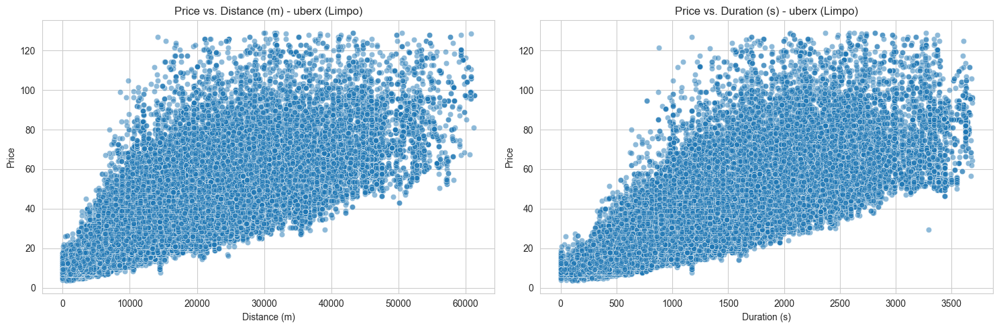


--- 4. Relação das Features Categóricas/Temporais com 'price' ---
  Coluna 'product_id' tem apenas um valor único ou menos. Pulando plot.

Analisando Relação: Price vs. year


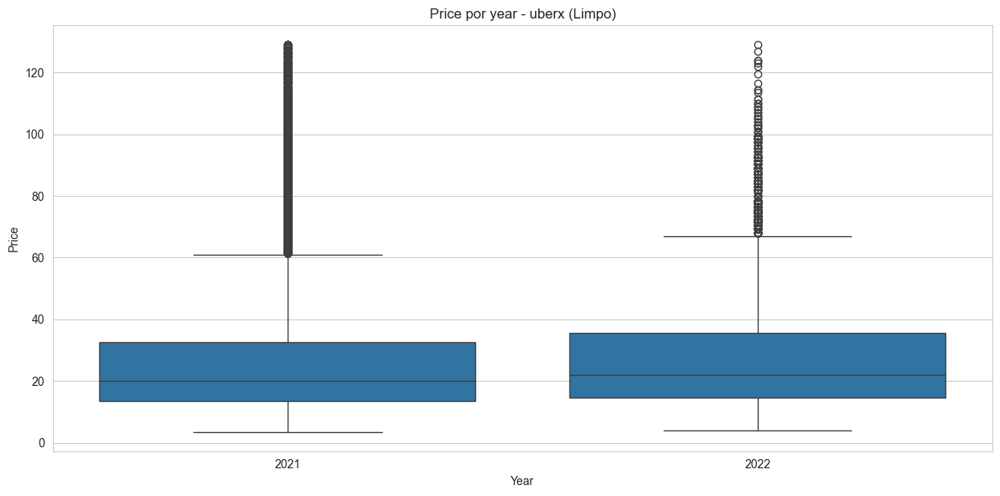


Analisando Relação: Price vs. month


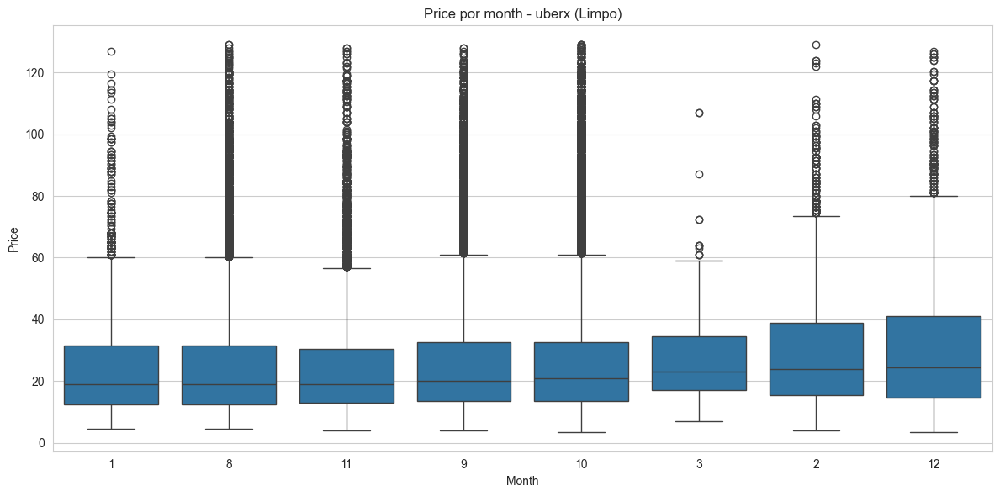


Analisando Relação: Price vs. weekday


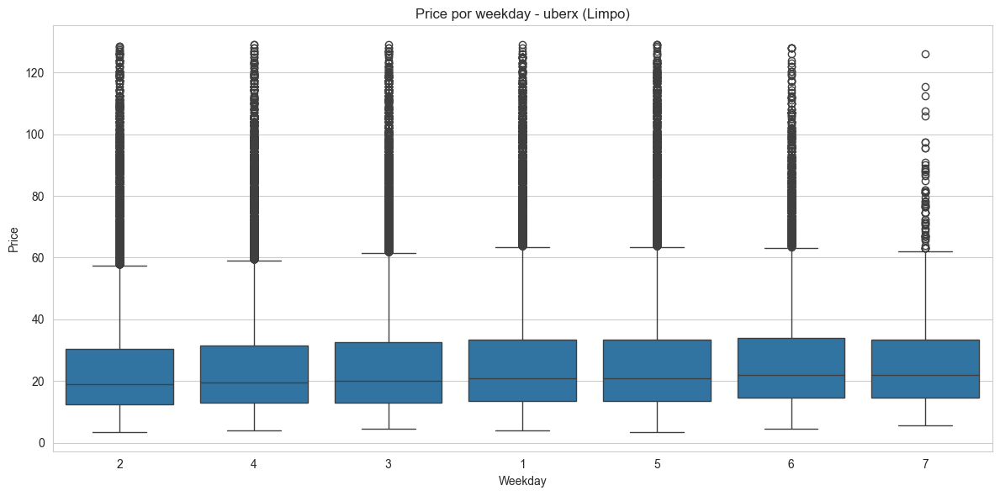


Analisando Relação: Price vs. hour


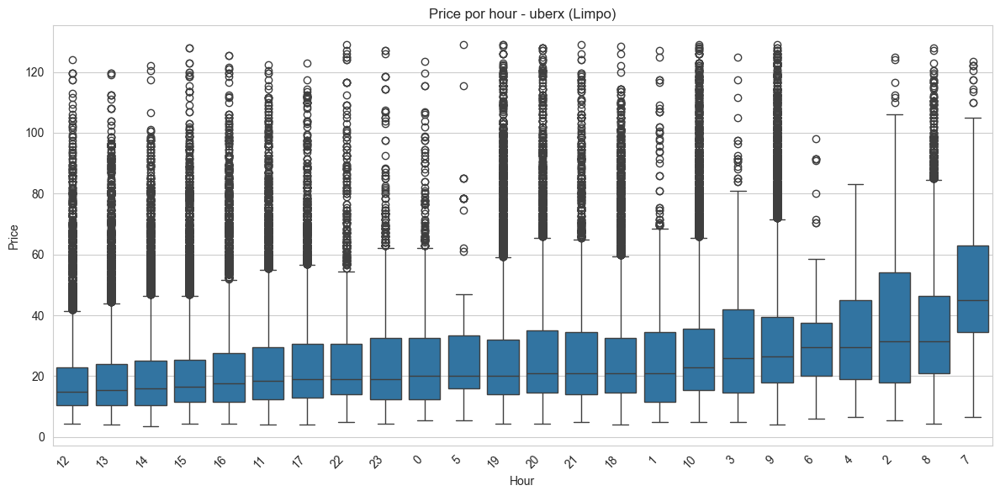


Analisando Relação: Price vs. is_holiday


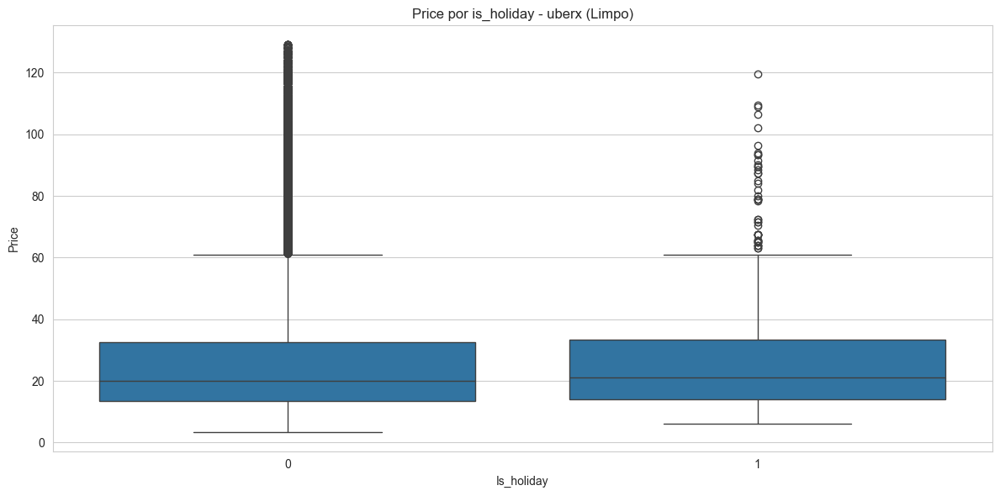


--- 4.1 Tendências Temporais (Mediana do Preço) ---


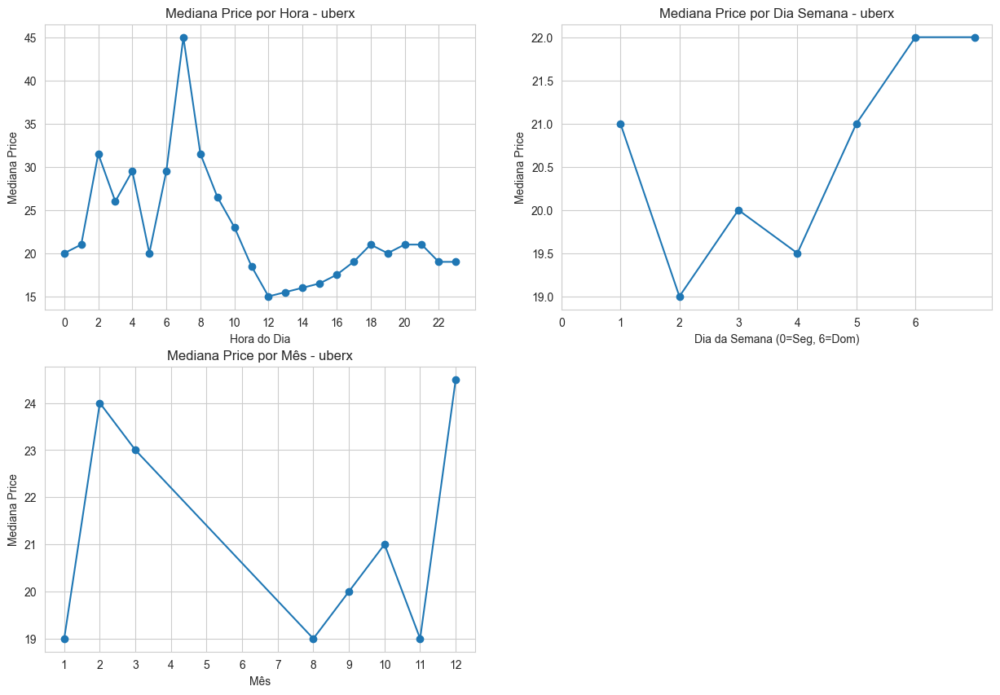

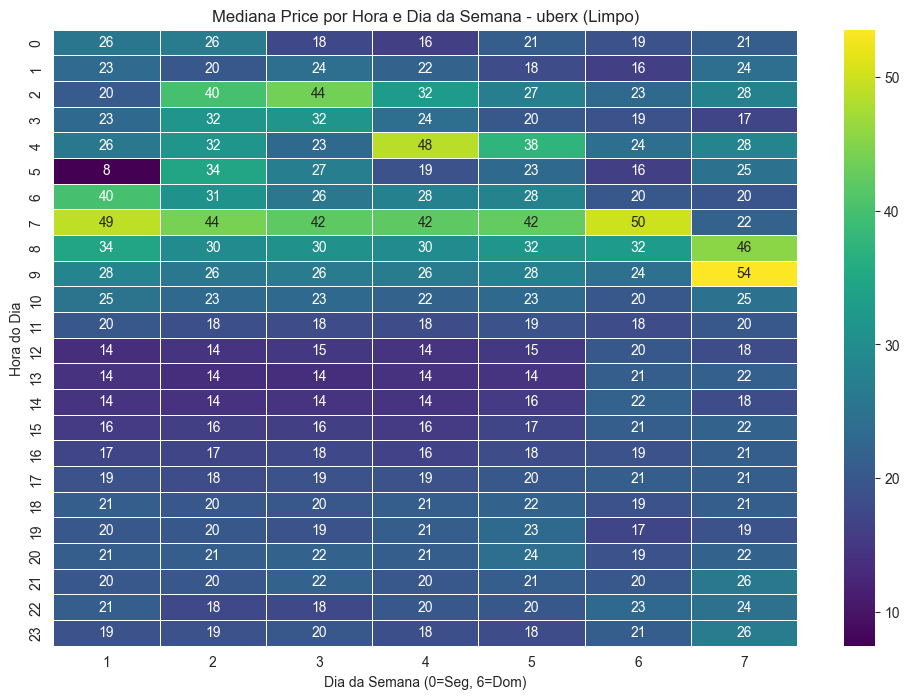

<Figure size 1200x600 with 0 Axes>


--- Fim da Análise para UBERX (Dados Limpos) ---


--- Fim da Etapa 4: Análise Exploratória Concluída para todas as tabelas ---



In [6]:
# --- ETAPA 4: Análise Exploratória de Dados (Pós-Limpeza) ---

print("\n=============================================================")
print("--- Iniciando Etapa 4: Análise Exploratória (Dados Limpos) ---")
print("=============================================================\n")

# Certifique-se de que o nome do dicionário está correto
# Mude para 'dataframes' se você modificou o dicionário original na etapa 3
dict_to_analyze = dataframes_cleaned

if not dict_to_analyze:
    print("ERRO: O dicionário com os dataframes limpos ('dataframes_cleaned' ou 'dataframes') está vazio ou não foi encontrado.")
else:
    # Iterar sobre cada subcategoria e seu respectivo DataFrame LIMPO
    for subcategory_name, df in dict_to_analyze.items():

        print(f"\n\n##########################################################")
        print(f"### Analisando Subcategoria: {subcategory_name.upper()} (Dados Limpos) ###")
        print(f"##########################################################\n")

        if df.empty:
            print("DataFrame está vazio após a limpeza. Nenhuma análise a ser feita.")
            continue

        # --- 1. Informações Gerais e Descritivas ---
        print("\n--- 1.1 Informações Gerais (Tipos, Nulos) ---")
        df.info()

        print("\n--- 1.2 Estatísticas Descritivas (Numéricas) ---")
        # Exibir mais percentis pode ser útil após a limpeza
        print(df.describe(percentiles=[.01, .25, .5, .75, .99]))

        print("\n--- 1.3 Estatísticas Descritivas (Categóricas/Object) ---")
        print(df.describe(include='object'))

        print("\n--- 1.4 Contagem de Valores Únicos ---")
        for col in df.columns:
            print(f"- {col}: {df[col].nunique()} valores únicos")

        print("\n--- 1.5 Verificação de Nulos Remanescentes ---")
        missing_values = df.isnull().sum()
        missing_percentage = (missing_values / len(df)) * 100
        missing_df = pd.DataFrame({'Count': missing_values, 'Percentage': missing_percentage})
        print(missing_df[missing_df['Count'] > 0])
        # Ação (se houver nulos): Decidir como tratar antes da modelagem final.

        # --- 2. Análise da Variável Alvo: 'price' ---
        print("\n--- 2. Análise da Variável Alvo: 'price' ---")
        plt.figure(figsize=(14, 5))

        plt.subplot(1, 2, 1)
        sns.histplot(df['price'], kde=True, bins=50)
        plt.title(f'Distribuição de Price - {subcategory_name} (Limpo)')
        plt.xlabel("Price")
        plt.ylabel("Frequency")

        plt.subplot(1, 2, 2)
        sns.boxplot(y=df['price'])
        plt.title(f'Boxplot de Price - {subcategory_name} (Limpo)')
        plt.ylabel("Price")

        plt.tight_layout()
        plt.show()

        print("\n--- 3.1 Distribuição de Distance e Duration ---")

        plt.figure(figsize=(15, 5))

        if 'distance_m' in df.columns:
            plt.subplot(1, 2, 1)
            sns.histplot(df['distance_m'], kde=True, bins=50)
            plt.title(f'Distribuição de Distance (m) - {subcategory_name} (Limpo)')
            plt.xlabel("Distance (m)")
            plt.ylabel("Frequency")

        if 'duration_s' in df.columns:
            plt.subplot(1, 2, 2)
            sns.histplot(df['duration_s'], kde=True, bins=50)
            plt.title(f'Distribuição de Duration (s) - {subcategory_name} (Limpo)')
            plt.xlabel("Duration (s)")
            plt.ylabel("Frequency")

        plt.tight_layout()
        plt.show()

        print(f"Skewness de Price (após limpeza): {df['price'].skew():.2f}")
        # Considerar transformação Log se ainda assimétrica

        # --- 3. Relação das Features Numéricas com 'price' ---
        print("\n--- 3. Relação das Features Numéricas com 'price' ---")
        numerical_features = df.select_dtypes(include=np.number).columns.tolist()

        # Calcular correlação (Pearson por padrão)
        try:
            correlation_matrix = df[numerical_features].corr(method='pearson')
            price_correlation = correlation_matrix['price'].sort_values(ascending=False)
            print("\nCorrelação de Pearson com 'price':")
            print(price_correlation)

            # Heatmap de Correlação
            plt.figure(figsize=(10, 8))
            sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f") # annot=True pode poluir
            plt.title(f'Heatmap de Correlação (Numéricas) - {subcategory_name} (Limpo)')
            plt.show()

        except Exception as e:
            print(f"Erro ao calcular/plotar correlação: {e}")


        # Scatter plots das features mais importantes
        print("\nScatter plots (distance_m, duration_s vs price):")
        plt.figure(figsize=(15, 5))

        if 'distance_m' in df.columns:
            plt.subplot(1, 2, 1)
            sns.scatterplot(x='distance_m', y='price', data=df, alpha=0.5)
            plt.title(f'Price vs. Distance (m) - {subcategory_name} (Limpo)')
            plt.xlabel("Distance (m)")
            plt.ylabel("Price")

        if 'duration_s' in df.columns:
            plt.subplot(1, 2, 2)
            sns.scatterplot(x='duration_s', y='price', data=df, alpha=0.5)
            plt.title(f'Price vs. Duration (s) - {subcategory_name} (Limpo)')
            plt.xlabel("Duration (s)")
            plt.ylabel("Price")

        plt.tight_layout()
        plt.show()

        # --- 4. Relação das Features Categóricas e Temporais com 'price' ---
        print("\n--- 4. Relação das Features Categóricas/Temporais com 'price' ---")

        # Garantir que 'datetime' e features temporais derivadas existem e estão corretas
        if 'datetime' in df.columns and not pd.api.types.is_datetime64_any_dtype(df['datetime']):
             try:
                 df['datetime'] = pd.to_datetime(df['datetime'])
             except Exception as e:
                 print(f"Aviso: Não foi possível converter 'datetime' para datetime object: {e}")

        # Extrair componentes temporais se 'datetime' for do tipo correto ou se já não existirem
        if 'datetime' in df.columns and pd.api.types.is_datetime64_any_dtype(df['datetime']):
            if 'hour' not in df.columns: df['hour'] = df['datetime'].dt.hour
            if 'weekday' not in df.columns: df['weekday'] = df['datetime'].dt.weekday # Segunda=0, Domingo=6
            if 'month' not in df.columns: df['month'] = df['datetime'].dt.month
            if 'year' not in df.columns: df['year'] = df['datetime'].dt.year
        # Se datetime falhou, tentar usar colunas existentes
        elif 'hour_min' in df.columns and 'hour' not in df.columns:
             try:
                 # Tenta extrair hora de 'HH:MM' (string ou numérico)
                 df['hour'] = df['hour_min'].astype(str).str.split(':').str[0].astype(int)
                 print("Extraiu 'hour' da coluna 'hour_min'.")
             except Exception as e:
                 print(f"Não foi possível extrair 'hour' de 'hour_min': {e}. Verifique o formato.")


        categorical_like_features = ['product_id', 'year', 'month', 'weekday', 'hour', 'is_holiday']

        for col in categorical_like_features:
            if col in df.columns:
                # Verificar se a coluna tem variação suficiente para plotar
                if df[col].nunique() > 1 and df[col].nunique() < 100: # Evitar plots de colunas constantes ou com muitas categorias únicas
                    print(f"\nAnalisando Relação: Price vs. {col}")
                    try:
                        order_by = df.groupby(col)['price'].median().sort_values().index if df[col].nunique() > 2 else None

                        plt.figure(figsize=(12, 6))
                        sns.boxplot(x=col, y='price', data=df, order=order_by)
                        # ou sns.violinplot(x=col, y='price', data=df, order=order_by)
                        plt.title(f'Price por {col} - {subcategory_name} (Limpo)')
                        plt.xlabel(col.capitalize())
                        plt.ylabel("Price")
                        if df[col].nunique() > 10: # Rotacionar labels se muitas categorias
                             plt.xticks(rotation=45, ha='right')
                        plt.tight_layout()
                        plt.show()
                    except Exception as e:
                         print(f"  Erro ao plotar boxplot para '{col}': {e}")
                elif df[col].nunique() <= 1:
                     print(f"  Coluna '{col}' tem apenas um valor único ou menos. Pulando plot.")
                else:
                     print(f"  Coluna '{col}' tem muitos valores únicos ({df[col].nunique()}). Pulando boxplot padrão.")
            else:
                print(f"  Coluna '{col}' não encontrada no DataFrame.")

        

        # Gráficos de Linha Temporais (Médias/Medianas)
        print("\n--- 4.1 Tendências Temporais (Mediana do Preço) ---")
        plt.figure(figsize=(15, 10))

        if 'hour' in df.columns and df['hour'].nunique() > 1:
            plt.subplot(2, 2, 1)
            df.groupby('hour')['price'].median().plot(kind='line', marker='o')
            plt.title(f'Mediana Price por Hora - {subcategory_name}')
            plt.xlabel('Hora do Dia')
            plt.ylabel('Mediana Price')
            plt.xticks(range(0, 24, 2))
            plt.grid(True)

        if 'weekday' in df.columns and df['weekday'].nunique() > 1:
            plt.subplot(2, 2, 2)
            median_price_weekday = df.groupby('weekday')['price'].median().sort_index()
            median_price_weekday.plot(kind='line', marker='o')
            plt.title(f'Mediana Price por Dia Semana - {subcategory_name}')
            plt.xlabel('Dia da Semana (0=Seg, 6=Dom)')
            plt.ylabel('Mediana Price')
            plt.xticks(range(0, 7))
            plt.grid(True)

        if 'month' in df.columns and df['month'].nunique() > 1:
             plt.subplot(2, 2, 3)
             median_price_month = df.groupby('month')['price'].median().sort_index()
             median_price_month.plot(kind='line', marker='o')
             plt.title(f'Mediana Price por Mês - {subcategory_name}')
             plt.xlabel('Mês')
             plt.ylabel('Mediana Price')
             plt.xticks(range(1, 13))
             plt.grid(True)

        # Heatmap Hora vs Dia da Semana (se ambas colunas existem)
        if 'hour' in df.columns and 'weekday' in df.columns and df['hour'].nunique() > 1 and df['weekday'].nunique() > 1:
             try:
                 pivot_table = df.pivot_table(values='price', index='hour', columns='weekday', aggfunc='median')
                 plt.figure(figsize=(12, 8)) # Nova figura para o heatmap
                 sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap="viridis", linewidths=.5)
                 plt.title(f'Mediana Price por Hora e Dia da Semana - {subcategory_name} (Limpo)')
                 plt.xlabel('Dia da Semana (0=Seg, 6=Dom)')
                 plt.ylabel('Hora do Dia')
                 plt.show() # Mostra o heatmap
             except Exception as e:
                 print(f"Erro ao gerar heatmap Hora vs Dia da Semana: {e}")

        # Ajusta layout dos subplots de linha temporal (se existirem)
        plt.tight_layout()
        plt.show() # Mostra a figura com os gráficos de linha


        print(f"\n--- Fim da Análise para {subcategory_name.upper()} (Dados Limpos) ---\n")


print("\n==============================================================")
print("--- Fim da Etapa 4: Análise Exploratória Concluída para todas as tabelas ---")
print("==============================================================\n")

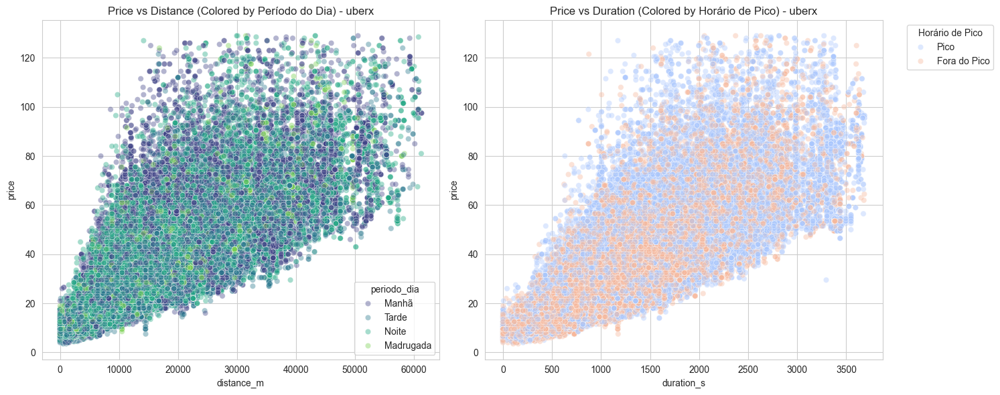

In [8]:
# Criar coluna 'hora' a partir de 'hour_min' (usando a parte inteira)
df['hora'] = df['hour_min'].astype(int)

# Definir período do dia: Madrugada (<6), Manhã (6-11), Tarde (12-17) e Noite (>=18)
df['periodo_dia'] = df['hora'].apply(lambda h: 'Madrugada' if h < 6 else ('Manhã' if h < 12 else ('Tarde' if h < 18 else 'Noite')))

# Definir se está em horário de pico: exemplo: pico se hora entre 7 e 10 ou entre 17 e 20, caso contrário Fora do Pico
df['horario_pico_calc'] = df['hora'].apply(lambda h: 'Pico' if (7 <= h <= 10 or 17 <= h <= 20) else 'Fora do Pico')

# Plots com os novos hue
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(data=df, x='distance_m', y='price', hue='periodo_dia', palette='viridis', alpha=0.4)
plt.title(f'Price vs Distance (Colored by Período do Dia) - {subcategory_name}')

plt.subplot(1, 2, 2)
sns.scatterplot(data=df, x='duration_s', y='price', hue='horario_pico_calc', palette='coolwarm', alpha=0.4)
plt.title(f'Price vs Duration (Colored by Horário de Pico) - {subcategory_name}')
plt.legend(title='Horário de Pico', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [15]:
# Bloco de Modelagem 1: Imports e Funções Auxiliares (REVISADO)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
# Poderíamos adicionar XGBoost e LightGBM se quiser comparar os 3 melhores
# import xgboost as xgb
# import lightgbm as lgb

pd.set_option('display.float_format', lambda x: '%.3f' % x)
TARGET = 'price'

# Colunas a serem dropadas ANTES de formar X.
# Se 'hora', 'periodo_dia', 'horario_pico_calc' ainda aparecem nos dados de 'uberx'
# é porque não estavam nos CSVs das outras categorias, então a limpeza global
# de 'dataframes_cleaned' não as removeu de 'uberx'.
# Vamos tratar isso no Bloco 2 de forma mais específica por DataFrame.
INITIAL_COLS_TO_DROP_BASE = [
    'ride_id', 'product_id', 'subcategory',  # IDs e categoria original (usaremos subcategory_feature no modelão)
    'datetime',                              # String de data/hora original
    'hour_min',                              # Redundante com features cíclicas de hora
    'day',                                   # Dia do mês, geralmente menos preditivo que weekday_sin/cos e month
    'weekday',                               # Coluna numérica de dia da semana (0-6), redundante com weekday_sin/cos
    'hour',                                  # Coluna numérica de hora (0-23), redundante com hour_sin/cos
    'periodo_dia',                           # Se você decidiu que é redundante/problemática
    'horario_pico_calc'                      # Se você decidiu que é redundante/problemática
]

# Função para obter nomes das features de forma mais robusta
def get_transformed_feature_names(column_transformer, original_feature_names):
    try:
        return column_transformer.get_feature_names_out()
    except Exception:
        output_features = []
        processed_in_transformers = [] # Para rastrear colunas já processadas
        for name, transformer, features_in_transformer_list in column_transformer.transformers_:
            if name == 'remainder' and transformer == 'passthrough':
                # Identificar colunas do remainder
                # Primeiro, coletar todas as colunas que foram explicitamente nomeadas nos outros transformadores
                temp_processed_cols = []
                for n_other, t_other, f_list_other in column_transformer.transformers_:
                    if n_other != 'remainder':
                        temp_processed_cols.extend(f_list_other)
                
                remainder_cols = [col for col in original_feature_names if col not in temp_processed_cols]
                output_features.extend(remainder_cols)
                processed_in_transformers.extend(remainder_cols) # Adicionar ao rastreamento
            elif transformer != 'drop':
                if hasattr(transformer, 'get_feature_names_out') and callable(transformer.get_feature_names_out):
                    transformed_names = transformer.get_feature_names_out(features_in_transformer_list)
                    output_features.extend(transformed_names)
                else:
                    output_features.extend(features_in_transformer_list)
                processed_in_transformers.extend(features_in_transformer_list) # Adicionar ao rastreamento
        return output_features


def train_and_evaluate_rf(X_train, y_train, X_test, y_test, numerical_features_to_scale, categorical_features_to_encode, model_name_prefix=""):
    numeric_transformer = StandardScaler()
    categorical_transformer = OneHotEncoder(handle_unknown='ignore', drop='first', sparse_output=False) 
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numerical_features_to_scale),
            ('cat', categorical_transformer, categorical_features_to_encode)
        ],
        remainder='passthrough',
    )
    rf_model = RandomForestRegressor(
        n_estimators=150, random_state=42, n_jobs=-1, max_depth=25,
        min_samples_split=10, min_samples_leaf=5, oob_score=True
    )
    model_full_name = f"{model_name_prefix}Random_Forest"
    print(f"  Treinando {model_full_name}...")
    start_time = time.time()
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', rf_model)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    end_time = time.time()
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    training_time = end_time - start_time
    oob = pipeline.named_steps['regressor'].oob_score_ if hasattr(pipeline.named_steps['regressor'], 'oob_score_') else np.nan
    results_summary = {model_full_name: {'R2': r2, 'MAE': mae, 'RMSE': rmse, 'Time (s)': training_time, 'OOB_R2': oob}}
    # trained_pipeline = {model_full_name: pipeline} # A função original retornava isso, vamos manter
    print(f"  {model_full_name} - R2: {r2:.4f}, MAE: {mae:.2f}, RMSE: {rmse:.2f}, OOB_R2: {oob:.4f}, Time: {training_time:.2f}s")
    results_df = pd.DataFrame(results_summary).T
    return results_df, pipeline # Retornar o pipeline diretamente, não um dict

print("Bloco de Modelagem 1 (Imports e Funções Auxiliares - REVISADO) carregado.")

Bloco de Modelagem 1 (Imports e Funções Auxiliares - REVISADO) carregado.


In [16]:
# Bloco de Modelagem 2: Treinamento de Modelos Individuais (CORRIGIDO)

# Inicializar dicionários ANTES do loop (geralmente no Bloco 1 ou aqui se este for o primeiro bloco de treino)
saved_X_train_columns = {}
all_individual_results = {}
all_individual_pipelines = {}
# all_feature_importances_individual = {} # Comentado pois a função get_transformed_feature_names pode ser instável

if 'dataframes_cleaned' not in locals() or not dataframes_cleaned:
    print("ERRO: 'dataframes_cleaned' não encontrado. Execute o carregamento/limpeza de dados.")
else:
    for subcategory_name, df_original in dataframes_cleaned.items():
        print(f"\n\n{'='*60}")
        print(f"--- Preparando e Treinando Modelos para: {subcategory_name.upper()} ---")
        print(f"{'='*60}")

        if df_original.empty or len(df_original) < 100: # Min. de amostras para treinar
            print(f"  DataFrame para {subcategory_name} vazio ou pequeno demais ({len(df_original)}). Pulando.")
            continue

        df_loop = df_original.copy()

        # --- 2.1 Formação de X (Simplificado e Corrigido) ---
        if TARGET not in df_loop.columns:
            print(f"  Coluna target '{TARGET}' não encontrada em {subcategory_name}. Pulando.")
            continue
        
        # Definir features para X: todas as colunas exceto TARGET e aquelas em INITIAL_COLS_TO_DROP_BASE
        # Garanta que INITIAL_COLS_TO_DROP_BASE no Bloco 1 está correta e inclui
        # 'hour', 'periodo_dia', 'horario_pico_calc' SE elas não devem ser usadas.
        features_for_X = [
            col for col in df_loop.columns 
            if col != TARGET and col not in INITIAL_COLS_TO_DROP_BASE
        ]
        
        X = df_loop[features_for_X].copy()
        y = df_loop[TARGET].copy()

        if X.empty:
            print(f"  DataFrame X ficou vazio para {subcategory_name} após seleção de features. Pulando.")
            continue

        # --- 2.2 Identificar Tipos de Colunas para o ColumnTransformer ---
        numerical_features_to_scale = []
        categorical_features_to_encode = []
        
        # Features que já são numéricas e prontas (não precisam de scale nem OHE)
        intended_numerical_passthrough = [
            col for col in X.columns if 
            '_sin' in col or '_cos' in col or col == 'is_holiday' or col == 'is_peak_hour'
        ]
        
        # Features categóricas que precisam de One-Hot Encoding
        potential_cats_to_encode = ['year', 'month'] # Adicione outras se necessário e se elas existirem em X
        for cat_col in potential_cats_to_encode:
            if cat_col in X.columns and cat_col not in intended_numerical_passthrough:
                # Verificar se é realmente categórica e não constante
                if X[cat_col].nunique() > 1 and X[cat_col].nunique() < 30: 
                    categorical_features_to_encode.append(cat_col)

        # Features numéricas que precisam de Scaling
        # São todas as colunas numéricas em X que não são passthrough nem OHE
        for num_col in X.select_dtypes(include=np.number).columns:
            if num_col not in intended_numerical_passthrough and num_col not in categorical_features_to_encode:
                numerical_features_to_scale.append(num_col)

        # Verificação final: Colunas que efetivamente irão para 'passthrough' no ColumnTransformer
        actual_passthrough_cols = [
            col for col in X.columns 
            if col not in numerical_features_to_scale and col not in categorical_features_to_encode
        ]
        # Verificar se alguma coluna textual vazou
        text_cols_leaked = [col for col in actual_passthrough_cols if X[col].dtype == 'object']

        print(f"\n  Para {subcategory_name.upper()} (após seleção de features para X):")
        print(f"    Features em X ({len(X.columns)}): {list(X.columns)}")
        print(f"    Numéricas para Scaling: {numerical_features_to_scale}")
        print(f"    Categóricas para OHE: {categorical_features_to_encode}")
        print(f"    Colunas efetivamente Passthrough: {actual_passthrough_cols}")

        if text_cols_leaked:
            print(f"    !!! ALERTA em {subcategory_name.upper()} !!! Colunas textuais em passthrough: {text_cols_leaked}")
            print("      Verifique INITIAL_COLS_TO_DROP_BASE e a lógica de seleção de features. Pulando.")
            continue

        # --- 2.3 Dividir Dados ---
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        
        if X_train.empty or X_test.empty:
            print(f"  Conjunto de treino/teste vazio para {subcategory_name}. Pulando.")
            continue
        
        # Salvar as colunas de X_train para este modelo
        model_pipeline_key = f"{subcategory_name}_Random_Forest"
        saved_X_train_columns[model_pipeline_key] = list(X_train.columns) # Salva ANTES do ColumnTransformer
        print(f"    DEBUG: Colunas de X_train para '{model_pipeline_key}' salvas ({len(X_train.columns)} colunas).")
        
        print(f"  Dados divididos para {subcategory_name}: Treino={X_train.shape}, Teste={X_test.shape}")

        # --- 2.4 Treinar e Avaliar (Apenas Random Forest) ---
        results_df, trained_pipeline = train_and_evaluate_rf( # A função agora retorna o pipeline diretamente
            X_train, y_train, X_test, y_test,
            numerical_features_to_scale,
            categorical_features_to_encode,
            model_name_prefix=f"{subcategory_name}_"
        )
        
        if not results_df.empty:
            model_full_name = results_df.index[0]
            all_individual_results[model_full_name] = results_df # Usar nome completo do modelo como chave
            all_individual_pipelines[model_full_name] = trained_pipeline
        
        # Feature importance (comentada por enquanto devido à instabilidade de get_transformed_feature_names)
        # Se quiser tentar, descomente e certifique-se que a função get_transformed_feature_names está robusta.
        # if hasattr(trained_pipeline.named_steps['regressor'], 'feature_importances_'):
        #     # ... (código de feature importance) ...

    print("\n\n--- Treinamento de Modelos Individuais (Foco em RF) CONCLUÍDO ---")



--- Preparando e Treinando Modelos para: 99COMFORT ---

  Para 99COMFORT (após seleção de features para X):
    Features em X (10): ['distance_m', 'duration_s', 'year', 'month', 'is_holiday', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'is_peak_hour']
    Numéricas para Scaling: ['distance_m', 'duration_s']
    Categóricas para OHE: ['year', 'month']
    Colunas efetivamente Passthrough: ['is_holiday', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'is_peak_hour']
    DEBUG: Colunas de X_train para '99comfort_Random_Forest' salvas (10 colunas).
  Dados divididos para 99comfort: Treino=(6263, 10), Teste=(1566, 10)
  Treinando 99comfort_Random_Forest...
  99comfort_Random_Forest - R2: 0.7837, MAE: 7.76, RMSE: 14.50, OOB_R2: 0.7933, Time: 0.30s


--- Preparando e Treinando Modelos para: 99POP ---

  Para 99POP (após seleção de features para X):
    Features em X (10): ['distance_m', 'duration_s', 'year', 'month', 'is_holiday', 'hour_sin', 'hour_cos', 'weekday_sin', 'wee

In [17]:
# Bloco de Modelagem 3: Treinamento do "Modelão" (Foco em RF - CORRIGIDO)

# saved_X_train_columns, all_individual_results, all_individual_pipelines já devem ter sido inicializados

df_big_model_list = []
if 'dataframes_cleaned' not in locals() or not dataframes_cleaned:
    print("ERRO: 'dataframes_cleaned' não encontrado para o Modelão.")
else:
    for subcat_name_iter_big, df_subcat_iter_big in dataframes_cleaned.items(): # Nomes diferentes
        if not df_subcat_iter_big.empty:
            df_copy_big = df_subcat_iter_big.copy()
            # Adicionar 'subcategory_feature' ANTES de dropar 'subcategory' original
            df_copy_big['subcategory_feature'] = subcat_name_iter_big 
            df_big_model_list.append(df_copy_big)

if not df_big_model_list:
    print("Nenhum DataFrame para concatenar para o 'Modelão'.")
else:
    df_big_model = pd.concat(df_big_model_list, ignore_index=True)
    print(f"\n\n{'='*60}")
    print(f"--- Preparando e Treinando 'MODELÃO' (Foco em RF) ---")
    print(f"  Shape do DataFrame concatenado: {df_big_model.shape}")
    print(f"  Colunas disponíveis no df_big_model inicial: {list(df_big_model.columns)}")
    print(f"{'='*60}")

    # --- 3.1 Formação de X_big ---
    if TARGET not in df_big_model.columns:
        print(f"  Coluna target '{TARGET}' não encontrada no Modelão. Saindo.")
    else:
        # INITIAL_COLS_TO_DROP_BASE já remove 'hour', 'periodo_dia', 'horario_pico_calc'
        # se elas foram configuradas para serem dropadas globalmente.
        # A feature 'subcategory_feature' foi adicionada e não está em INITIAL_COLS_TO_DROP_BASE.
        features_for_X_big = [
            col for col in df_big_model.columns 
            if col != TARGET and col not in INITIAL_COLS_TO_DROP_BASE
        ]
        
        X_big = df_big_model[features_for_X_big].copy()
        y_big = df_big_model[TARGET].copy()

        if X_big.empty:
            print("  DataFrame X_big ficou vazio. Saindo.")
        else:
            # --- 3.2 Identificar Tipos de Colunas para o Modelão ---
            numerical_features_to_scale_big = []
            categorical_features_to_encode_big = []

            intended_numerical_passthrough_big = [
                col for col in X_big.columns if 
                '_sin' in col or '_cos' in col or col == 'is_holiday' or col == 'is_peak_hour'
            ]
            
            # 'subcategory_feature' é crucial e DEVE ser OHE.
            # Se 'periodo_dia' ou 'horario_pico_calc' ainda existem em X_big e são textuais,
            # e você NÃO as colocou em INITIAL_COLS_TO_DROP_BASE, adicione-as aqui para OHE.
            potential_cats_to_encode_big = ['year', 'month', 'subcategory_feature']
            # Exemplo: if 'periodo_dia' in X_big.columns: potential_cats_to_encode_big.append('periodo_dia')

            for cat_col_big in potential_cats_to_encode_big:
                if cat_col_big in X_big.columns and cat_col_big not in intended_numerical_passthrough_big:
                    if X_big[cat_col_big].nunique() > 1: # Permitir alta cardinalidade para subcategory_feature
                         if cat_col_big == 'subcategory_feature' or X_big[cat_col_big].nunique() < 50 : # Limite para outras
                            categorical_features_to_encode_big.append(cat_col_big)
            
            for num_col_big in X_big.select_dtypes(include=np.number).columns:
                if num_col_big not in intended_numerical_passthrough_big and num_col_big not in categorical_features_to_encode_big:
                    numerical_features_to_scale_big.append(num_col_big)

            actual_passthrough_cols_big = [
                col for col in X_big.columns 
                if col not in numerical_features_to_scale_big and col not in categorical_features_to_encode_big
            ]
            text_cols_leaked_big = [col for col in actual_passthrough_cols_big if X_big[col].dtype == 'object']

            print(f"\n  Para MODELÃO (após seleção de features para X_big):")
            print(f"    Features em X_big ({len(X_big.columns)}): {list(X_big.columns)}")
            print(f"    Numéricas para Scaling: {numerical_features_to_scale_big}")
            print(f"    Categóricas para OHE: {categorical_features_to_encode_big}")
            print(f"    Colunas efetivamente Passthrough: {actual_passthrough_cols_big}")

            if text_cols_leaked_big:
                print(f"    !!! ALERTA no MODELÃO !!! Colunas textuais em passthrough: {text_cols_leaked_big}. Pulando.")
            else:
                # --- 3.3 Dividir Dados ---
                X_train_big, X_test_big, y_train_big, y_test_big = train_test_split(X_big, y_big, test_size=0.2, random_state=42)
                
                if X_train_big.empty or X_test_big.empty:
                    print("  Conjunto de treino/teste do Modelão vazio. Pulando.")
                else:
                    modelao_pipeline_key = "MODELAO_Random_Forest"
                    saved_X_train_columns[modelao_pipeline_key] = list(X_train_big.columns)
                    print(f"    DEBUG: Colunas de X_train_big para '{modelao_pipeline_key}' salvas ({len(X_train_big.columns)} colunas).")
                    print(f"  Dados divididos para MODELÃO: Treino={X_train_big.shape}, Teste={X_test_big.shape}")

                    # --- 3.4 Treinar e Avaliar Modelão (RF) ---
                    results_df_big, trained_pipeline_big = train_and_evaluate_rf(
                        X_train_big, y_train_big, X_test_big, y_test_big,
                        numerical_features_to_scale_big,
                        categorical_features_to_encode_big,
                        model_name_prefix="MODELAO_"
                    )
                    
                    if not results_df_big.empty:
                        model_full_name_big = results_df_big.index[0]
                        all_individual_results[model_full_name_big] = results_df_big # Usar nome completo
                        all_individual_pipelines[model_full_name_big] = trained_pipeline_big
                    
                    # Feature importance do Modelão (comentada por enquanto)
                    # if hasattr(trained_pipeline_big.named_steps['regressor'], 'feature_importances_'):
                    #     # ... (código de feature importance) ...
    print("\n\n--- Treinamento do 'MODELÃO' (Foco em RF) CONCLUÍDO ---")



--- Preparando e Treinando 'MODELÃO' (Foco em RF) ---
  Shape do DataFrame concatenado: (1499362, 23)
  Colunas disponíveis no df_big_model inicial: ['ride_id', 'product_id', 'subcategory', 'price', 'datetime', 'distance_m', 'duration_s', 'year', 'month', 'day', 'weekday', 'hour_min', 'is_holiday', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'hour', 'is_peak_hour', 'subcategory_feature', 'hora', 'periodo_dia', 'horario_pico_calc']

  Para MODELÃO (após seleção de features para X_big):
    Features em X_big (12): ['distance_m', 'duration_s', 'year', 'month', 'is_holiday', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'is_peak_hour', 'subcategory_feature', 'hora']
    Numéricas para Scaling: ['distance_m', 'duration_s', 'hora']
    Categóricas para OHE: ['year', 'month', 'subcategory_feature']
    Colunas efetivamente Passthrough: ['is_holiday', 'hour_sin', 'hour_cos', 'weekday_sin', 'weekday_cos', 'is_peak_hour']
    DEBUG: Colunas de X_train_big para 'MODELAO_Random



{'='*60}
--- Bloco 4: Comparativo Geral de Métricas (Random Forest) ---

--- Sumário Comparativo dos Modelos Random Forest (Ordenado por RMSE) ---
                              R2   MAE   RMSE  OOB_R2  Time (s)
uberpromo_Random_Forest    0.870 2.977  5.146   0.868     3.188
uberblack_Random_Forest    0.964 3.615  6.458   0.964     4.319
taxiregular_Random_Forest  0.971 3.500  6.512   0.971     8.071
uberx_Random_Forest        0.862 3.850  6.529   0.861     8.406
taxiturbo_Random_Forest    0.960 4.060  7.146   0.960     7.450
uberblackbag_Random_Forest 0.963 4.644  8.127   0.963     1.132
MODELAO_Random_Forest      0.926 4.753  8.597   0.925   159.376
ubercomfort_Random_Forest  0.866 6.041 10.775   0.865     7.576
99poupa_Random_Forest      0.744 5.895 10.800   0.747     3.371
99pop_Random_Forest        0.793 5.792 10.802   0.797     9.025
uberbag_Random_Forest      0.858 7.025 11.873   0.850     2.233
99comfort_Random_Forest    0.784 7.758 14.496   0.793     0.303


C:\Users\lucca\AppData\Local\Temp\ipykernel_5556\2737224121.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='RMSE', y=overall_summary_rf_df.index,


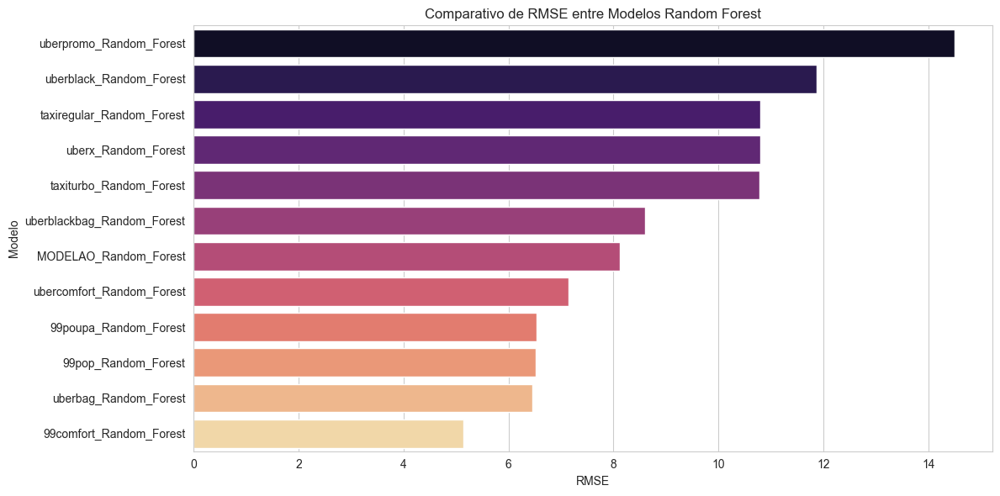

C:\Users\lucca\AppData\Local\Temp\ipykernel_5556\2737224121.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='R2', y=overall_summary_rf_df.index,


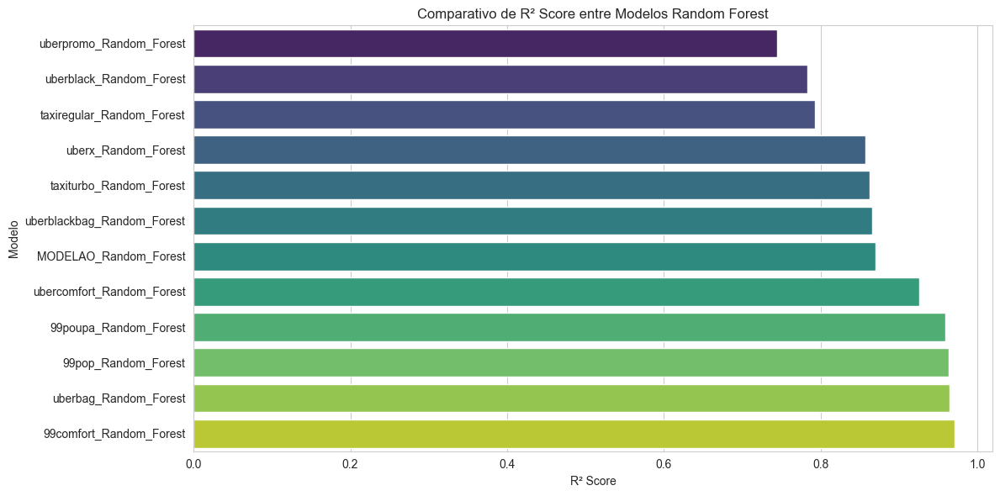

In [18]:
# Bloco de Modelagem 4: Comparar Métricas de Todos os Modelos (VERIFICADO)

print("\n\n{'='*60}")
print("--- Bloco 4: Comparativo Geral de Métricas (Random Forest) ---")
print(f"{'='*60}")

summary_metrics_for_comparison = {} 

if 'all_individual_results' in globals() and all_individual_results:
    for model_full_name_key, results_data_df_loop in all_individual_results.items():
        # model_full_name_key é algo como "uberx_Random_Forest" ou "MODELAO_Random_Forest"
        # results_data_df_loop é o DataFrame de resultados para esse modelo (deve ter 1 linha)
        
        if not results_data_df_loop.empty:
            metrics_row_loop = results_data_df_loop.iloc[0] 
            summary_metrics_for_comparison[model_full_name_key] = { 
                'R2': metrics_row_loop['R2'],
                'MAE': metrics_row_loop['MAE'],
                'RMSE': metrics_row_loop['RMSE'],
                'OOB_R2': metrics_row_loop.get('OOB_R2', np.nan), 
                'Time (s)': metrics_row_loop['Time (s)']
            }
        else:
            print(f"  DataFrame de resultados vazio para o modelo: {model_full_name_key}")
else:
    print("  Dicionário 'all_individual_results' não encontrado ou vazio.")


if not summary_metrics_for_comparison:
    print("Nenhuma métrica encontrada para comparar. Verifique os blocos de treinamento.")
else:
    overall_summary_rf_df = pd.DataFrame(summary_metrics_for_comparison).T.sort_values(by='RMSE', ascending=True)
    
    print("\n--- Sumário Comparativo dos Modelos Random Forest (Ordenado por RMSE) ---")
    print(overall_summary_rf_df)

    # Plot comparativo de RMSE
    if not overall_summary_rf_df.empty:
        plt.figure(figsize=(12, max(6, len(overall_summary_rf_df) * 0.5)))
        sns.barplot(x='RMSE', y=overall_summary_rf_df.index, 
                    data=overall_summary_rf_df.sort_values(by='RMSE', ascending=False), 
                    palette="magma") 
        plt.xlabel("RMSE")
        plt.ylabel("Modelo")
        plt.title("Comparativo de RMSE entre Modelos Random Forest")
        plt.tight_layout()
        plt.show()
        
        plt.figure(figsize=(12, max(6, len(overall_summary_rf_df) * 0.5)))
        sns.barplot(x='R2', y=overall_summary_rf_df.index, 
                    data=overall_summary_rf_df.sort_values(by='R2', ascending=True), 
                    palette="viridis")
        plt.xlabel("R² Score")
        plt.ylabel("Modelo")
        plt.title("Comparativo de R² Score entre Modelos Random Forest")
        plt.tight_layout()
        plt.show()

# ... (sua discussão de métricas) ...
print(f"{'='*60}")

In [21]:
# Bloco 5: Interface de Previsão Interativa (Focada em Funcionar)

import pandas as pd
import numpy as np
import datetime
import requests # Para BrasilAPI

print("\n--- Bloco 5: Interface de Previsão Interativa ---")

# --- Definição das Funções Auxiliares (NECESSÁRIAS PARA ESTE BLOCO) ---
def get_holiday_info(target_year): # Simplicada para o exemplo
    """Verifica se a data atual é feriado nacional (simplificado)."""
    today = datetime.date.today()
    if target_year != today.year: return 0
    try:
        response = requests.get(f"https://brasilapi.com.br/api/feriados/v1/{target_year}", timeout=2)
        response.raise_for_status()
        feriados = response.json()
        return 1 if any(f.get('date') == today.strftime('%Y-%m-%d') for f in feriados) else 0
    except Exception:
        # print("  Aviso: Falha ao checar feriados. Assumindo não feriado.")
        return 0

def prepare_input_for_model(
    distance_m_user, duration_s_user,
    expected_column_names, # Lista de colunas que o X_train original tinha
    target_subcategory_for_big_model=None # Ex: 'uberx', para a feature 'subcategory_feature'
):
    """
    Cria um DataFrame de uma linha com TODAS as features que o modelo específico espera,
    derivando-as dos inputs do usuário e da data/hora atual.
    """
    now = datetime.datetime.now()
    current_year = now.year
    current_month = now.month
    current_weekday_num = now.weekday() # Segunda=0 .. Domingo=6
    current_hour_of_day = now.hour
    current_minute = now.minute

    # 1. Gerar todas as features possíveis que podem ser derivadas
    generated_data = {
        'distance_m': distance_m_user,
        'duration_s': duration_s_user,
        'year': current_year,
        'month': current_month,
        'is_holiday': get_holiday_info(current_year),
        'hour_sin': np.sin(2 * np.pi * (current_hour_of_day + current_minute / 60) / 24),
        'hour_cos': np.cos(2 * np.pi * (current_hour_of_day + current_minute / 60) / 24),
        'weekday_sin': np.sin(2 * np.pi * current_weekday_num / 7),
        'weekday_cos': np.cos(2 * np.pi * current_weekday_num / 7),
        'is_peak_hour': 1 if (5 <= current_hour_of_day <= 8) or (16 <= current_hour_of_day <= 19) else 0,
    }
    # Adicionar 'subcategory_feature' se for para o modelão
    if target_subcategory_for_big_model:
        generated_data['subcategory_feature'] = target_subcategory_for_big_model
    
    # Adicionar colunas que podem ter sido usadas no treino mas não são geradas automaticamente
    # (ex: 'hour', 'periodo_dia', etc., se elas *realmente* estão em expected_column_names)
    # No nosso caso ideal, expected_column_names SÓ DEVE TER as features geradas acima.
    # Se expected_column_names contiver 'hour', 'periodo_dia', etc., isso é um problema
    # que deveria ter sido corrigido no salvamento de saved_X_train_columns.
    # Mas para tentar fazer funcionar, se elas estiverem lá, vamos preencher com um valor default.

    # Se 'hour' (0-23) está na lista de colunas esperadas:
    if 'hour' in expected_column_names and 'hour' not in generated_data:
        generated_data['hour'] = current_hour_of_day 
        # print(f"DEBUG: 'hour' adicionada ao input com valor {current_hour_of_day}")

    # Se 'periodo_dia' ou 'horario_pico_calc' estão nas colunas esperadas (problemático se eram textuais)
    # O OneHotEncoder precisa de strings, não NaN, se foi treinado com strings.
    # Esta é uma tentativa de "remendo". O ideal é que essas colunas NÃO estejam em expected_column_names
    # se elas foram dropadas ou substituídas por features engenheiradas.
    if 'periodo_dia' in expected_column_names and 'periodo_dia' not in generated_data:
        # Lógica para derivar periodo_dia da hora (Exemplo, pode precisar de ajuste)
        if 5 <= current_hour_of_day < 12: generated_data['periodo_dia'] = 'Manha'
        elif 12 <= current_hour_of_day < 18: generated_data['periodo_dia'] = 'Tarde'
        elif 18 <= current_hour_of_day < 22: generated_data['periodo_dia'] = 'Noite'
        else: generated_data['periodo_dia'] = 'Madrugada'
        # print(f"DEBUG: 'periodo_dia' adicionada ao input com valor {generated_data['periodo_dia']}")
        
    if 'horario_pico_calc' in expected_column_names and 'horario_pico_calc' not in generated_data:
        generated_data['horario_pico_calc'] = 'Pico' if generated_data['is_peak_hour'] == 1 else 'ForaPico'
        # print(f"DEBUG: 'horario_pico_calc' adicionada ao input com valor {generated_data['horario_pico_calc']}")


    # Criar o DataFrame final usando EXATAMENTE as colunas esperadas, na ordem correta
    input_df_data = {}
    missing_cols_debug = []
    for col_name in expected_column_names:
        if col_name in generated_data:
            input_df_data[col_name] = generated_data[col_name]
        else:
            # Coluna esperada pelo modelo, mas não gerada pela lógica acima.
            # Isso indica uma forte inconsistência. Preencher com NaN pode levar a erros.
            input_df_data[col_name] = np.nan 
            missing_cols_debug.append(col_name)
    
    if missing_cols_debug:
        print(f"    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: {missing_cols_debug}. Usando NaN.")

    return pd.DataFrame([input_df_data], columns=expected_column_names)

# --- Fim das Funções Auxiliares ---


def run_prediction_loop():
    print("DEBUG: Entrando em run_prediction_loop()")
    if 'all_individual_pipelines' not in globals() or not all_individual_pipelines or \
       'saved_X_train_columns' not in globals() or not saved_X_train_columns or \
       'dataframes_cleaned' not in globals() or not dataframes_cleaned:
        print("ERRO FATAL: Variáveis de treinamento não encontradas. Execute os blocos anteriores.")
        return

    print("DEBUG: Variáveis de treinamento OK. Iniciando loop de input.")
    while True:
        print("\n" + "="*70)
        print("### Nova Previsão de Preço de Corrida ###".center(70))
        print("="*70)
        try:
            dist_str = input("  Distância em METROS (ou Enter para sair): ").strip()
            if not dist_str: break
            dist_val = float(dist_str)
            dur_str = input("  Duração em SEGUNDOS (ou Enter para sair): ").strip()
            if not dur_str: break
            dur_val = float(dur_str)
            if dist_val <= 0 or dur_val <= 0:
                print("  >>> Distância e duração devem ser positivas. <<<"); continue
        except ValueError: print("  >>> Entrada inválida. Digite números. <<<"); continue
        except Exception as e: print(f"  >>> Erro no input: {e} <<<"); continue

        print(f"\n{'-'*15} PREVISÃO PARA DISTÂNCIA: {dist_val}m, DURAÇÃO: {dur_val}s {'-'*15}")
        
        prediction_results = []
        available_subcats = list(dataframes_cleaned.keys())
        
        modelao_pipeline = all_individual_pipelines.get("MODELAO_Random_Forest")
        modelao_expected_features = saved_X_train_columns.get("MODELAO_Random_Forest")

        for sub_name in available_subcats:
            pred_i_str, pred_m_str = "N/A (modelo não disp.)", "N/A (modelo não disp.)"
            
            # Modelo Individual
            ind_model_key = f"{sub_name}_Random_Forest"
            ind_pipeline = all_individual_pipelines.get(ind_model_key)
            ind_expected_features = saved_X_train_columns.get(ind_model_key)
            if ind_pipeline and ind_expected_features:
                input_df_i = prepare_input_for_model(dist_val, dur_val, ind_expected_features)
                try:
                    pred_i_val = ind_pipeline.predict(input_df_i)[0]
                    pred_i_str = f"R$ {pred_i_val:.2f}"
                except Exception as e_i: pred_i_str = f"Erro ({type(e_i).__name__})"
            
            # Modelão
            if modelao_pipeline and modelao_expected_features:
                input_df_m = prepare_input_for_model(dist_val, dur_val, modelao_expected_features, target_subcategory_for_big_model=sub_name)
                try:
                    pred_m_val = modelao_pipeline.predict(input_df_m)[0]
                    pred_m_str = f"R$ {pred_m_val:.2f}"
                except Exception as e_m: pred_m_str = f"Erro ({type(e_m).__name__})"
            
            prediction_results.append((sub_name.upper(), pred_i_str, pred_m_str))

        if prediction_results:
            print("\n" + "="*70)
            print(f"{'CATEGORIA':<25} | {'PREVISÃO INDIVIDUAL RF':<25} | {'PREVISÃO MODELÃO RF':<25}")
            print("-"*70)
            for r_c, r_i, r_m in prediction_results: print(f"{r_c:<25} | {r_i:<25} | {r_m:<25}")
            print("="*70)
        
        if input("\n  Nova previsão? (s/N): ").strip().lower() != 's': break
    print("\n--- Fim da Sessão de Previsão Interativa ---")

# --- Chamada da Interface ---
run_prediction_loop()
print("\n--- Fim do Bloco de Previsão ---")


--- Bloco 5: Interface de Previsão Interativa ---
DEBUG: Entrando em run_prediction_loop()
DEBUG: Variáveis de treinamento OK. Iniciando loop de input.

              ### Nova Previsão de Preço de Corrida ###               

--------------- PREVISÃO PARA DISTÂNCIA: 5700.0m, DURAÇÃO: 900.0s ---------------
    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.


c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zer

    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.


c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.
    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.
    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.


c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zer

    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.


c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zer

    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.
    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.


c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.


c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
c:\Users\lucca\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0, 1] during transform. These unknown categories will be encoded as all 

    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.
    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.
    ALERTA PREVISÃO: Colunas esperadas pelo modelo mas não geradas/previstas: ['hora']. Usando NaN.

CATEGORIA                 | PREVISÃO INDIVIDUAL RF    | PREVISÃO MODELÃO RF      
----------------------------------------------------------------------
99COMFORT                 | R$ 38.22                  | R$ 28.99                 
99POP                     | R$ 32.16                  | R$ 28.84                 
99POUPA                   | R$ 25.32                  | R$ 28.85                 
TAXIREGULAR               | R$ 31.84                  | R$ 34.77                 
TAXITURBO                 | R$ 35.64                  | R$ 38.53                 
UBERBAG                   | R$ 49.75                  | R$ 44.95                 
UBERBLACKBAG              | R$ 46.32                  

In [22]:
# Bloco 6: Exportar Modelos Selecionados

import joblib # Usar joblib para salvar modelos sklearn
import os

print("\n--- Bloco 6: Exportando Modelos Selecionados ---")

# Lista das subcategorias cujos modelos queremos exportar
# Certifique-se que os nomes aqui correspondem EXATAMENTE às chaves
# usadas em 'dataframes_cleaned' e, consequentemente, nos nomes dos modelos.
subcategories_to_export = [
    "uberx",
    "ubercomfort",
    "uberblack",
    "99pop",
    "99comfort"
    # Adicione ou remova conforme necessário
]

# Diretório onde os modelos serão salvos
export_dir = "modelos_exportados" 
if not os.path.exists(export_dir):
    os.makedirs(export_dir)
    print(f"  Diretório '{export_dir}' criado.")

# Verificar se os pipelines e as colunas de features estão disponíveis
if 'all_individual_pipelines' not in globals() or not all_individual_pipelines:
    print("ERRO: Dicionário 'all_individual_pipelines' não encontrado. Modelos não foram treinados.")
elif 'saved_X_train_columns' not in globals() or not saved_X_train_columns:
    print("ERRO: Dicionário 'saved_X_train_columns' não encontrado. Necessário para metadados.")
else:
    exported_count = 0
    for subcat_name in subcategories_to_export:
        # Construir o nome da chave do modelo (assumindo que é Random Forest)
        model_key = f"{subcat_name}_Random_Forest" # Ajuste se o nome do modelo for diferente

        if model_key in all_individual_pipelines and model_key in saved_X_train_columns:
            pipeline_to_export = all_individual_pipelines[model_key]
            feature_columns_for_model = saved_X_train_columns[model_key]
            
            # Criar um dicionário para salvar o pipeline e a lista de features juntas
            # Isso é crucial para saber quais features o modelo espera ao carregá-lo
            model_data_to_export = {
                'pipeline': pipeline_to_export,
                'feature_columns': feature_columns_for_model 
                # Você também poderia adicionar outras metadados aqui, como a versão do sklearn,
                # data de treinamento, métricas, etc.
                # 'metrics': all_individual_results.get(model_key, {}).to_dict() # Se 'all_individual_results' usar o nome completo do modelo como chave
            }
            
            file_name = f"{model_key}.pkl"
            file_path = os.path.join(export_dir, file_name)
            
            try:
                joblib.dump(model_data_to_export, file_path)
                print(f"  Modelo '{model_key}' e suas features salvas em: {file_path}")
                exported_count += 1
            except Exception as e:
                print(f"  ERRO ao salvar o modelo '{model_key}': {e}")
        else:
            print(f"  AVISO: Modelo ou colunas de features para '{model_key}' não encontrados. Não foi possível exportar.")

    if exported_count > 0:
        print(f"\n  {exported_count} modelo(s) exportado(s) com sucesso para o diretório '{export_dir}'.")
    else:
        print("\n  Nenhum modelo foi exportado.")

print("\n--- Fim do Bloco de Exportação ---")


--- Bloco 6: Exportando Modelos Selecionados ---
  Diretório 'modelos_exportados' criado.
  Modelo 'uberx_Random_Forest' e suas features salvas em: modelos_exportados\uberx_Random_Forest.pkl
  Modelo 'ubercomfort_Random_Forest' e suas features salvas em: modelos_exportados\ubercomfort_Random_Forest.pkl
  Modelo 'uberblack_Random_Forest' e suas features salvas em: modelos_exportados\uberblack_Random_Forest.pkl
  Modelo '99pop_Random_Forest' e suas features salvas em: modelos_exportados\99pop_Random_Forest.pkl
  Modelo '99comfort_Random_Forest' e suas features salvas em: modelos_exportados\99comfort_Random_Forest.pkl

  5 modelo(s) exportado(s) com sucesso para o diretório 'modelos_exportados'.

--- Fim do Bloco de Exportação ---
